Entender os dados em um nível geral

Identificar o tamanho do dataset

Identificar identificadores únicos

Intervalo dos dados

Verificar dados ausentes

Verificar percentual de dados duplicados

Categorizar as características

Verificar distribuição dos dados

Calcular média e variância

PDFs e PMFs (visualização de densidade)

Identificar correlações significativas

Analisar autocorrelação (aplicável a dados temporais)

A autocorrelação mede a relação entre os valores de uma variável ao longo do tempo, verificando se padrões passados influenciam valores futuros. Em séries temporais, ela ajuda a identificar tendências, sazonalidades e dependências nos dados. Se a autocorrelação for alta, significa que os valores passados impactam significativamente os valores futuros.

Detectar outliers(valores discrepantes) para todas as colunas numéricas

Selecionar os 5 fatores mais correlacionados, incluindo 'Chuva (mm)' 15.Primeira tentativa de se prever chuva futuras

https://shopify.engineering/conducting-exploratory-data-analysis

In [1]:
#importar biblioteca
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
# Lista de arquivos a serem carregados
arquivos = ['dados2023-2024.csv', 'dados2024-2025.csv']

# Lista de codificações a serem testadas
codificacoes = ['utf-8', 'latin1', 'iso-8859-1', 'cp1252']

# Dicionário para armazenar os DataFrames carregados
dfs = {}

for arquivo in arquivos:
    for encoding in codificacoes:
        try:
            df = pd.read_csv(arquivo, sep=';', encoding=encoding)
            print(f"{arquivo} carregado com sucesso usando a codificação: {encoding}")
            dfs[arquivo] = df  # Armazena o DataFrame no dicionário
            break
        except UnicodeDecodeError:
            print(f"Falha ao usar a codificação: {encoding} para {arquivo}")

# Processar os DataFrames carregados
for nome_arquivo, df in dfs.items():
    # Corrigir colunas numéricas que possuem vírgula como separador decimal
    for col in df.select_dtypes(include='object').columns:
        try:
            df[col] = df[col].str.replace(',', '.').astype(float)
        except ValueError:
            pass  # Ignorar colunas que não puderem ser convertidas

    # Atualiza o dicionário com o DataFrame processado
    dfs[nome_arquivo] = df

print("\nProcessamento concluído para todos os arquivos.")


dados2023-2024.csv carregado com sucesso usando a codificação: utf-8
dados2024-2025.csv carregado com sucesso usando a codificação: utf-8

Processamento concluído para todos os arquivos.


In [3]:
# Abrindo os dois arquivos CSV
df1 = pd.read_csv('dados2023-2024.csv',sep=";",index_col=False)
df2 = pd.read_csv('dados2024-2025.csv',sep=";",index_col=False)
 
# Concatenando os DataFrames
df = pd.concat([df1, df2], ignore_index=True)
 
# Exibindo o DataFrame resultante
print(df)

             Data  Hora (UTC) Temp. Ins. (C) Temp. Max. (C) Temp. Min. (C)  \
0      24/01/2023           0           19,6           20,2           19,6   
1      24/01/2023         100           19,3           19,6           19,2   
2      24/01/2023         200           19,2           19,3           19,2   
3      24/01/2023         300           18,8           19,2           18,8   
4      24/01/2023         400           18,6           18,8           18,6   
...           ...         ...            ...            ...            ...   
17563  24/01/2025        1900           28,5           28,9           27,6   
17564  24/01/2025        2000           28,3           28,9           27,2   
17565  24/01/2025        2100           26,5           28,4           26,5   
17566  24/01/2025        2200           25,6           26,6           25,5   
17567  24/01/2025        2300           24,3           25,6           24,3   

      Umi. Ins. (%) Umi. Max. (%) Umi. Min. (%) Pto Orvalho Ins

In [4]:
df.head()

,Data,Hora (UTC),Temp. Ins. (C),Temp. Max. (C),Temp. Min. (C),Umi. Ins. (%),Umi. Max. (%),Umi. Min. (%),Pto Orvalho Ins. (C),Pto Orvalho Max. (C),Pto Orvalho Min. (C),Pressao Ins. (hPa),Pressao Max. (hPa),Pressao Min. (hPa),Vel. Vento (m/s),Dir. Vento (m/s),Raj. Vento (m/s),Radiacao (KJ/m²),Chuva (mm)
0,24/01/2023,0,"19,6","20,2","19,6","87,0","88,0","86,0","17,5","17,9","17,5","885,7","885,7","885,2","3,0","338,0","6,6",NaN,"0,0"
1,24/01/2023,100,"19,3","19,6","19,2","87,0","87,0","87,0","17,1","17,5","17,0","886,7","886,7","885,7","2,5","305,0","7,1",NaN,"0,0"
2,24/01/2023,200,"19,2","19,3","19,2","88,0","89,0","87,0","17,2","17,3","17,1","887,0","887,1","886,7","2,2","295,0","5,0",NaN,"0,0"
3,24/01/2023,300,"18,8","19,2","18,8","91,0","91,0","87,0","17,2","17,2","17,0","886,7","887,0","886,7","1,7","289,0","4,8",NaN,"0,0"
4,24/01/2023,400,"18,6","18,8","18,6","90,0","91,0","90,0","17,1","17,2","17,1","886,3","886,7","886,3","1,7","272,0","3,5",NaN,"0,0"


In [5]:
df.tail()

,Data,Hora (UTC),Temp. Ins. (C),Temp. Max. (C),Temp. Min. (C),Umi. Ins. (%),Umi. Max. (%),Umi. Min. (%),Pto Orvalho Ins. (C),Pto Orvalho Max. (C),Pto Orvalho Min. (C),Pressao Ins. (hPa),Pressao Max. (hPa),Pressao Min. (hPa),Vel. Vento (m/s),Dir. Vento (m/s),Raj. Vento (m/s),Radiacao (KJ/m²),Chuva (mm)
17563,24/01/2025,1900,"28,5","28,9","27,6","46,0","50,0","43,0","15,7","16,5","14,6","885,5","886,1","885,4","2,6","117,0","6,7","2428,10","0,0"
17564,24/01/2025,2000,"28,3","28,9","27,2","49,0","52,0","44,0","16,5","17,4","15,2","885,0","885,5","885,0","2,8","91,0","6,3","1722,50","0,0"
17565,24/01/2025,2100,"26,5","28,4","26,5","55,0","55,0","47,0","16,6","16,9","15,4","885,0","885,0","884,8","3,0","103,0","7,1","1051,30","0,0"
17566,24/01/2025,2200,"25,6","26,6","25,5","56,0","56,0","50,0","16,1","16,9","15,0","885,3","885,3","885,0","3,2","112,0","6,0","139,40","0,0"
17567,24/01/2025,2300,"24,3","25,6","24,3","63,0","64,0","56,0","16,9","17,1","16,1","885,8","885,8","885,3","2,3","112,0","6,0",NaN,"0,0"


In [6]:
# 1. Entender os dados em um nível geral
print("Resumo estatístico:\n", df.describe())


Resumo estatístico:
          Hora (UTC)
count  17568.000000
mean    1150.000000
std      692.238357
min        0.000000
25%      575.000000
50%     1150.000000
75%     1725.000000
max     2300.000000


In [7]:

print("\nInformações gerais do dataset:")
print(df.info())



Informações gerais do dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17568 entries, 0 to 17567
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Data                  17568 non-null  object
 1   Hora (UTC)            17568 non-null  int64 
 2   Temp. Ins. (C)        17536 non-null  object
 3   Temp. Max. (C)        17528 non-null  object
 4   Temp. Min. (C)        17528 non-null  object
 5   Umi. Ins. (%)         17536 non-null  object
 6   Umi. Max. (%)         17528 non-null  object
 7   Umi. Min. (%)         17527 non-null  object
 8   Pto Orvalho Ins. (C)  17536 non-null  object
 9   Pto Orvalho Max. (C)  17528 non-null  object
 10  Pto Orvalho Min. (C)  17528 non-null  object
 11  Pressao Ins. (hPa)    17538 non-null  object
 12  Pressao Max. (hPa)    17530 non-null  object
 13  Pressao Min. (hPa)    17530 non-null  object
 14  Vel. Vento (m/s)      17532 non-null  object
 15  Dir.

In [8]:
# 2. Identificar o tamanho do dataset
print(f"\nO dataset contém {df.shape[0]} amostras (linhas) e {df.shape[1]} características (colunas).")


O dataset contém 17568 amostras (linhas) e 19 características (colunas).


In [9]:
# 3. Identificar identificadores únicos
possivel_id = df.columns[df.nunique() == df.shape[0]]
if len(possivel_id) > 0:
    print(f"\nPossíveis identificadores únicos: {list(possivel_id)}")
else:
    print("\nNenhuma coluna identificada como identificador único.")


Nenhuma coluna identificada como identificador único.


In [10]:
# 4. Intervalo dos dados
print("\nIntervalos dos dados (valores mínimos e máximos):")
print(df.min(numeric_only=True))
print(df.max(numeric_only=True))


Intervalos dos dados (valores mínimos e máximos):
Hora (UTC)    0
dtype: int64
Hora (UTC)    2300
dtype: int64


In [11]:
# 5. Verificar dados ausentes
print("\nDados ausentes por coluna:")
print(df.isnull().sum())


Dados ausentes por coluna:
Data                       0
Hora (UTC)                 0
Temp. Ins. (C)            32
Temp. Max. (C)            40
Temp. Min. (C)            40
Umi. Ins. (%)             32
Umi. Max. (%)             40
Umi. Min. (%)             41
Pto Orvalho Ins. (C)      32
Pto Orvalho Max. (C)      40
Pto Orvalho Min. (C)      40
Pressao Ins. (hPa)        30
Pressao Max. (hPa)        38
Pressao Min. (hPa)        38
Vel. Vento (m/s)          36
Dir. Vento (m/s)          39
Raj. Vento (m/s)          38
Radiacao (KJ/m²)        8178
Chuva (mm)                32
dtype: int64


In [12]:
# 6. Verificar percentual de dados duplicados
duplicados = df.duplicated().mean() * 100
print(f"\nPercentual de dados duplicados: {duplicados:.2f}%")


Percentual de dados duplicados: 0.00%


In [13]:
# 7. Categorizar as características
categoricas = df.select_dtypes(include=['object']).columns
numericas = df.select_dtypes(include=['int64', 'float64']).columns
print("\nColunas categóricas:", list(categoricas))
print("Colunas numéricas:", list(numericas))



Colunas categóricas: ['Data', 'Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)', 'Umi. Ins. (%)', 'Umi. Max. (%)', 'Umi. Min. (%)', 'Pto Orvalho Ins. (C)', 'Pto Orvalho Max. (C)', 'Pto Orvalho Min. (C)', 'Pressao Ins. (hPa)', 'Pressao Max. (hPa)', 'Pressao Min. (hPa)', 'Vel. Vento (m/s)', 'Dir. Vento (m/s)', 'Raj. Vento (m/s)', 'Radiacao (KJ/m²)', 'Chuva (mm)']
Colunas numéricas: ['Hora (UTC)']


In [14]:
if 'Data' in df.columns and 'Hora (UTC)' in df.columns:
    df['data_hora'] = pd.to_datetime(
        df['Data'] + ' ' + df['Hora (UTC)'].astype(str).str.zfill(4),
        format='%d/%m/%Y %H%M',
        errors='coerce'
    )
    print("Coluna 'data_hora' criada com sucesso!")
    print(df[['Data', 'Hora (UTC)', 'data_hora']].head())
else:
    print("As colunas 'Data' e/ou 'Hora (UTC)' não foram encontradas.")

Coluna 'data_hora' criada com sucesso!
         Data  Hora (UTC)           data_hora
0  24/01/2023           0 2023-01-24 00:00:00
1  24/01/2023         100 2023-01-24 01:00:00
2  24/01/2023         200 2023-01-24 02:00:00
3  24/01/2023         300 2023-01-24 03:00:00
4  24/01/2023         400 2023-01-24 04:00:00


In [15]:
def configurar_data_hora(df):
    """
    Verifica e configura a coluna 'data_hora' como índice do DataFrame.
    Remove valores nulos ou inválidos em 'data_hora'.
    """
    if 'data_hora' in df.columns:
        print("Ajustando a coluna 'data_hora'...")

        # Remover valores nulos de 'data_hora'
        nulos = df['data_hora'].isnull().sum()
        if nulos > 0:
            print(f"Existem {nulos} valores nulos em 'data_hora'. Removendo linhas inválidas...")
            df = df[df['data_hora'].notnull()]

        # Configurar a coluna 'data_hora' como índice
        df.set_index('data_hora', inplace=True)
        print("Índice configurado como 'data_hora'.")

        # Verificar o índice
        if isinstance(df.index, pd.DatetimeIndex):
            print("O índice foi configurado corretamente como DatetimeIndex.")
        else:
            print("Erro: O índice não está no formato DatetimeIndex.")
    else:
        print("A coluna 'data_hora' não foi encontrada no DataFrame.")

    return df


Distribuições:


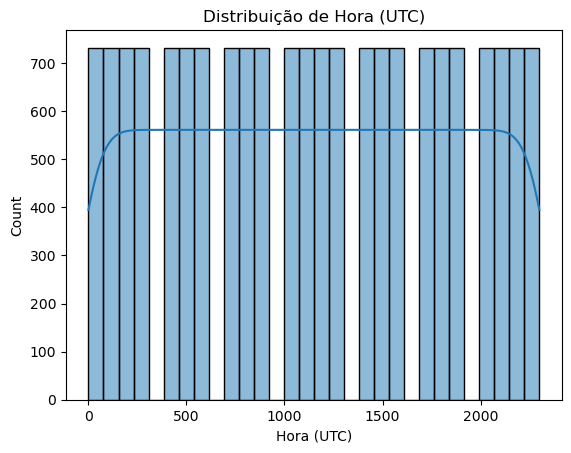

In [16]:
# 8. Verificar distribuição dos dados
print("\nDistribuições:")
for col in numericas:
    plt.figure()
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f"Distribuição de {col}")
    plt.show()

In [17]:
# 9. Calcular média e variância
print("\nMédia e variância das características numéricas:")
print(df[numericas].mean())
print(df[numericas].var())



Média e variância das características numéricas:
Hora (UTC)    1150.0
dtype: float64
Hora (UTC)    479193.943189
dtype: float64


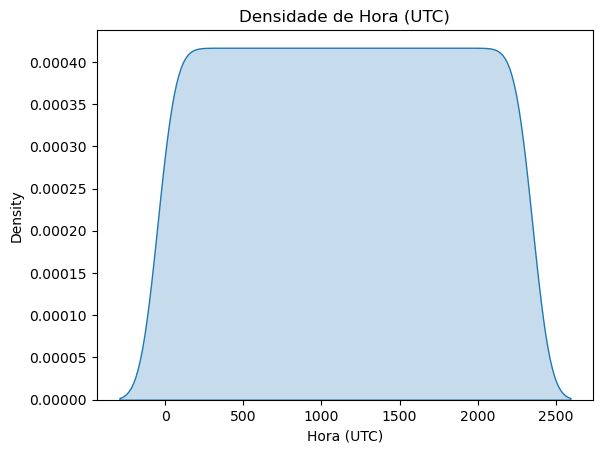

In [18]:
# 10. PDFs e PMFs (visualização de densidade)
for col in numericas:
    plt.figure()
    sns.kdeplot(df[col], fill=True)
    plt.title(f"Densidade de {col}")
    plt.show()


In [19]:
'''
# 11. Identificar correlações significativas
print("\nMatriz de correlação (Pearson):")
correlation_matrix = df[numericas].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz de Correlação")
plt.show()
'''

'\n# 11. Identificar correlações significativas\nprint("\nMatriz de correlação (Pearson):")\ncorrelation_matrix = df[numericas].corr()\nplt.figure(figsize=(10, 8))\nsns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")\nplt.title("Matriz de Correlação")\nplt.show()\n'

In [20]:
'''# 11. Identificar correlações significativas
#Criação de Atributos derivados para análise de correlação 
df['amplitude_Pressao'] = df['Pressao Max. (hPa)'] - df['Pressao Min. (hPa)']
df['amplitude_Umidade'] = df['Umi. Max. (%)'] - df['Umi. Min. (%)']
df['amplitude_Temperatura'] = df['Temp. Max. (C)'] - df['Temp. Min. (C)']
'''

"# 11. Identificar correlações significativas\n#Criação de Atributos derivados para análise de correlação \ndf['amplitude_Pressao'] = df['Pressao Max. (hPa)'] - df['Pressao Min. (hPa)']\ndf['amplitude_Umidade'] = df['Umi. Max. (%)'] - df['Umi. Min. (%)']\ndf['amplitude_Temperatura'] = df['Temp. Max. (C)'] - df['Temp. Min. (C)']\n"

In [21]:
# Converter todas as colunas numéricas para float
df = df.apply(lambda col: pd.to_numeric(col.astype(str).str.replace(',', '.'), errors='coerce') 
              if col.dtype == 'object' else col)

# Agora criar os atributos derivados
df['amplitude_Pressao'] = df['Pressao Max. (hPa)'] - df['Pressao Min. (hPa)']
df['amplitude_Umidade'] = df['Umi. Max. (%)'] - df['Umi. Min. (%)']
df['amplitude_Temperatura'] = df['Temp. Max. (C)'] - df['Temp. Min. (C)']

# Exibir as primeiras linhas para verificar
print(df[['amplitude_Pressao', 'amplitude_Umidade', 'amplitude_Temperatura']].head())


   amplitude_Pressao  amplitude_Umidade  amplitude_Temperatura
0                0.5                2.0                    0.6
1                1.0                0.0                    0.4
2                0.4                2.0                    0.1
3                0.3                4.0                    0.4
4                0.4                1.0                    0.2


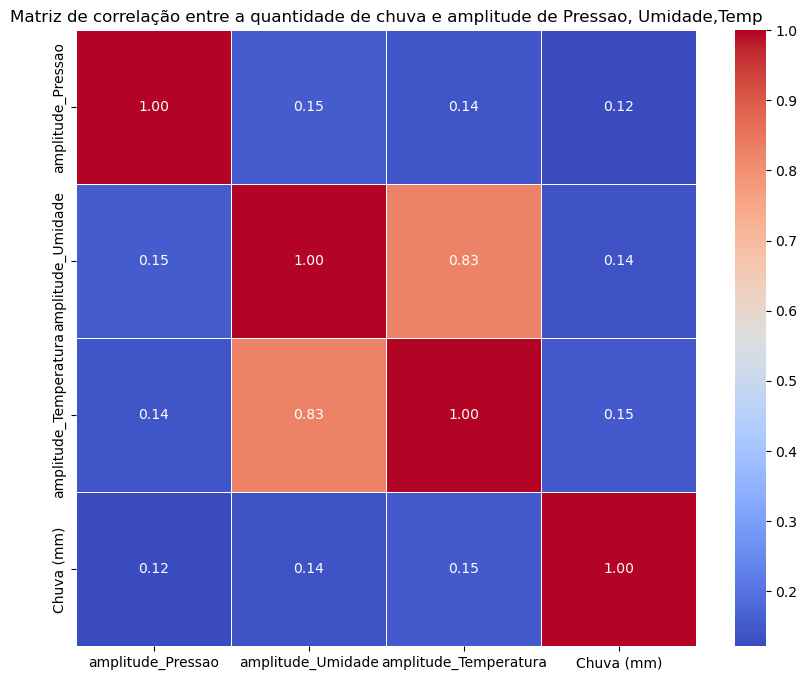

In [22]:
df_reduzido = df[['amplitude_Pressao','amplitude_Umidade','amplitude_Temperatura','Chuva (mm)']]
correlation_matrix = df_reduzido.corr()
plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix,annot=True,cmap = 'coolwarm',fmt=".2f",linewidth=0.5)
plt.title('Matriz de correlação entre a quantidade de chuva e amplitude de Pressao, Umidade,Temp')
plt.show()

In [23]:
# Verificar os primeiros valores do índice
print("Primeiros valores do índice:")
print(df.index)

# Confirmar o tipo do índice
print("\nTipo do índice:")
print(type(df.index))

# Verificar as primeiras linhas do DataFrame
print("\nPrimeiras linhas do DataFrame:")
print(df.head())

Primeiros valores do índice:
RangeIndex(start=0, stop=17568, step=1)

Tipo do índice:
<class 'pandas.core.indexes.range.RangeIndex'>

Primeiras linhas do DataFrame:
   Data  Hora (UTC)  Temp. Ins. (C)  Temp. Max. (C)  Temp. Min. (C)  \
0   NaN           0            19.6            20.2            19.6   
1   NaN         100            19.3            19.6            19.2   
2   NaN         200            19.2            19.3            19.2   
3   NaN         300            18.8            19.2            18.8   
4   NaN         400            18.6            18.8            18.6   

   Umi. Ins. (%)  Umi. Max. (%)  Umi. Min. (%)  Pto Orvalho Ins. (C)  \
0           87.0           88.0           86.0                  17.5   
1           87.0           87.0           87.0                  17.1   
2           88.0           89.0           87.0                  17.2   
3           91.0           91.0           87.0                  17.2   
4           90.0           91.0           90.0  

In [24]:
# Verificar se a coluna 'data_hora' existe
if 'data_hora' not in df.columns:
    print("A coluna 'data_hora' não existe no DataFrame. Tentando criá-la...")

    if 'Data' in df.columns and 'Hora (UTC)' in df.columns:
        df['data_hora'] = pd.to_datetime(
            df['Data'] + ' ' + df['Hora (UTC)'].astype(str).str.zfill(4),
            format='%d/%m/%Y %H%M',
            errors='coerce'
        )
        print("Coluna 'data_hora' criada com sucesso!")
    else:
        print("As colunas 'Data' e/ou 'Hora (UTC)' não estão presentes.")
        raise ValueError("Não foi possível criar a coluna 'data_hora'.")

# Remover valores nulos de 'data_hora'
df = df.dropna(subset=['data_hora'])

# Configurar como índice e garantir que é um DatetimeIndex
df.set_index('data_hora', inplace=True)
df.index = pd.to_datetime(df.index)  # Garantir que o índice está no formato datetime

# Confirmar que o índice é do tipo DatetimeIndex
if isinstance(df.index, pd.DatetimeIndex):
    print("O índice 'data_hora' foi configurado corretamente!")
else:
    print("Erro: O índice não está no formato DatetimeIndex.")


O índice 'data_hora' foi configurado corretamente!


Nomes das colunas no DataFrame: ['Data', 'Hora (UTC)', 'Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)', 'Umi. Ins. (%)', 'Umi. Max. (%)', 'Umi. Min. (%)', 'Pto Orvalho Ins. (C)', 'Pto Orvalho Max. (C)', 'Pto Orvalho Min. (C)', 'Pressao Ins. (hPa)', 'Pressao Max. (hPa)', 'Pressao Min. (hPa)', 'Vel. Vento (m/s)', 'Dir. Vento (m/s)', 'Raj. Vento (m/s)', 'Radiacao (KJ/m²)', 'Chuva (mm)', 'amplitude_Pressao', 'amplitude_Umidade', 'amplitude_Temperatura']

Boxplots para detectar outliers nas colunas numéricas:


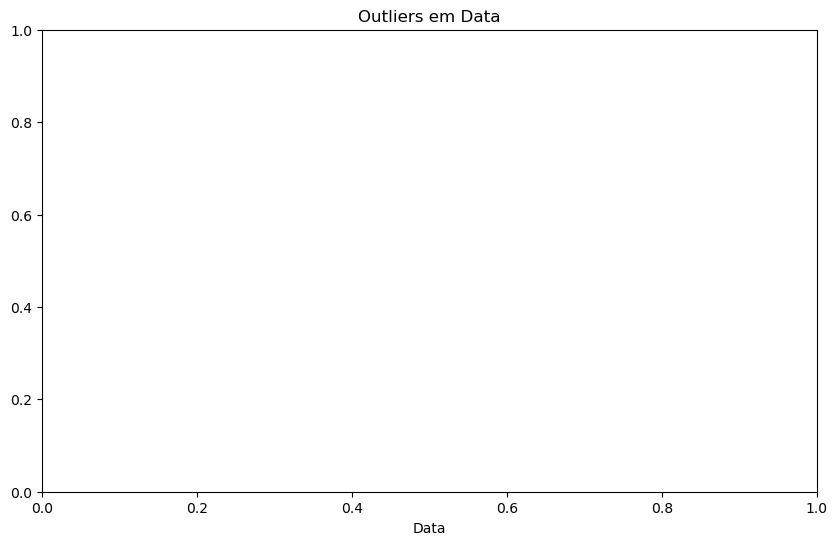

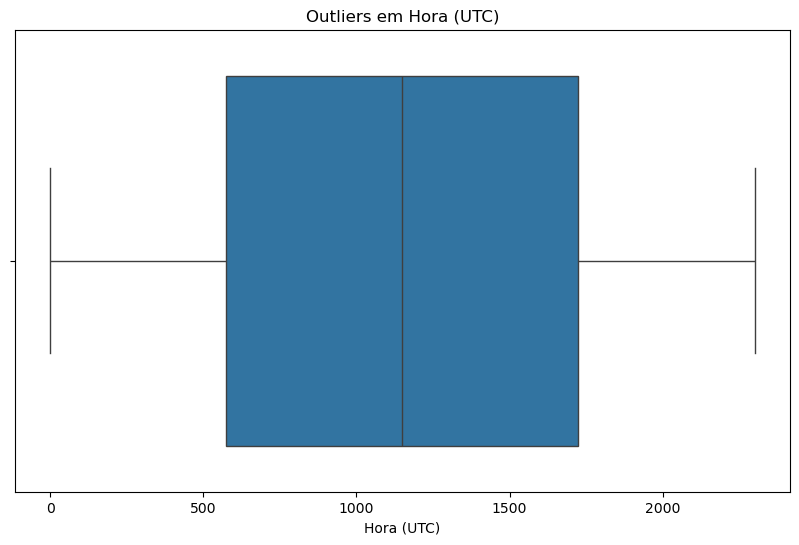

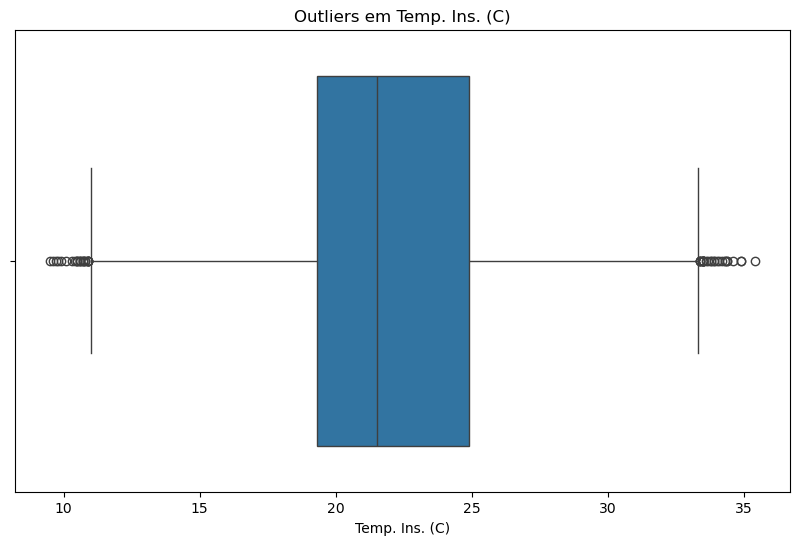

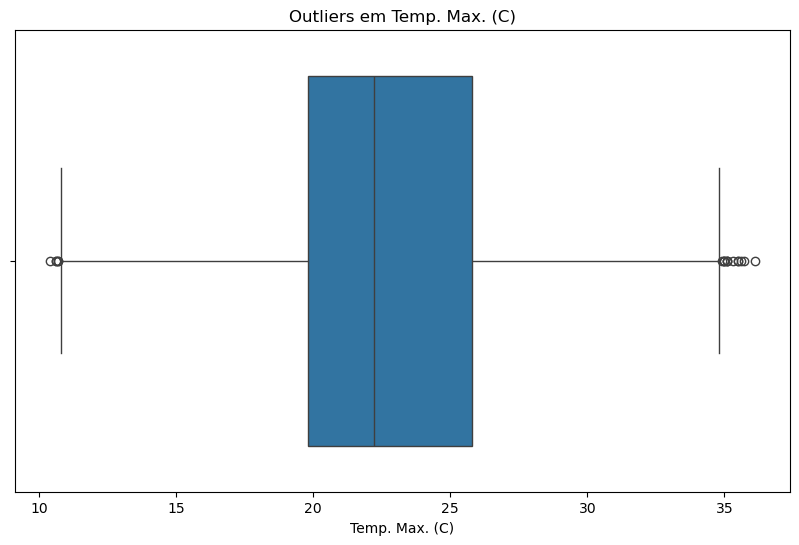

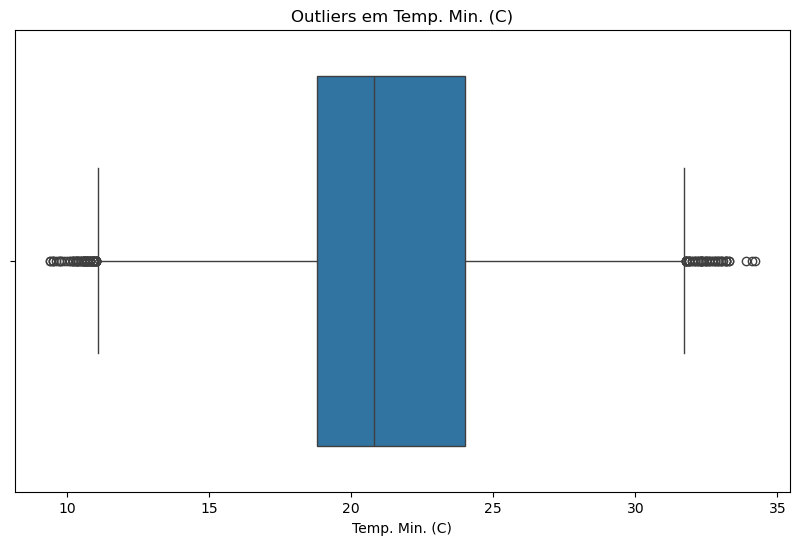

...

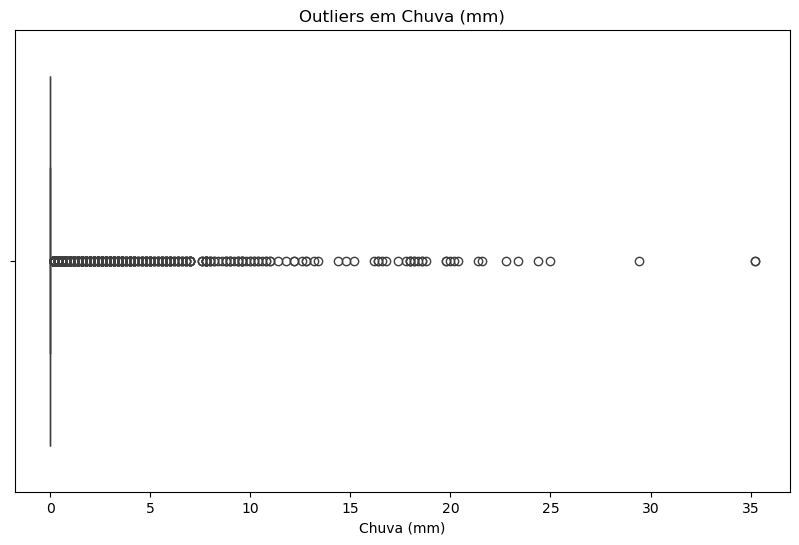

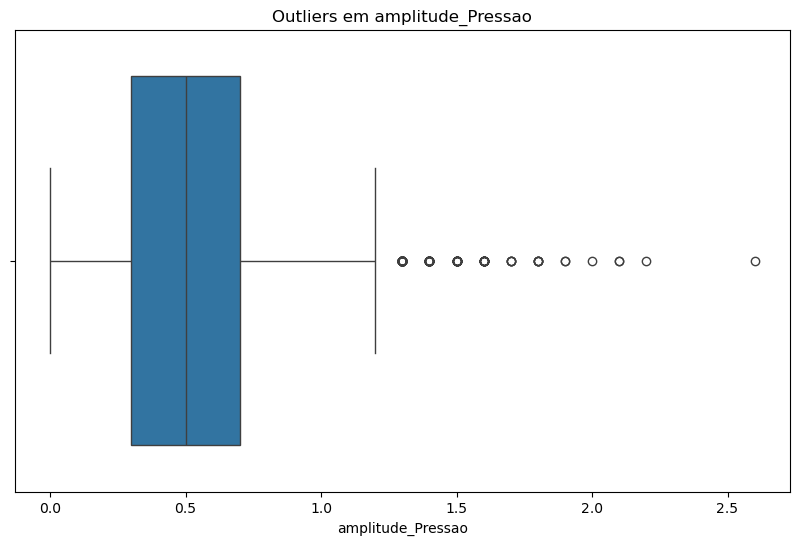

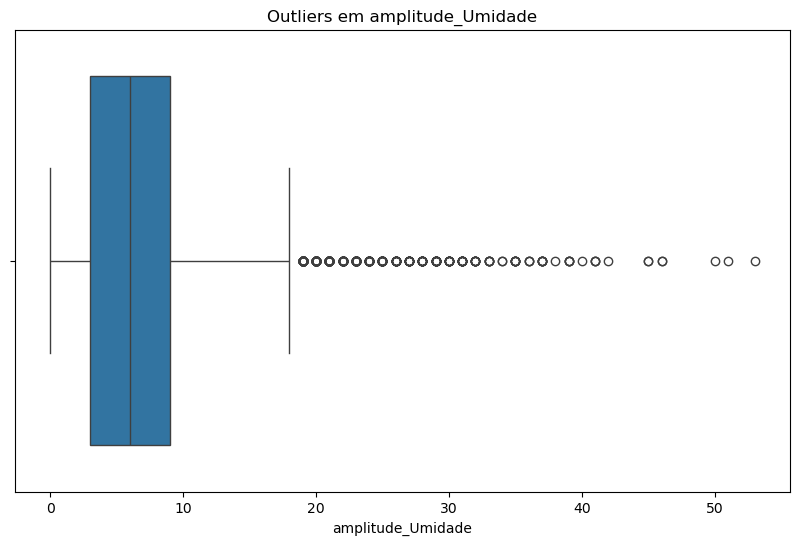

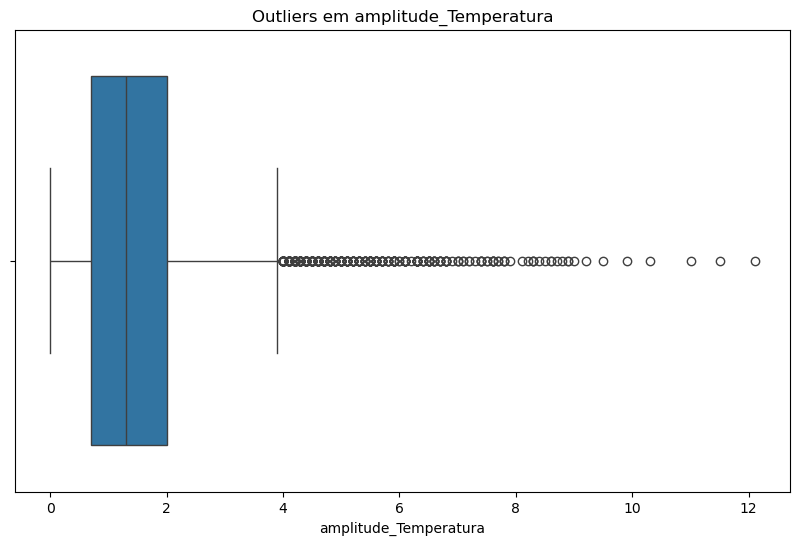

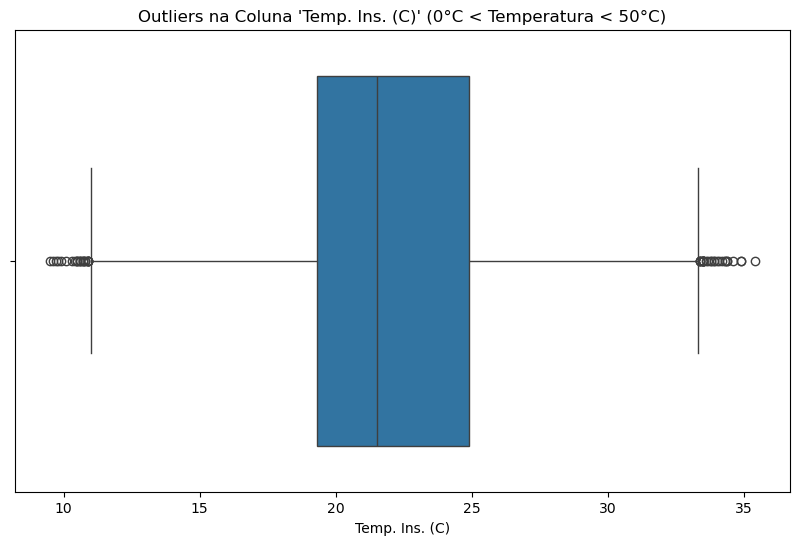


Estatísticas descritivas para valores de temperatura entre 0°C e 50°C (Temp. Ins. (C)):
count    17536.000000
mean        21.985647
std          4.029957
min          9.500000
25%         19.300000
50%         21.500000
75%         24.900000
max         35.400000
Name: Temp. Ins. (C), dtype: float64


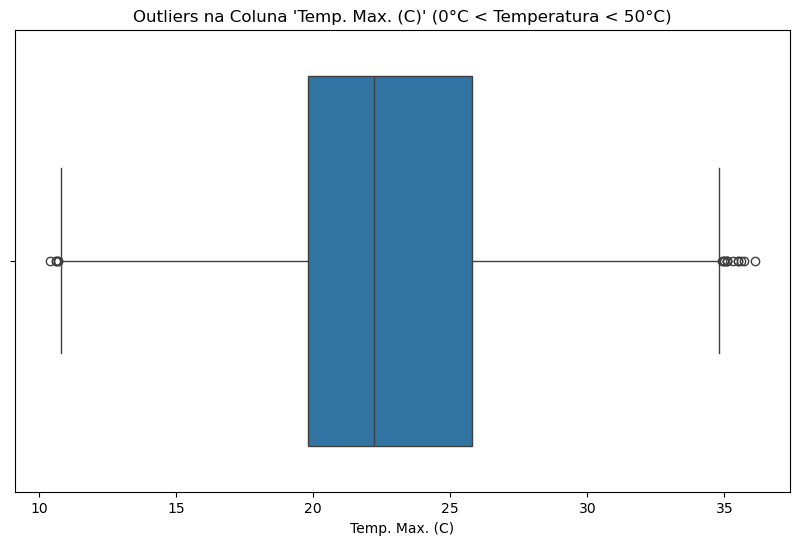


Estatísticas descritivas para valores de temperatura entre 0°C e 50°C (Temp. Max. (C)):
count    17528.000000
mean        22.745847
std          4.105623
min         10.400000
25%         19.800000
50%         22.200000
75%         25.800000
max         36.100000
Name: Temp. Max. (C), dtype: float64


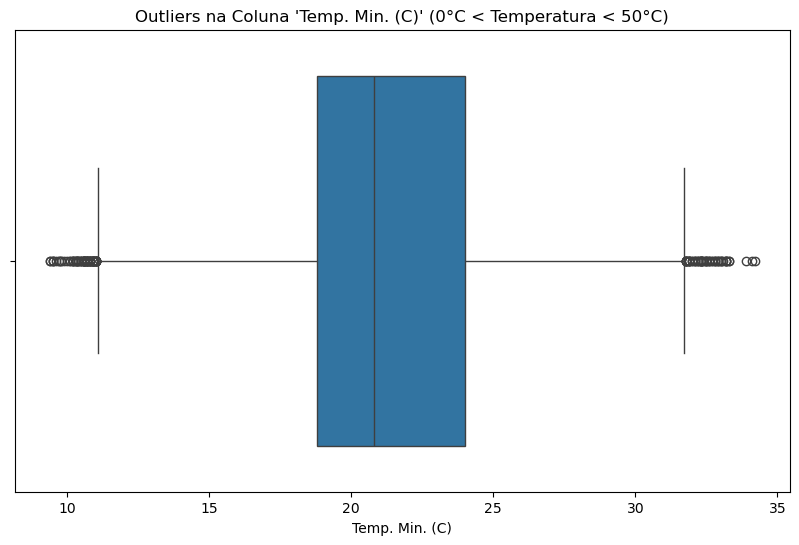


Estatísticas descritivas para valores de temperatura entre 0°C e 50°C (Temp. Min. (C)):
count    17528.000000
mean        21.260486
std          3.929293
min          9.400000
25%         18.800000
50%         20.800000
75%         24.000000
max         34.200000
Name: Temp. Min. (C), dtype: float64


In [25]:
# Verificar nomes exatos das colunas
print("Nomes das colunas no DataFrame:", df.columns.tolist())

# Selecionar apenas colunas numéricas
numericas = df.select_dtypes(include=['float64', 'int64']).columns

print("\nBoxplots para detectar outliers nas colunas numéricas:")
for col in numericas:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[col].dropna())  # Remover valores NaN antes do boxplot
    plt.title(f"Outliers em {col}")
    plt.xlabel(col)
    plt.show()

# Usar os nomes corretos das colunas de temperatura
temp_cols = ['Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)']

for col in temp_cols:
    if col in df.columns:
        # Filtrar valores entre 0°C e 50°C
        dados_temp_filtrada = df[(df[col] > 0) & (df[col] < 50)].dropna(subset=[col])  # Remover NaN

        # Gerar o boxplot para os valores de temperatura filtrados
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=dados_temp_filtrada[col])
        plt.title(f"Outliers na Coluna '{col}' (0°C < Temperatura < 50°C)")
        plt.xlabel(col)
        plt.show()

        # Exibir as estatísticas descritivas para os valores filtrados de temperatura
        print(f"\nEstatísticas descritivas para valores de temperatura entre 0°C e 50°C ({col}):")
        print(dados_temp_filtrada[col].describe())
    else:
        print(f"\nA coluna '{col}' não foi encontrada no DataFrame.")

In [26]:
# Selecionar apenas colunas numéricas
df_numerico = df.select_dtypes(include=['float64', 'int64'])  

# Calcular a matriz de correlações apenas para colunas numéricas
correlacoes = df_numerico.corr()

# Lista de colunas de temperatura
temp_cols = ['Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)']

# Verificar se as colunas de temperatura estão presentes na matriz de correlação
for temp_col in temp_cols:
    if temp_col in correlacoes.index and temp_col in correlacoes.columns:
        # Ordenar os fatores pela correlação com a temperatura correspondente
        fatores_influentes = correlacoes[temp_col].sort_values(ascending=False)
        
        print(f"\nCorrelação dos fatores com {temp_col} (em ordem decrescente):")
        print(fatores_influentes)
    else:
        print(f"\nA coluna '{temp_col}' não está presente na matriz de correlações.")



Correlação dos fatores com Temp. Ins. (C) (em ordem decrescente):
Temp. Ins. (C)           1.000000
Temp. Max. (C)           0.975946
Temp. Min. (C)           0.973968
Radiacao (KJ/m²)         0.629867
Hora (UTC)               0.524070
Raj. Vento (m/s)         0.453419
Vel. Vento (m/s)         0.374411
amplitude_Pressao        0.243749
amplitude_Temperatura    0.174863
amplitude_Umidade        0.131256
Pto Orvalho Max. (C)     0.016320
Pto Orvalho Ins. (C)    -0.042965
Chuva (mm)              -0.073231
Pto Orvalho Min. (C)    -0.081534
Dir. Vento (m/s)        -0.082776
Pressao Max. (hPa)      -0.209353
Pressao Min. (hPa)      -0.233401
Pressao Ins. (hPa)      -0.257330
Umi. Max. (%)           -0.621956
Umi. Min. (%)           -0.636104
Umi. Ins. (%)           -0.653869
Data                          NaN
Name: Temp. Ins. (C), dtype: float64

Correlação dos fatores com Temp. Max. (C) (em ordem decrescente):
Temp. Max. (C)           1.000000
Temp. Ins. (C)           0.975946
Temp. Min. (C


Top 5 fatores mais correlacionados com Temp. Ins. (C):
Temp. Ins. (C)      1.000000
Temp. Max. (C)      0.975946
Temp. Min. (C)      0.973968
Radiacao (KJ/m²)    0.629867
Hora (UTC)          0.524070
Name: Temp. Ins. (C), dtype: float64


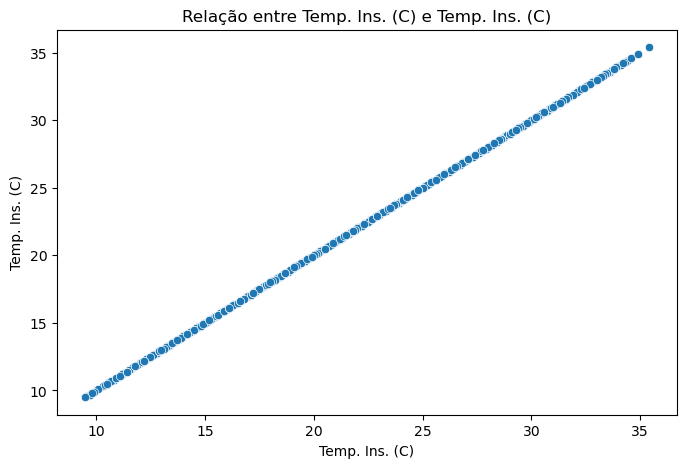

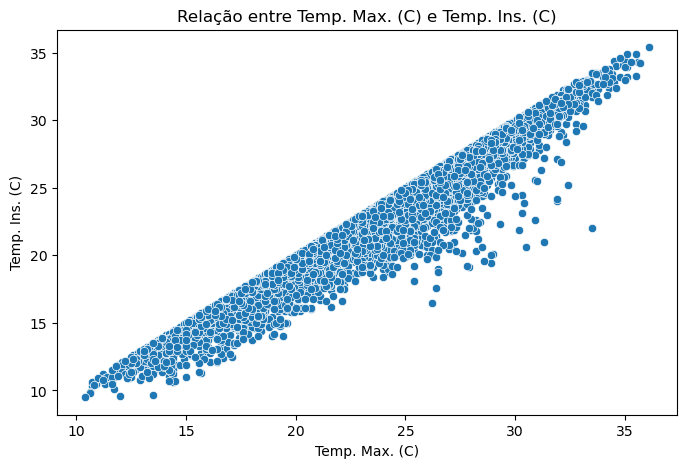

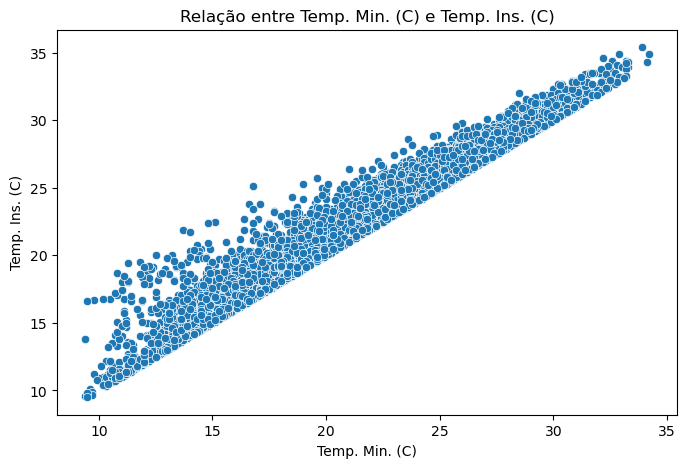

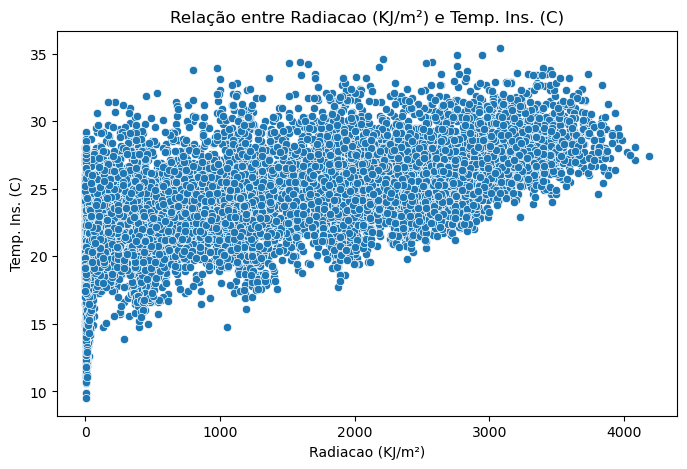

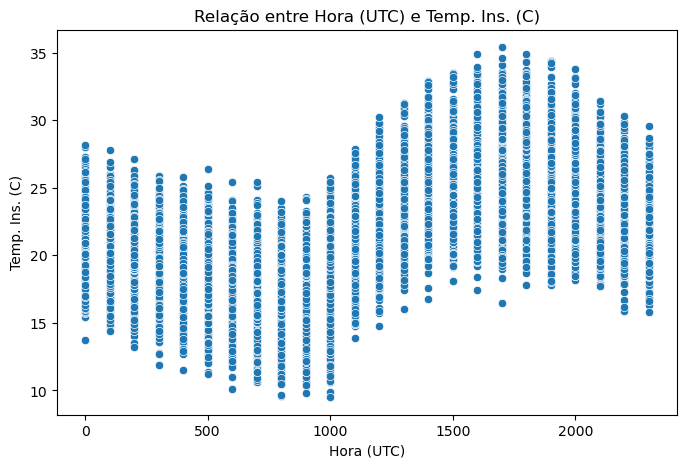


Top 5 fatores mais correlacionados com Temp. Max. (C):
Temp. Max. (C)      1.000000
Temp. Ins. (C)      0.975946
Temp. Min. (C)      0.968173
Radiacao (KJ/m²)    0.560506
Hora (UTC)          0.553912
Name: Temp. Max. (C), dtype: float64


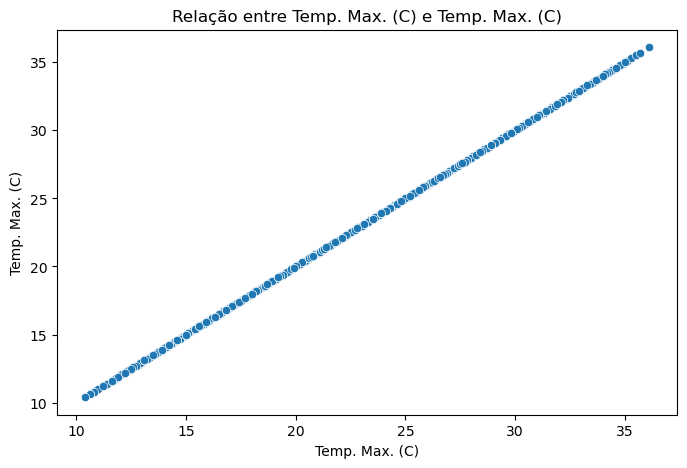

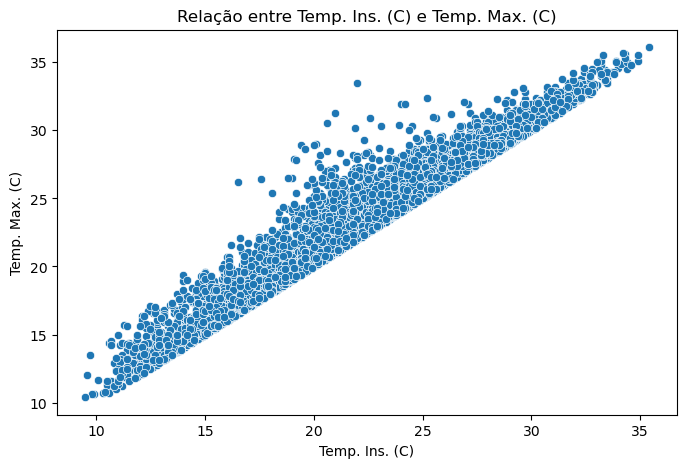

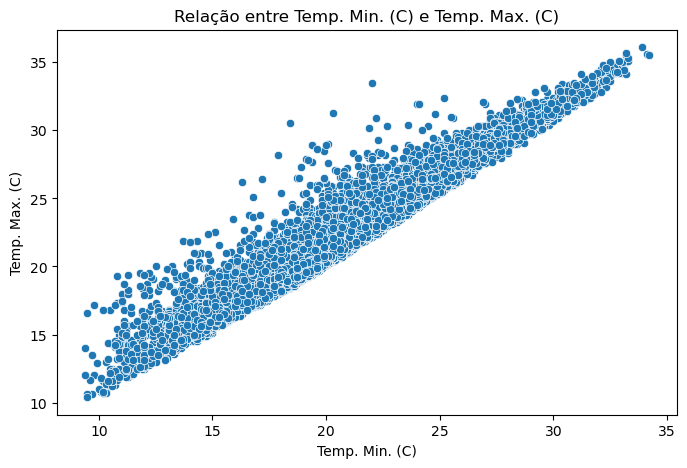

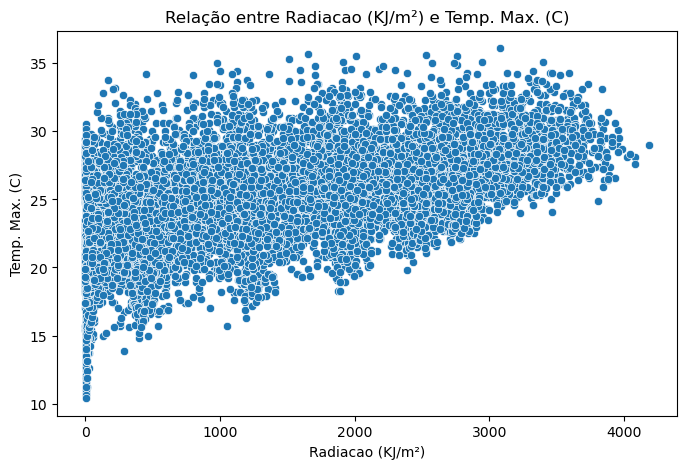

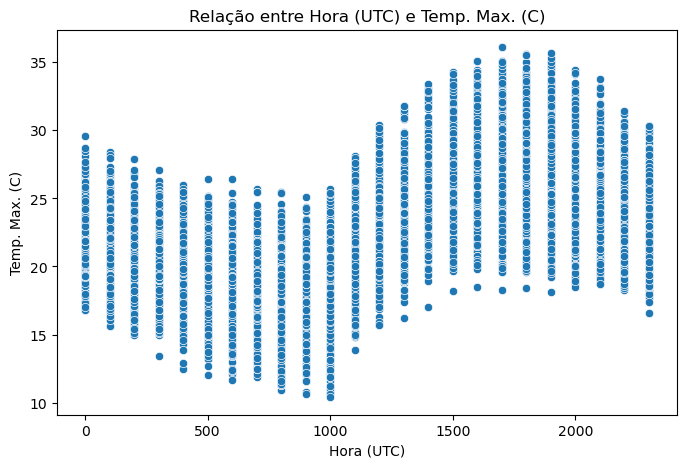


Top 5 fatores mais correlacionados com Temp. Min. (C):
Temp. Min. (C)      1.000000
Temp. Ins. (C)      0.973968
Temp. Max. (C)      0.968173
Radiacao (KJ/m²)    0.541242
Hora (UTC)          0.511498
Name: Temp. Min. (C), dtype: float64


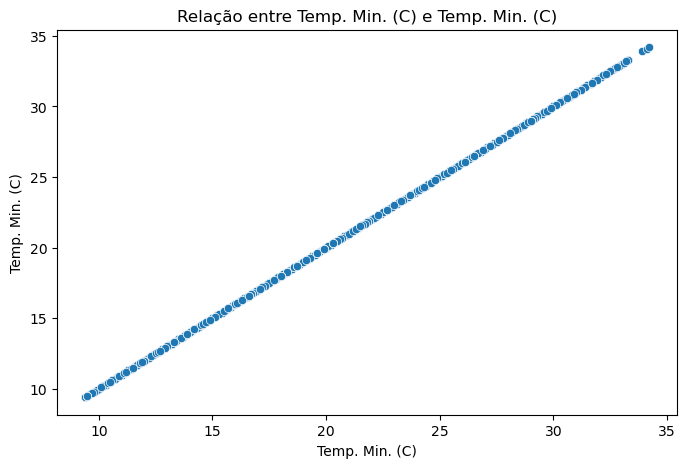

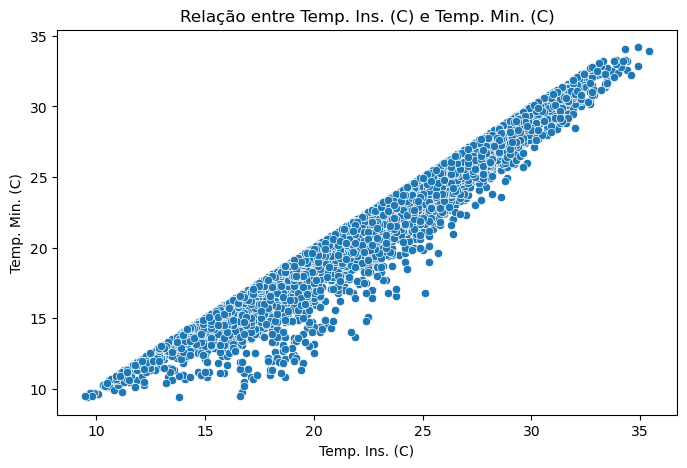

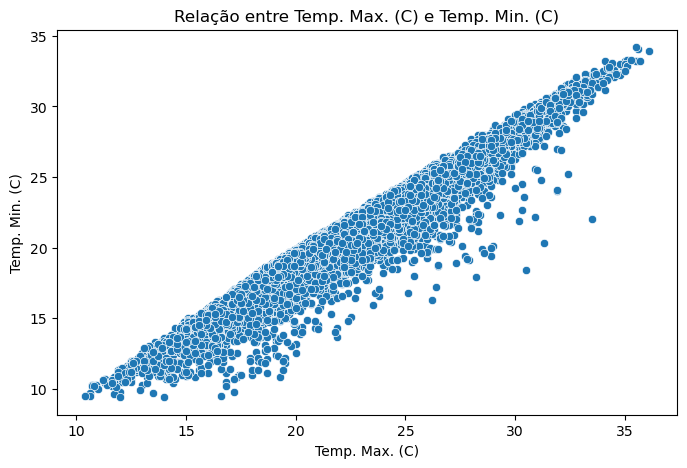

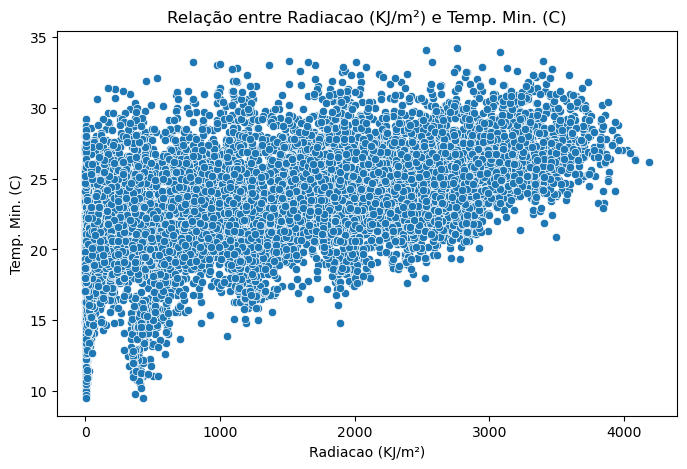

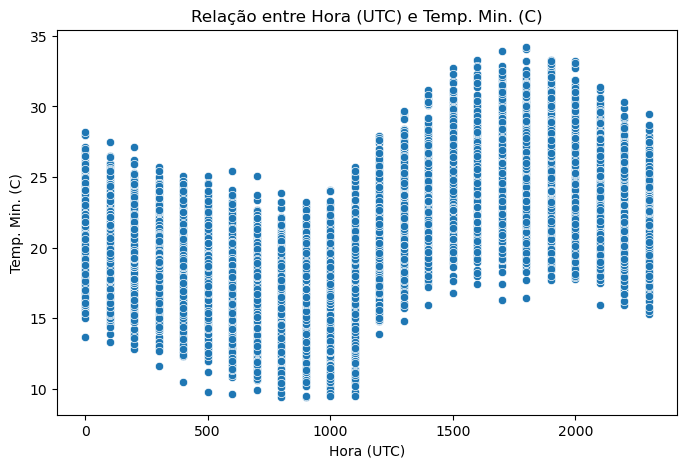

In [27]:
# Selecionar os 5 fatores mais correlacionados para cada tipo de temperatura
temp_cols = ['Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)']

for temp_col in temp_cols:
    if temp_col in correlacoes.columns:
        # Selecionar os 5 fatores mais correlacionados, incluindo a própria temperatura
        fatores_influentes = correlacoes[temp_col].sort_values(ascending=False)
        top_fatores = list(fatores_influentes.index[:5])  

        print(f"\nTop 5 fatores mais correlacionados com {temp_col}:")
        print(fatores_influentes[:5])

        # Gerar gráficos de dispersão
        for fator in top_fatores:
            if fator in df.columns:
                plt.figure(figsize=(8, 5))
                sns.scatterplot(x=df[fator], y=df[temp_col])
                plt.title(f"Relação entre {fator} e {temp_col}")
                plt.xlabel(fator)
                plt.ylabel(temp_col)
                plt.show()
            else:
                print(f"Coluna '{fator}' não encontrada no DataFrame.")
    else:
        print(f"\nA coluna '{temp_col}' não está na matriz de correlações.")



Coluna: Temp. Ins. (C)
Total de outliers detectados: 52


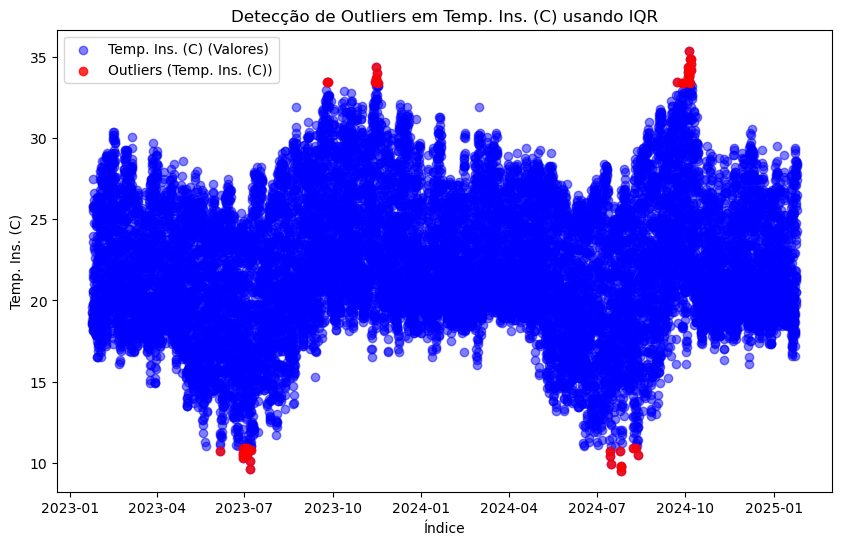


Coluna: Temp. Max. (C)
Total de outliers detectados: 18


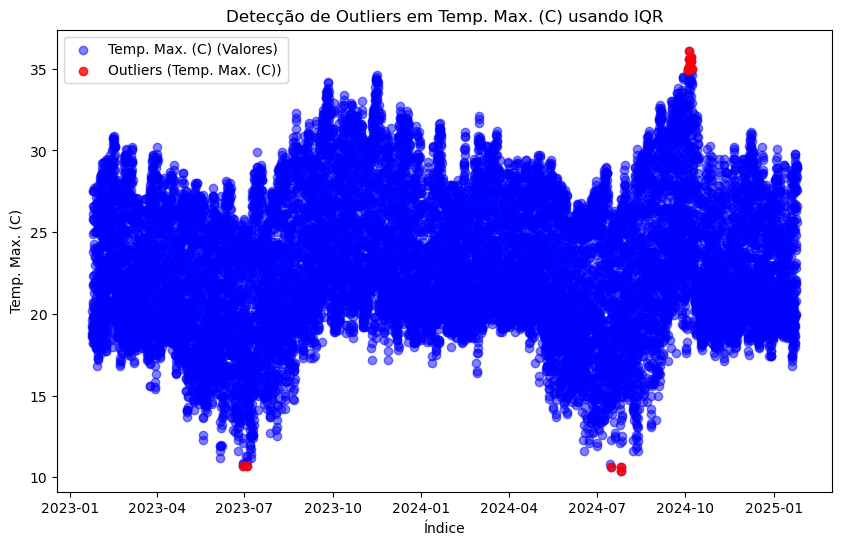


Coluna: Temp. Min. (C)
Total de outliers detectados: 127


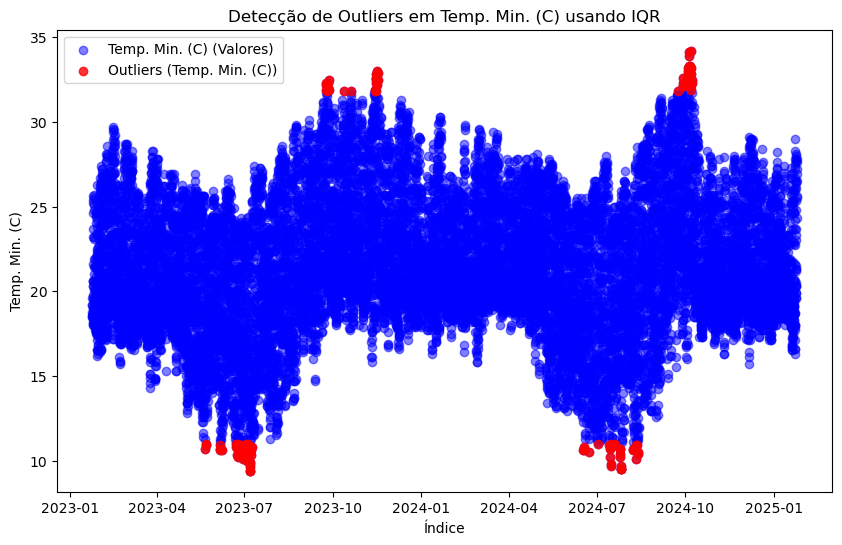

In [28]:
# Lista de colunas de temperatura no dataset
temp_cols = ['Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)']

# Verificar quais colunas de temperatura existem no DataFrame
temp_cols = [col for col in temp_cols if col in df.columns]

# Detectar outliers usando o método IQR para cada coluna de temperatura
for coluna in temp_cols:
    Q1 = df[coluna].quantile(0.25)
    Q3 = df[coluna].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filtrar outliers
    outliers = df[(df[coluna] < lower_bound) | (df[coluna] > upper_bound)]

    # Exibir a quantidade de outliers
    print(f"\nColuna: {coluna}")
    print(f"Total de outliers detectados: {len(outliers)}")

    # Criar gráfico de dispersão para visualizar os outliers
    plt.figure(figsize=(10, 6))
    plt.scatter(df.index, df[coluna], label=f'{coluna} (Valores)', color='blue', alpha=0.5)
    plt.scatter(outliers.index, outliers[coluna], label=f'Outliers ({coluna})', color='red', alpha=0.8)
    
    plt.title(f"Detecção de Outliers em {coluna} usando IQR")
    plt.xlabel("Índice")
    plt.ylabel(coluna)
    plt.legend()
    plt.show()


Observando a correlação por módulo a partir daqui.

In [29]:
# Selecionar apenas colunas numéricas
df_numerico = df.select_dtypes(include=['float64', 'int64'])  

# Calcular a matriz de correlações apenas para colunas numéricas
correlacoes = df_numerico.corr()

# Lista de colunas de temperatura
temp_cols = ['Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)']


# Identificar os fatores mais correlacionados em módulo para cada temperatura
for temp_col in temp_cols:
    if temp_col in correlacoes.columns:
        # Selecionar os 5 fatores mais correlacionados, excluindo a própria temperatura
        fatores_influentes = correlacoes[temp_col].sort_values(ascending=False).iloc[1:6]  # Exclui a própria variável
        top_fatores = list(fatores_influentes.index)

        print(f"\nTop 5 fatores mais correlacionados (em módulo) com {temp_col}:")
        print(fatores_influentes)
    else:
        print(f"\nA coluna '{temp_col}' não está presente na matriz de correlações.")



Top 5 fatores mais correlacionados (em módulo) com Temp. Ins. (C):
Temp. Max. (C)      0.975946
Temp. Min. (C)      0.973968
Radiacao (KJ/m²)    0.629867
Hora (UTC)          0.524070
Raj. Vento (m/s)    0.453419
Name: Temp. Ins. (C), dtype: float64

Top 5 fatores mais correlacionados (em módulo) com Temp. Max. (C):
Temp. Ins. (C)      0.975946
Temp. Min. (C)      0.968173
Radiacao (KJ/m²)    0.560506
Hora (UTC)          0.553912
Raj. Vento (m/s)    0.469476
Name: Temp. Max. (C), dtype: float64

Top 5 fatores mais correlacionados (em módulo) com Temp. Min. (C):
Temp. Ins. (C)      0.973968
Temp. Max. (C)      0.968173
Radiacao (KJ/m²)    0.541242
Hora (UTC)          0.511498
Raj. Vento (m/s)    0.442104
Name: Temp. Min. (C), dtype: float64


In [30]:
# Selecionar apenas colunas numéricas
df_numerico = df.select_dtypes(include=['float64', 'int64'])

# Calcular a matriz de correlações em módulo
correlacoes = df_numerico.corr().abs()  # Utiliza valores absolutos das correlações

# Lista de colunas de temperatura
temp_cols = ['Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)']

# Dicionário para armazenar os fatores mais correlacionados para cada temperatura
fatores_correlacionados = {}

# Identificar os fatores mais correlacionados em módulo para cada tipo de temperatura,
# excluindo a própria temperatura e as demais variáveis de temperatura
for temp_col in temp_cols:
    if temp_col in correlacoes.columns:
        # Selecionar os 5 fatores mais correlacionados, excluindo todas as colunas de temperatura
        fatores_influentes = correlacoes[temp_col].drop(temp_cols, errors='ignore').sort_values(ascending=False).iloc[:5]
        fatores_correlacionados[temp_col] = list(fatores_influentes.index)

        print(f"\nTop 5 fatores mais correlacionados (em módulo) com {temp_col} (excluindo outras temperaturas):")
        print(fatores_influentes)




Top 5 fatores mais correlacionados (em módulo) com Temp. Ins. (C) (excluindo outras temperaturas):
Umi. Ins. (%)       0.653869
Umi. Min. (%)       0.636104
Radiacao (KJ/m²)    0.629867
Umi. Max. (%)       0.621956
Hora (UTC)          0.524070
Name: Temp. Ins. (C), dtype: float64

Top 5 fatores mais correlacionados (em módulo) com Temp. Max. (C) (excluindo outras temperaturas):
Umi. Min. (%)       0.683237
Umi. Ins. (%)       0.664192
Umi. Max. (%)       0.645779
Radiacao (KJ/m²)    0.560506
Hora (UTC)          0.553912
Name: Temp. Max. (C), dtype: float64

Top 5 fatores mais correlacionados (em módulo) com Temp. Min. (C) (excluindo outras temperaturas):
Umi. Max. (%)       0.619669
Umi. Ins. (%)       0.614527
Umi. Min. (%)       0.609853
Radiacao (KJ/m²)    0.541242
Hora (UTC)          0.511498
Name: Temp. Min. (C), dtype: float64


In [31]:
# Excluir colunas de tempo antes de calcular a matriz de correlação
colunas_tempo = ['Hora (UTC)', 'data_hora']
df_numerico = df.select_dtypes(include=['float64', 'int64']).drop(columns=[col for col in colunas_tempo if col in df.columns], errors='ignore')

# Lista de colunas de temperatura
temp_cols = ['Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)']

# Lista de colunas de umidade
umidade_cols = ['Umi. Ins. (%)', 'Umi. Min. (%)', 'Umi. Max. (%)']
umidade_cols = [col for col in umidade_cols if col in df.columns]  # Garantir que existem

# Dicionário para armazenar os fatores mais correlacionados para cada temperatura
fatores_correlacionados = {}

# Calcular a matriz de correlações em módulo
correlacoes = df_numerico.corr().abs()  # Utiliza valores absolutos das correlações

# Identificar os fatores mais correlacionados para cada temperatura, considerando apenas a umidade mais influente
for temp_col in temp_cols:
    if temp_col in correlacoes.columns:
        # Selecionar a umidade mais influente em módulo para a temperatura analisada
        if umidade_cols:
            correlacoes_umidade = correlacoes[temp_col][umidade_cols].dropna()
            if not correlacoes_umidade.empty:
                umidade_mais_influente = correlacoes_umidade.idxmax()  # Seleciona a de maior correlação em módulo
            else:
                umidade_mais_influente = None
        else:
            umidade_mais_influente = None

        # Selecionar os 5 fatores mais correlacionados, excluindo todas as colunas de temperatura e tempo
        fatores_influentes = correlacoes[temp_col].drop(temp_cols + umidade_cols, errors='ignore').sort_values(ascending=False).iloc[:4]

        # Se houver umidade influente, adicioná-la aos fatores
        if umidade_mais_influente:
            fatores_influentes = pd.concat([pd.Series({umidade_mais_influente: correlacoes[temp_col][umidade_mais_influente]}), fatores_influentes])

        fatores_correlacionados[temp_col] = list(fatores_influentes.index)

        print(f"\nTop 5 fatores mais correlacionados (em módulo) com {temp_col} (excluindo outras temperaturas e tempo, mantendo apenas a umidade mais influente):")
        print(fatores_influentes)
    else:
        print(f"\nA coluna '{temp_col}' não está na matriz de correlações.")



Top 5 fatores mais correlacionados (em módulo) com Temp. Ins. (C) (excluindo outras temperaturas e tempo, mantendo apenas a umidade mais influente):
Umi. Ins. (%)         0.653869
Radiacao (KJ/m²)      0.629867
Raj. Vento (m/s)      0.453419
Vel. Vento (m/s)      0.374411
Pressao Ins. (hPa)    0.257330
dtype: float64

Top 5 fatores mais correlacionados (em módulo) com Temp. Max. (C) (excluindo outras temperaturas e tempo, mantendo apenas a umidade mais influente):
Umi. Min. (%)            0.683237
Radiacao (KJ/m²)         0.560506
Raj. Vento (m/s)         0.469476
Vel. Vento (m/s)         0.362352
amplitude_Temperatura    0.293014
dtype: float64

Top 5 fatores mais correlacionados (em módulo) com Temp. Min. (C) (excluindo outras temperaturas e tempo, mantendo apenas a umidade mais influente):
Umi. Max. (%)         0.619669
Radiacao (KJ/m²)      0.541242
Raj. Vento (m/s)      0.442104
Vel. Vento (m/s)      0.348178
Pressao Ins. (hPa)    0.311850
dtype: float64



Top 5 fatores mais correlacionados (em módulo) com Temp. Ins. (C), considerando apenas a umidade mais influente:
Umi. Ins. (%)         0.653869
Radiacao (KJ/m²)      0.629867
Raj. Vento (m/s)      0.453419
Vel. Vento (m/s)      0.374411
Pressao Ins. (hPa)    0.257330
dtype: float64


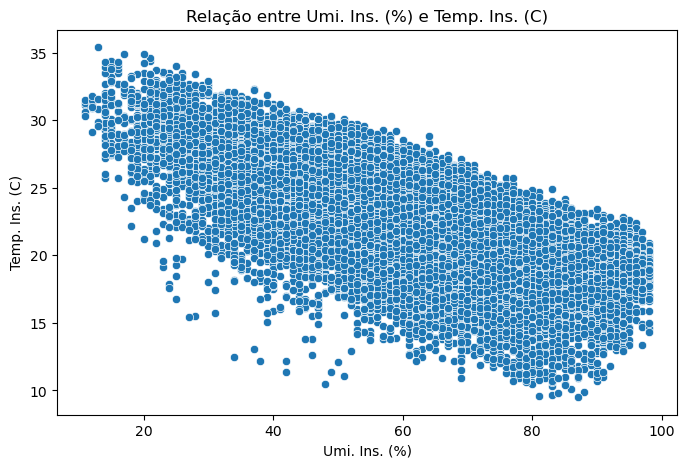

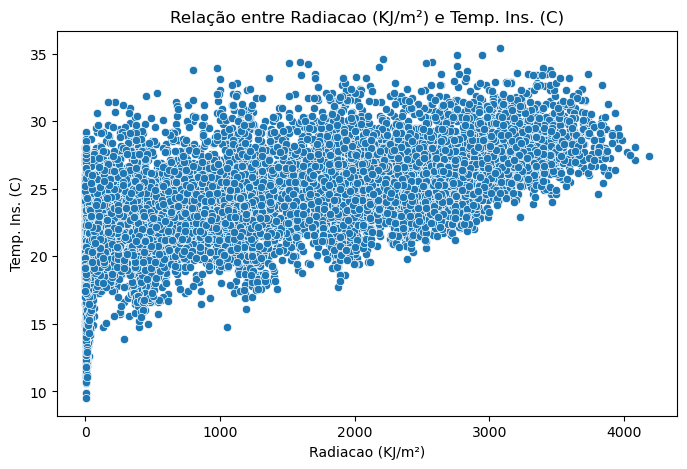

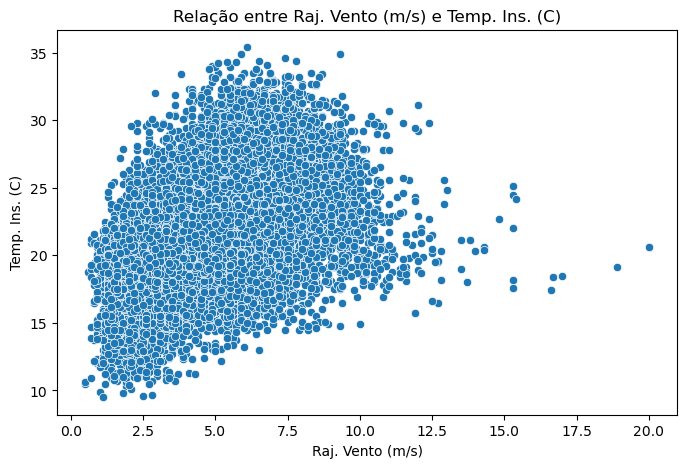

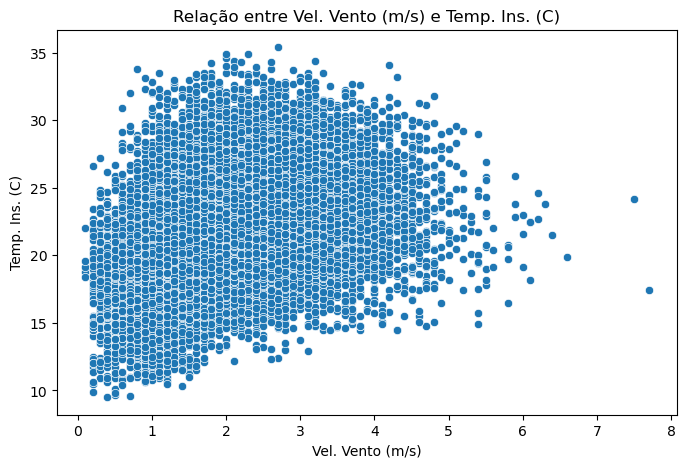

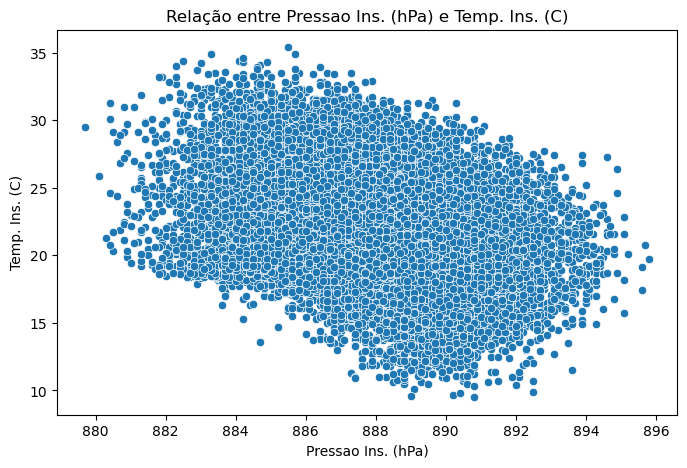


Top 5 fatores mais correlacionados (em módulo) com Temp. Max. (C), considerando apenas a umidade mais influente:
Umi. Min. (%)            0.683237
Radiacao (KJ/m²)         0.560506
Raj. Vento (m/s)         0.469476
Vel. Vento (m/s)         0.362352
amplitude_Temperatura    0.293014
dtype: float64


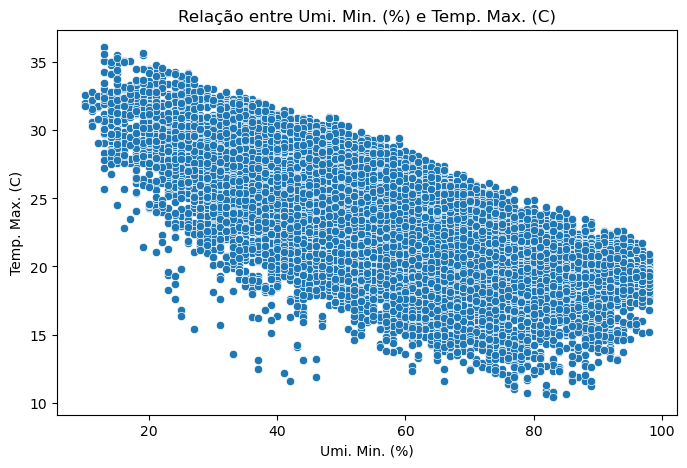

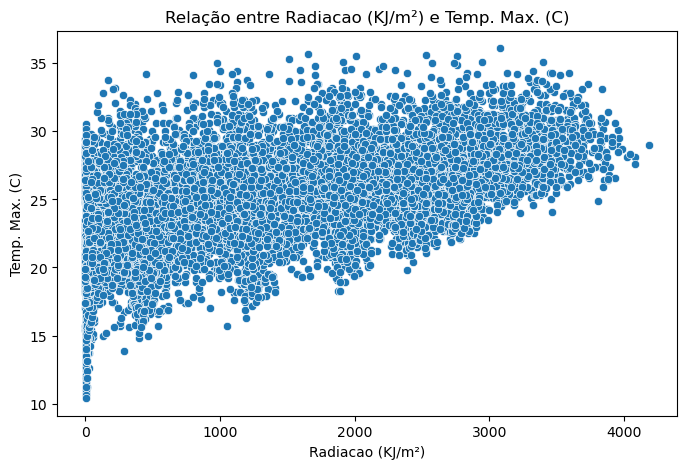

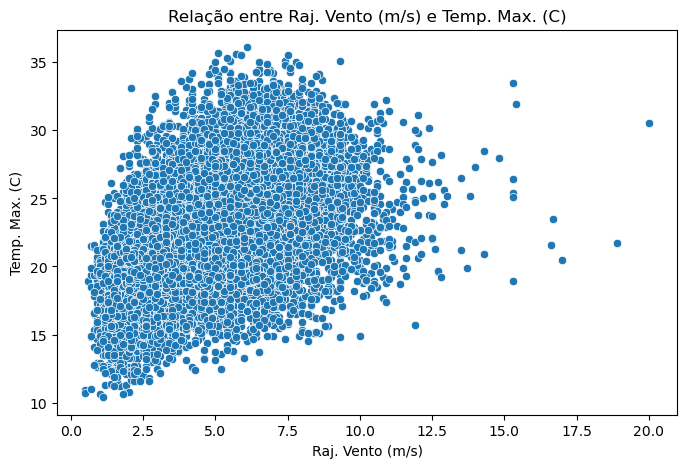

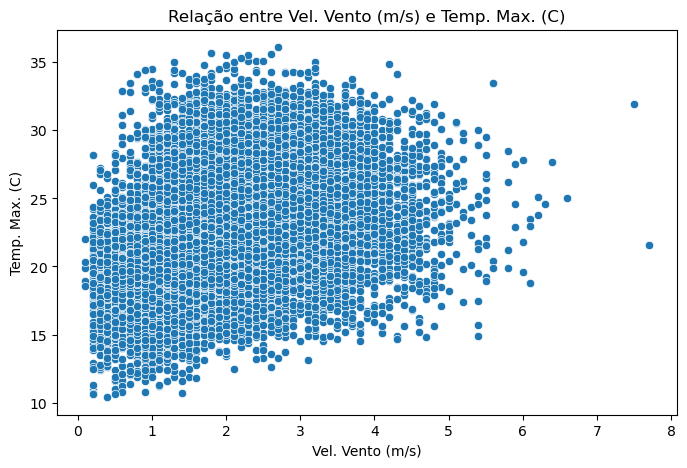

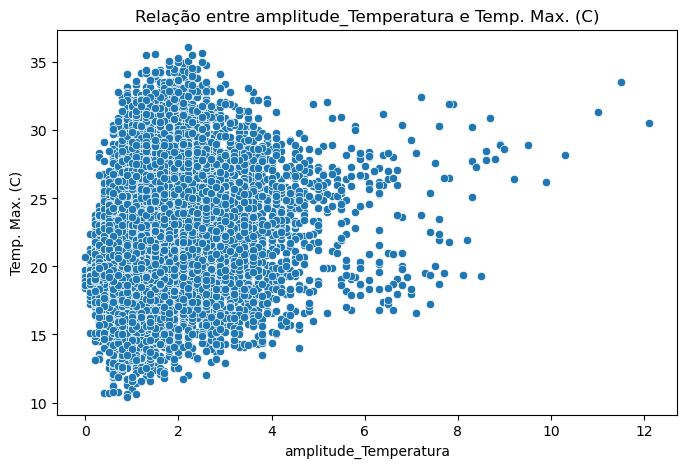


Top 5 fatores mais correlacionados (em módulo) com Temp. Min. (C), considerando apenas a umidade mais influente:
Umi. Max. (%)         0.619669
Radiacao (KJ/m²)      0.541242
Raj. Vento (m/s)      0.442104
Vel. Vento (m/s)      0.348178
Pressao Ins. (hPa)    0.311850
dtype: float64


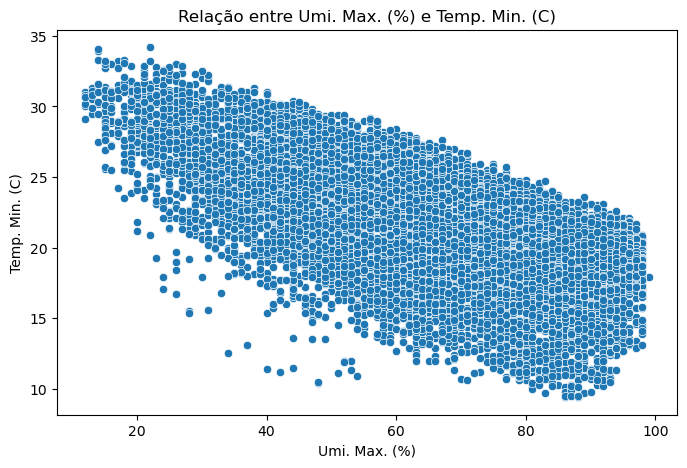

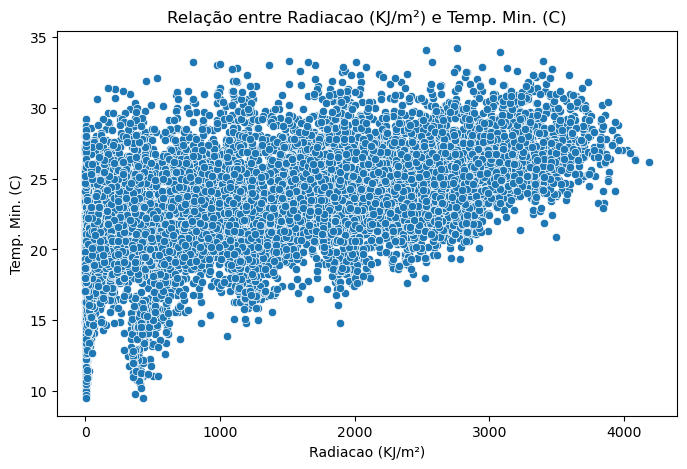

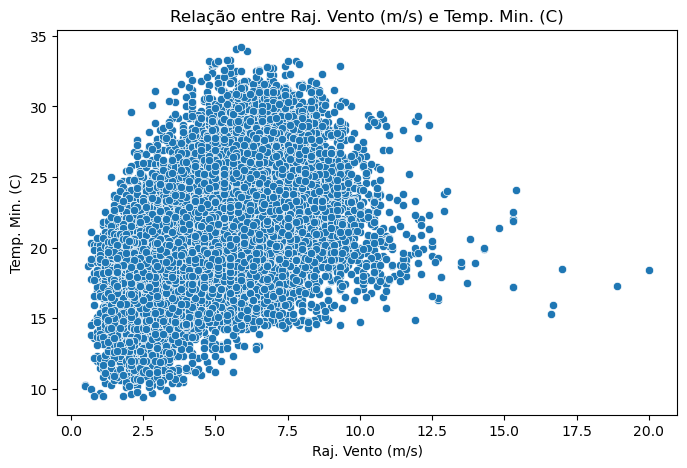

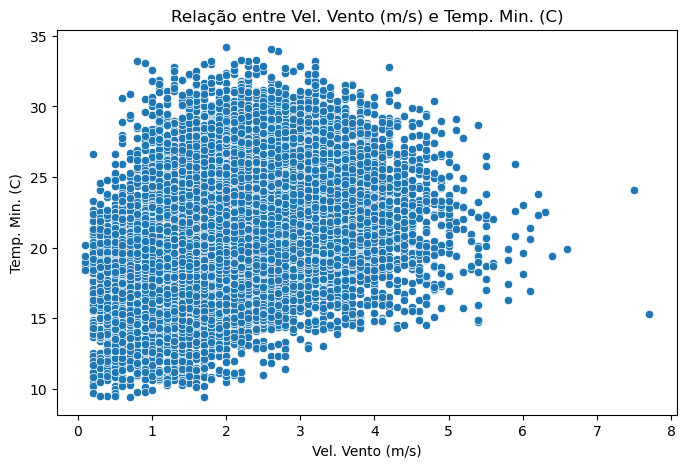

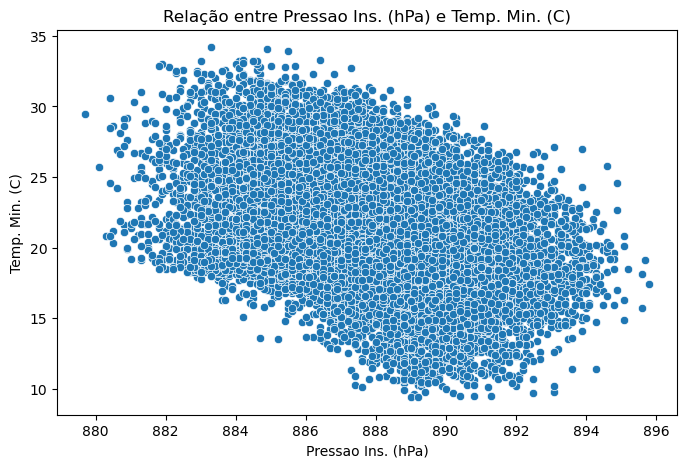

In [32]:
# Lista de colunas de umidade
umidade_cols = ['Umi. Ins. (%)', 'Umi. Min. (%)', 'Umi. Max. (%)']
umidade_cols = [col for col in umidade_cols if col in df.columns]  # Garantir que existem

# Calcular a matriz de correlações em módulo
correlacoes = df_numerico.corr().abs()  # Utiliza valores absolutos das correlações

# Lista de colunas de temperatura
temp_cols = ['Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)']

# Identificar os fatores mais correlacionados em módulo para cada tipo de temperatura
for temp_col in temp_cols:
    if temp_col in correlacoes.columns:
        # Selecionar a umidade mais influente em módulo para a temperatura analisada
        if umidade_cols:
            correlacoes_umidade = correlacoes[temp_col][umidade_cols].dropna()
            if not correlacoes_umidade.empty:
                umidade_mais_influente = correlacoes_umidade.idxmax()  # Seleciona a de maior correlação em módulo
            else:
                umidade_mais_influente = None
        else:
            umidade_mais_influente = None

        # Selecionar os 5 fatores mais correlacionados, excluindo todas as colunas de temperatura e tempo
        fatores_influentes = correlacoes[temp_col].drop(temp_cols + umidade_cols, errors='ignore').sort_values(ascending=False).iloc[:4]

        # Se houver umidade influente, adicioná-la aos fatores
        if umidade_mais_influente:
            fatores_influentes = pd.concat([pd.Series({umidade_mais_influente: correlacoes[temp_col][umidade_mais_influente]}), fatores_influentes])

        top_fatores = list(fatores_influentes.index)

        print(f"\nTop 5 fatores mais correlacionados (em módulo) com {temp_col}, considerando apenas a umidade mais influente:")
        print(fatores_influentes)

        # Gerar gráficos de dispersão para os fatores mais influentes
        for fator in top_fatores:
            if fator in df.columns:
                plt.figure(figsize=(8, 5))
                sns.scatterplot(x=df[fator], y=df[temp_col])
                plt.title(f"Relação entre {fator} e {temp_col}")
                plt.xlabel(fator)
                plt.ylabel(temp_col)
                plt.show()
            else:
                print(f"Coluna '{fator}' não encontrada no DataFrame.")
    else:
        print(f"\nA coluna '{temp_col}' não está na matriz de correlações.")



Coluna: Temp. Ins. (C)
Total de outliers detectados: 52

Coluna: Temp. Max. (C)
Total de outliers detectados: 18

Coluna: Temp. Min. (C)
Total de outliers detectados: 127


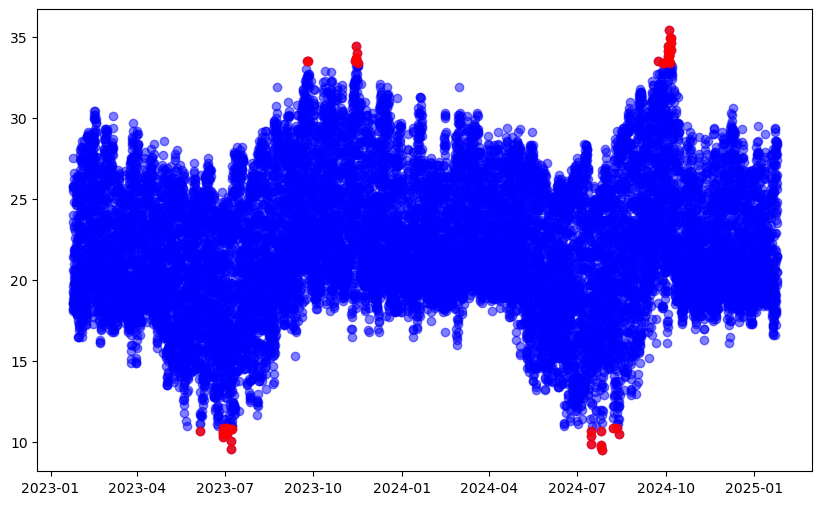

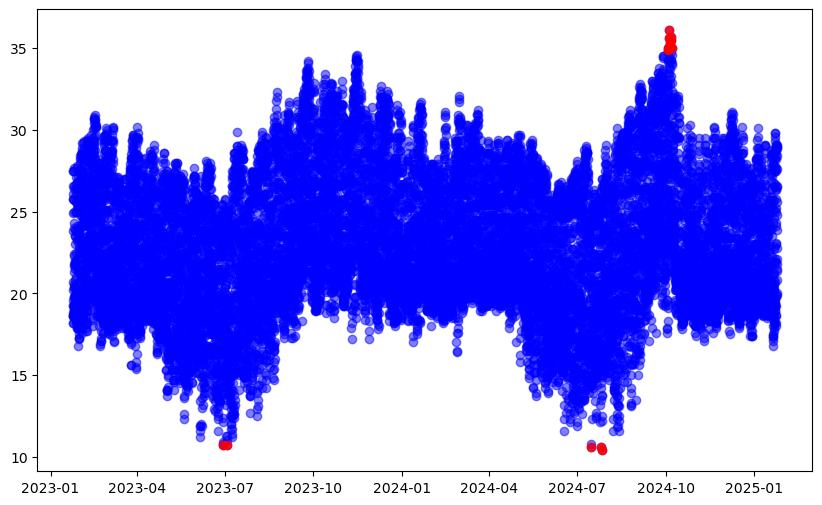

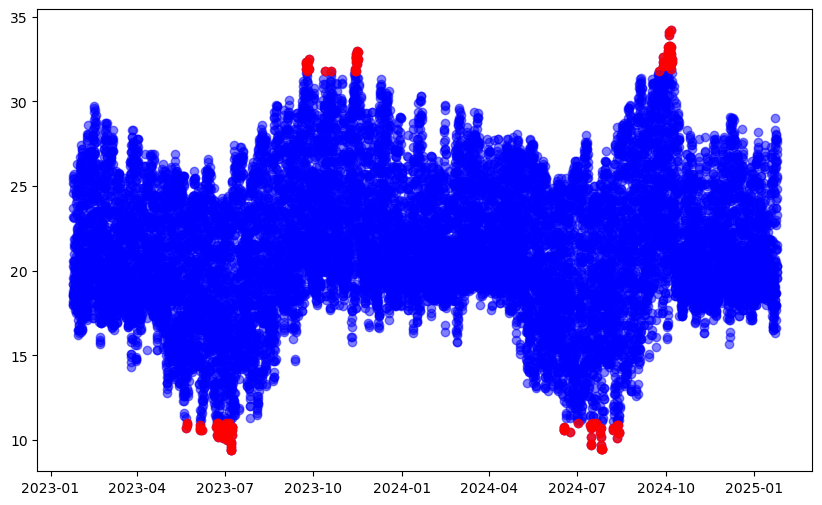

In [33]:
import matplotlib.pyplot as plt

# Lista de colunas de temperatura no dataset
temp_cols = ['Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)']
temp_cols = [col for col in temp_cols if col in df.columns]  # Garantir que as colunas existem

# Detectar outliers usando o método IQR para cada coluna de temperatura
outliers_dict = {}  # Dicionário para armazenar os outliers por coluna

for coluna in temp_cols:
    # Calcular os quartis e o intervalo interquartil (IQR)
    Q1 = df[coluna].quantile(0.25)
    Q3 = df[coluna].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filtrar os outliers
    outliers = df[(df[coluna] < lower_bound) | (df[coluna] > upper_bound)]
    outliers_dict[coluna] = outliers

    # Exibir a quantidade de outliers
    print(f"\nColuna: {coluna}")
    print(f"Total de outliers detectados: {len(outliers)}")

    # Criar gráfico de dispersão para visualizar os outliers
    plt.figure(figsize=(10, 6))
    plt.scatter(df.index, df[coluna], label=f'{coluna} (Valores)', color='blue', alpha=0.5)
    plt.scatter(outliers.index, outliers[coluna], label=f'Outliers ({coluna})', color='red', alpha=0.8)
    
    plt.title



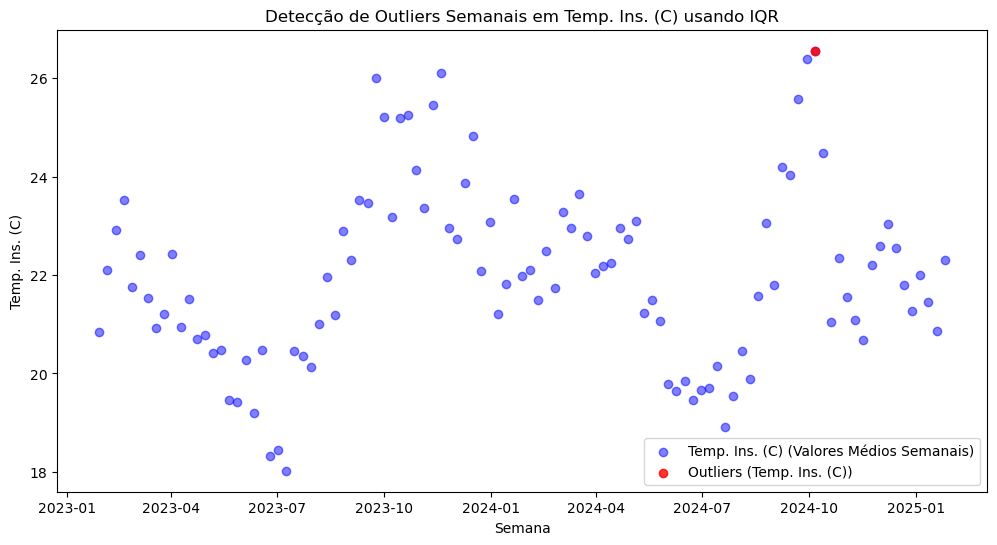

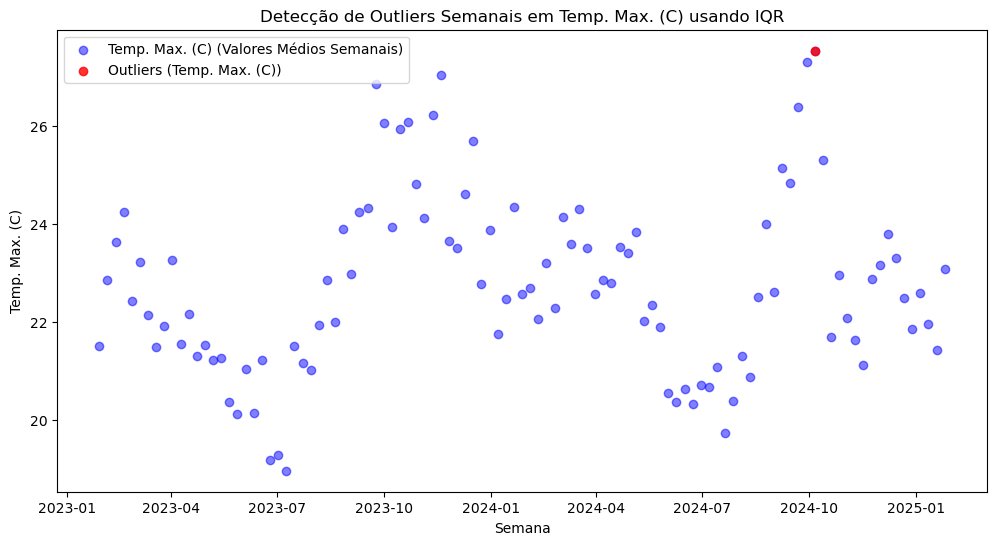

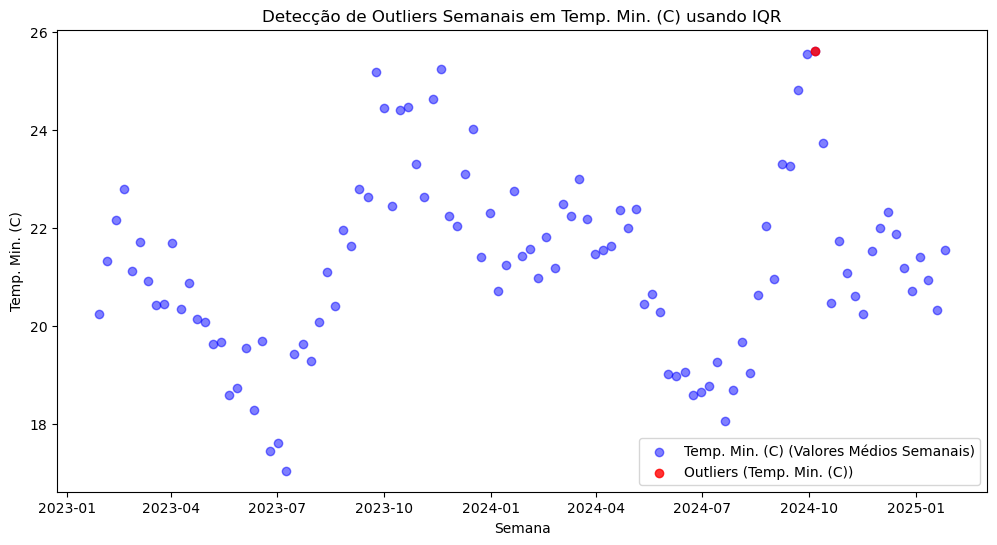

In [34]:
# Lista de colunas de temperatura no dataset em semana
#Decisão feita porque a predição será feita na forma de previsão por semana.
temp_cols = ['Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)']
temp_cols = [col for col in temp_cols if col in df.columns]  # Garantir que as colunas existem

# Resample para dados semanais (média por semana)
df_semanal = df.resample('W').mean()

# Detectar outliers usando o método IQR para cada coluna de temperatura
outliers_dict = {}  # Dicionário para armazenar os outliers por coluna

for coluna in temp_cols:
    # Calcular os quartis e o intervalo interquartil (IQR)
    Q1 = df_semanal[coluna].quantile(0.25)
    Q3 = df_semanal[coluna].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filtrar os outliers
    outliers = df_semanal[(df_semanal[coluna] < lower_bound) | (df_semanal[coluna] > upper_bound)]
    outliers_dict[coluna] = outliers

    # Criar gráfico de dispersão para visualizar os outliers semanais
    plt.figure(figsize=(12, 6))
    plt.scatter(df_semanal.index, df_semanal[coluna], label=f'{coluna} (Valores Médios Semanais)', color='blue', alpha=0.5)
    plt.scatter(outliers.index, outliers[coluna], label=f'Outliers ({coluna})', color='red', alpha=0.8)
    
    plt.title(f"Detecção de Outliers Semanais em {coluna} usando IQR")
    plt.xlabel("Semana")
    plt.ylabel(coluna)
    plt.legend()
    plt.show()


A partir de agora darei preferência para temperatura instantânea devido a este artigo:https://arxiv.org/pdf/2310.18019
Estou considerando um contexto de monitoramente de plantação.


In [35]:
#Tratamento da radiação. Considerar dados faltantes como 0 pra radiação

In [36]:
from IPython.display import display  # Para exibição no Jupyter Notebook

try:
    # Abrindo os dois arquivos CSV
    df1 = pd.read_csv('dados2023-2024.csv', sep=";", index_col=False)
    df2 = pd.read_csv('dados2024-2025.csv', sep=";", index_col=False)

    # Concatenar os DataFrames
    df = pd.concat([df1, df2], ignore_index=True)

    # Substituir todos os valores NaN por 0
    df.fillna(0, inplace=True)

    # Exibir os dados corrigidos
    display(df)  # Para Jupyter Notebook

    # Se estiver rodando no terminal
    print(df.head(20))  # Exibir as primeiras 20 linhas

except FileNotFoundError:
    print("Os arquivos CSV não foram encontrados. Por favor, envie os arquivos para prosseguir.")

,Data,Hora (UTC),Temp. Ins. (C),Temp. Max. (C),Temp. Min. (C),Umi. Ins. (%),Umi. Max. (%),Umi. Min. (%),Pto Orvalho Ins. (C),Pto Orvalho Max. (C),Pto Orvalho Min. (C),Pressao Ins. (hPa),Pressao Max. (hPa),Pressao Min. (hPa),Vel. Vento (m/s),Dir. Vento (m/s),Raj. Vento (m/s),Radiacao (KJ/m²),Chuva (mm)
0,24/01/2023,0,"19,6","20,2","19,6","87,0","88,0","86,0","17,5","17,9","17,5","885,7","885,7","885,2","3,0","338,0","6,6",0,"0,0"
1,24/01/2023,100,"19,3","19,6","19,2","87,0","87,0","87,0","17,1","17,5","17,0","886,7","886,7","885,7","2,5","305,0","7,1",0,"0,0"
2,24/01/2023,200,"19,2","19,3","19,2","88,0","89,0","87,0","17,2","17,3","17,1","887,0","887,1","886,7","2,2","295,0","5,0",0,"0,0"
3,24/01/2023,300,"18,8","19,2","18,8","91,0","91,0","87,0","17,2","17,2","17,0","886,7","887,0","886,7","1,7","289,0","4,8",0,"0,0"
4,24/01/2023,400,"18,6","18,8","18,6","90,0","91,0","90,0","17,1","17,2","17,1","886,3","886,7","886,3","1,7","272,0","3,5",0,"0,0"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17563,24/01/2025,1900,"28,5","28,9","27,6","46,0","50,0","43,0","15,7","16,5","14,6","885,5","886,1","885,4","2,6","117,0","6,7","2428,10","0,0"
17564,24/01/2025,2000,"28,3","28,9","27,2","49,0","52,0","44,0","16,5","17,4","15,2","885,0","885,5","885,0","2,8","91,0","6,3","1722,50","0,0"
17565,24/01/2025,2100,"26,5","28,4","26,5","55,0","55,0","47,0","16,6","16,9","15,4","885,0","885,0","884,8","3,0","103,0","7,1","1051,30","0,0"
17566,24/01/2025,2200,"25,6","26,6","25,5","56,0","56,0","50,0","16,1","16,9","15,0","885,3","885,3","885,0","3,2","112,0","6,0","139,40","0,0"


          Data  Hora (UTC) Temp. Ins. (C) Temp. Max. (C) Temp. Min. (C)  \
0   24/01/2023           0           19,6           20,2           19,6   
1   24/01/2023         100           19,3           19,6           19,2   
2   24/01/2023         200           19,2           19,3           19,2   
3   24/01/2023         300           18,8           19,2           18,8   
4   24/01/2023         400           18,6           18,8           18,6   
5   24/01/2023         500           18,5           18,7           18,5   
6   24/01/2023         600           18,6           18,6           18,5   
7   24/01/2023         700           18,2           18,6           18,2   
8   24/01/2023         800           18,2           18,2           18,0   
9   24/01/2023         900           18,1           18,2           18,1   
10  24/01/2023        1000           18,6           18,6           18,0   
11  24/01/2023        1100           20,6           20,7           18,6   
12  24/01/2023        120

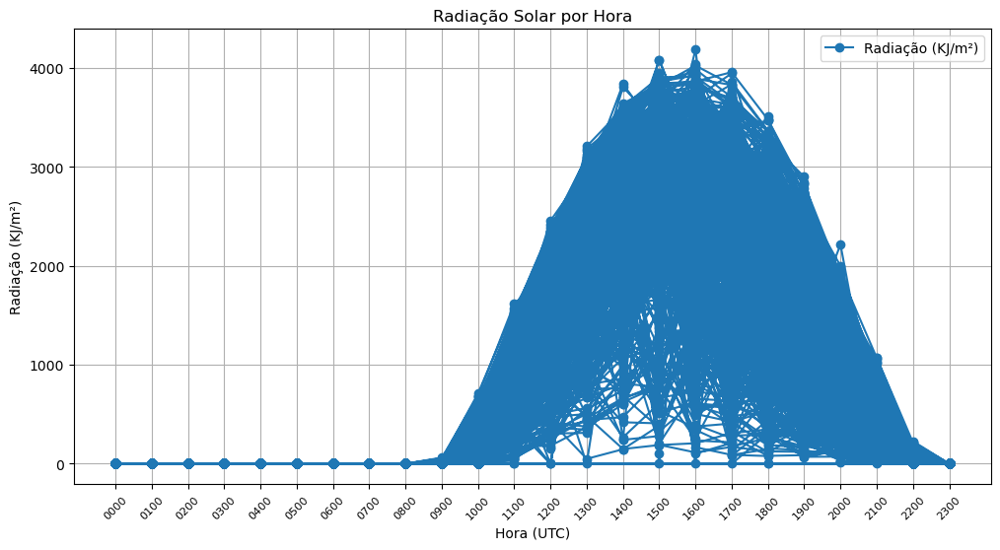

In [37]:
# Garantir que as colunas existam
if "Radiacao (KJ/m²)" in df.columns and "Hora (UTC)" in df.columns:
    # Substituir vírgula por ponto e converter para float
    df["Radiacao (KJ/m²)"] = df["Radiacao (KJ/m²)"].astype(str).str.replace(",", ".", regex=True).astype(float)

    # Garantir que a coluna "Hora (UTC)" seja string e padronizar formato HHMM
    df["Hora (UTC)"] = df["Hora (UTC)"].astype(str).str.zfill(4)

    # Criar gráfico de radiação por hora
    plt.figure(figsize=(12, 6))
    plt.plot(df["Hora (UTC)"], df["Radiacao (KJ/m²)"], marker='o', linestyle='-', label="Radiação (KJ/m²)")

    # Ajustes do gráfico
    plt.xlabel("Hora (UTC)")
    plt.ylabel("Radiação (KJ/m²)")
    plt.title("Radiação Solar por Hora")
    plt.xticks(rotation=45, fontsize=8)  # Melhorar visualização dos horários
    plt.grid(True)
    plt.legend()

    # Exibir o gráfico
    plt.show()
else:
    print("As colunas 'Hora (UTC)' e/ou 'Radiacao (KJ/m²)' não foram encontradas no DataFrame.")


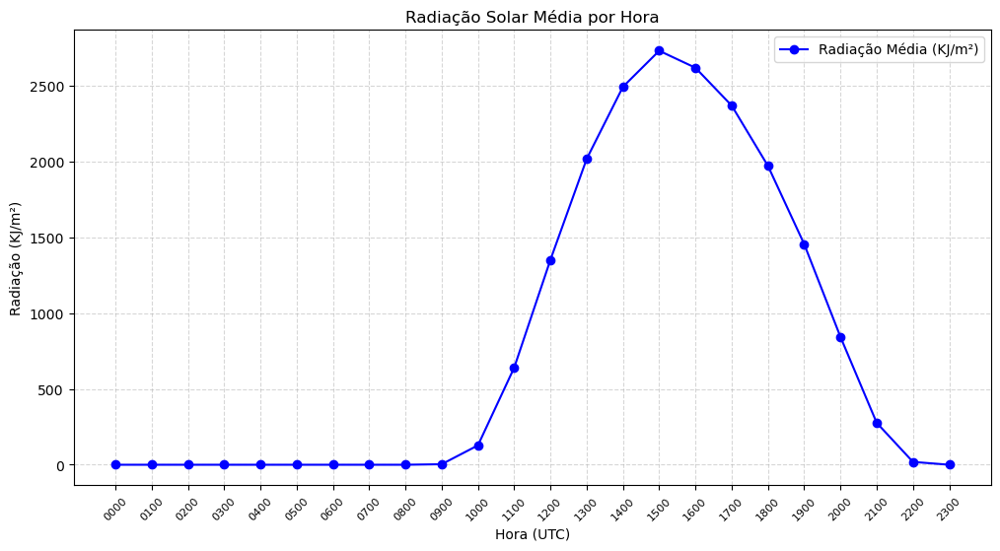

In [38]:
# Criar um gráfico mais limpo da Radiação por Hora
import matplotlib.pyplot as plt

# Garantir que as colunas existam e estejam no formato correto
if "Radiacao (KJ/m²)" in df.columns and "Hora (UTC)" in df.columns:
    # Criar um DataFrame médio por hora para suavizar o gráfico
    df["Hora (UTC)"] = df["Hora (UTC)"].astype(str).str.zfill(4)  # Padronizar formato HHMM
    df_grouped = df.groupby("Hora (UTC)")["Radiacao (KJ/m²)"].mean()  # Média por hora

    # Criar gráfico de radiação por hora (média)
    plt.figure(figsize=(12, 6))
    plt.plot(df_grouped.index, df_grouped.values, marker='o', linestyle='-', color='b', label="Radiação Média (KJ/m²)")

    # Ajustes do gráfico para melhor visualização
    plt.xlabel("Hora (UTC)")
    plt.ylabel("Radiação (KJ/m²)")
    plt.title("Radiação Solar Média por Hora")
    plt.xticks(rotation=45, fontsize=8)
    plt.grid(True, linestyle="--", alpha=0.5)  # Linhas de grade mais discretas
    plt.legend()

    # Exibir o gráfico mais limpo
    plt.show()
else:
    print("As colunas 'Hora (UTC)' e/ou 'Radiacao (KJ/m²)' não foram encontradas no DataFrame.")


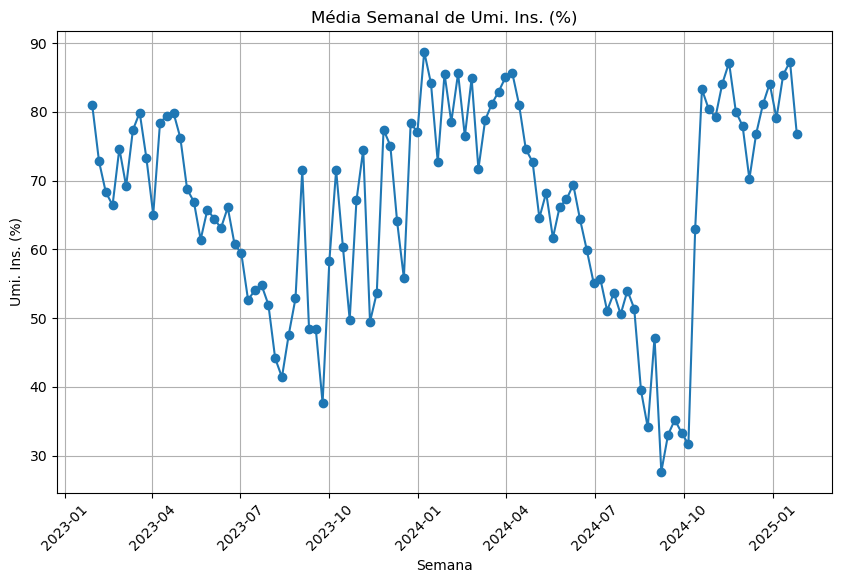

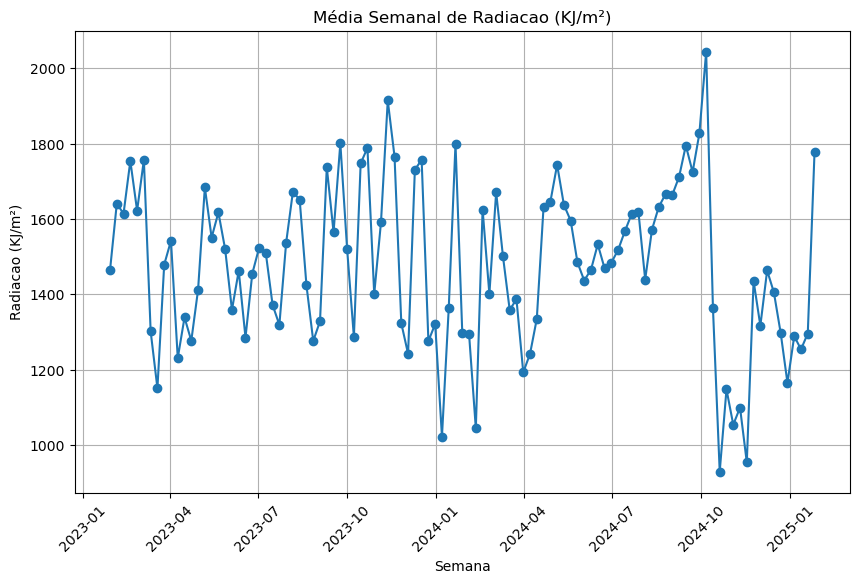

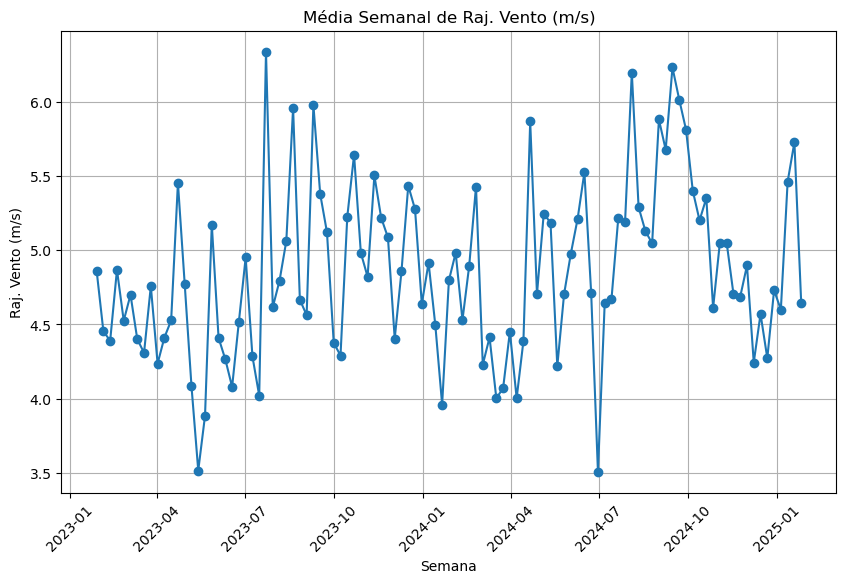

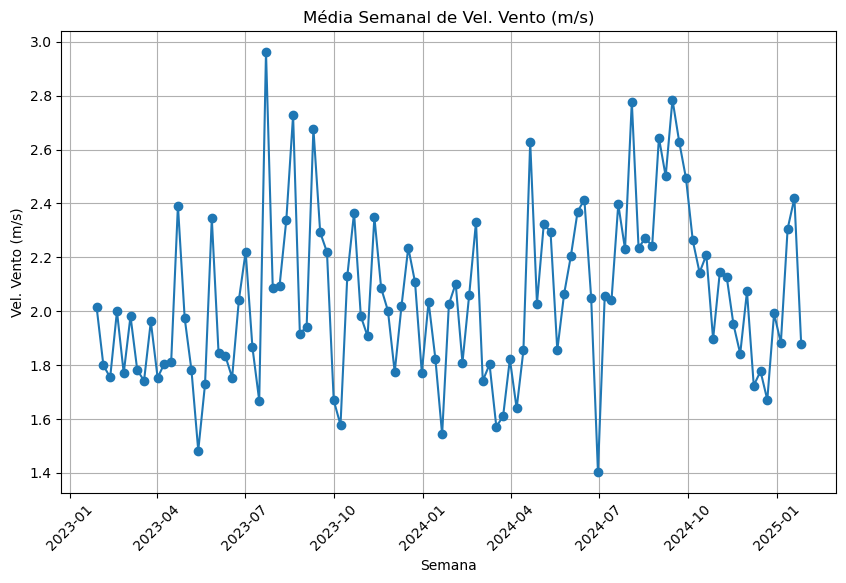

In [39]:
import pandas as pd
import matplotlib.pyplot as plt

# Abrindo os dois arquivos CSV
df1 = pd.read_csv('dados2023-2024.csv', sep=";", index_col=False)
df2 = pd.read_csv('dados2024-2025.csv', sep=";", index_col=False)

# Concatenando os DataFrames
df = pd.concat([df1, df2], ignore_index=True)

# Ajustando os nomes das colunas para remover espaços extras
df.columns = df.columns.str.strip()

# Criar e configurar a coluna 'data_hora'
if 'Data' in df.columns and 'Hora (UTC)' in df.columns:
    df['data_hora'] = pd.to_datetime(
        df['Data'] + ' ' + df['Hora (UTC)'].astype(str).str.zfill(4), 
        format='%d/%m/%Y %H%M', 
        errors='coerce'
    )
    
    # Remover valores nulos em 'data_hora'
    df = df[df['data_hora'].notnull()]

    # Configurar a coluna 'data_hora' como índice
    df.set_index('data_hora', inplace=True)
else:
    raise ValueError("As colunas 'Data' e 'Hora (UTC)' não foram encontradas no DataFrame.")

# Garantir que o índice está correto
if not isinstance(df.index, pd.DatetimeIndex):
    raise ValueError("Erro: O índice não está no formato DatetimeIndex.")

# Definir colunas relevantes para análise
colunas_relevantes = ["Umi. Ins. (%)", "Radiacao (KJ/m²)", "Raj. Vento (m/s)", "Vel. Vento (m/s)"]

# Garantir que as colunas existem no DataFrame
colunas_existentes = [col for col in colunas_relevantes if col in df.columns]
if not colunas_existentes:
    raise ValueError("Nenhuma das colunas relevantes foi encontrada no DataFrame!")

# Converter colunas para valores numéricos (substituindo ',' por '.')
for coluna in colunas_existentes:
    df[coluna] = df[coluna].astype(str).str.replace(',', '.').astype(float)

# Calcular a média semanal
df_semanal = df[colunas_existentes].resample('W').mean()

# Criar gráficos das médias semanais
for coluna in colunas_existentes:
    plt.figure(figsize=(10, 6))
    plt.plot(df_semanal.index, df_semanal[coluna], marker='o', linestyle='-')
    plt.title(f'Média Semanal de {coluna}')
    plt.xlabel('Semana')
    plt.ylabel(coluna)
    plt.xticks(rotation=45)
    plt.grid()
    plt.show()


In [40]:
#Dropar colunas que não pertencem aos 5 fatores mais relacionados da temperatura

In [41]:
# Substituir todos os valores NaN por 0
df.fillna(0, inplace=True)
# Manter apenas as 5 colunas mais correlacionadas com a temperatura instantânea
colunas_relevantes = ["Umi. Ins. (%)", "Radiacao (KJ/m²)", "Raj. Vento (m/s)", "Vel. Vento (m/s)", "Pressao Ins. (hPa)"]
df_filtrado = df[colunas_relevantes]

# Exibir os primeiros registros do dataframe
df_filtrado.head()

,Umi. Ins. (%),Radiacao (KJ/m²),Raj. Vento (m/s),Vel. Vento (m/s),Pressao Ins. (hPa)
data_hora,,,,,
2023-01-24 00:00:00,87.0,0.0,6.6,3.0,"885,7"
2023-01-24 01:00:00,87.0,0.0,7.1,2.5,"886,7"
2023-01-24 02:00:00,88.0,0.0,5.0,2.2,"887,0"
2023-01-24 03:00:00,91.0,0.0,4.8,1.7,"886,7"
2023-01-24 04:00:00,90.0,0.0,3.5,1.7,"886,3"


In [42]:
print(df.columns)


Index(['Data', 'Hora (UTC)', 'Temp. Ins. (C)', 'Temp. Max. (C)',
       'Temp. Min. (C)', 'Umi. Ins. (%)', 'Umi. Max. (%)', 'Umi. Min. (%)',
       'Pto Orvalho Ins. (C)', 'Pto Orvalho Max. (C)', 'Pto Orvalho Min. (C)',
       'Pressao Ins. (hPa)', 'Pressao Max. (hPa)', 'Pressao Min. (hPa)',
       'Vel. Vento (m/s)', 'Dir. Vento (m/s)', 'Raj. Vento (m/s)',
       'Radiacao (KJ/m²)', 'Chuva (mm)'],
      dtype='object')


Coluna 'data_hora' criada com sucesso!
Índice configurado como 'data_hora'.

Valores ausentes por coluna antes da análise de outliers:
Umi. Ins. (%)         32
Radiacao (KJ/m²)    8178
Raj. Vento (m/s)      38
Vel. Vento (m/s)      36
dtype: int64

Coluna: Umi. Ins. (%)
Total de outliers detectados: 0


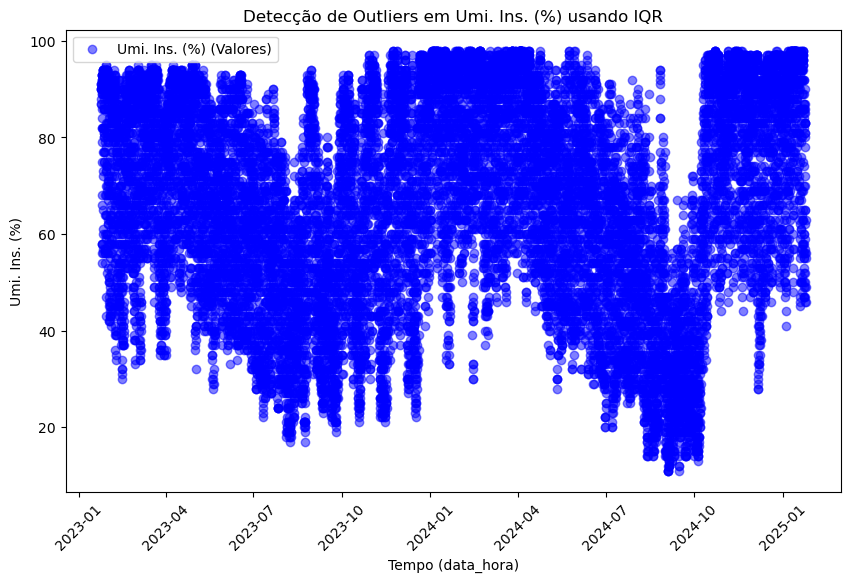


Coluna: Radiacao (KJ/m²)
Total de outliers detectados: 0


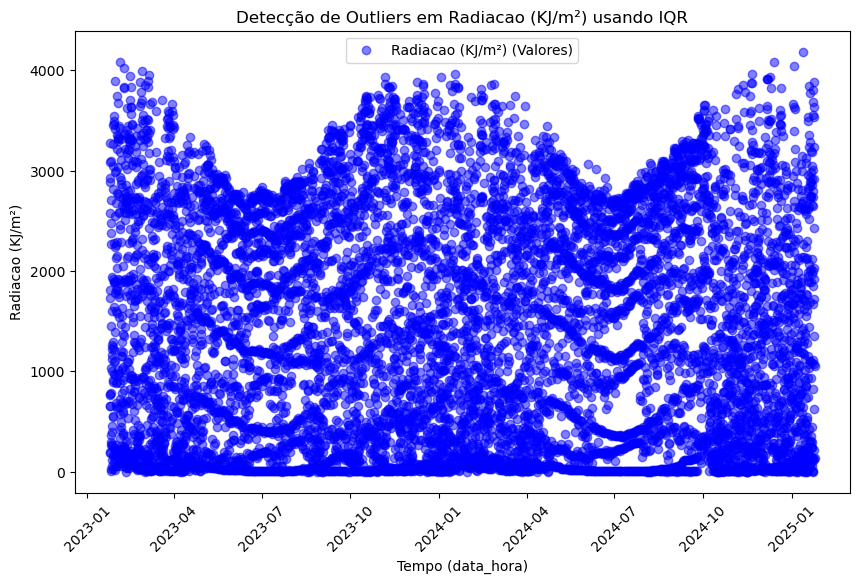


Coluna: Raj. Vento (m/s)
Total de outliers detectados: 89


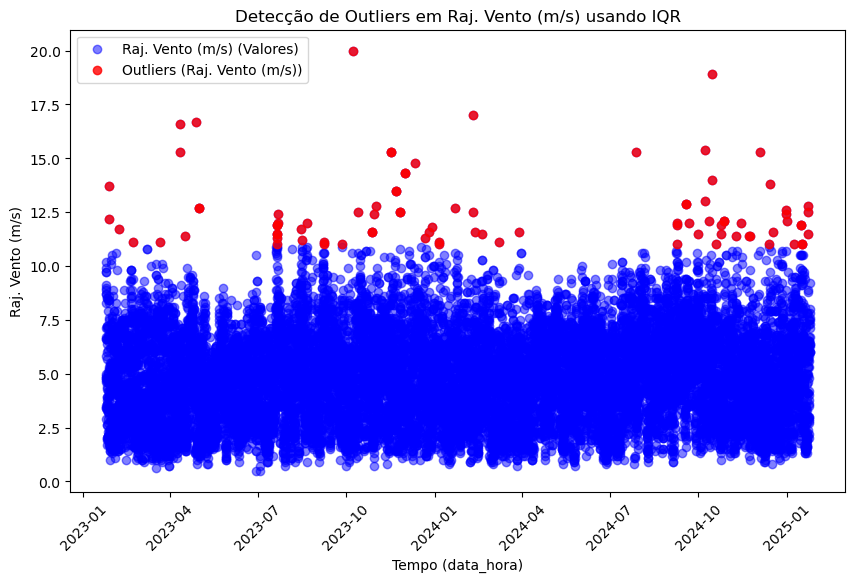


Coluna: Vel. Vento (m/s)
Total de outliers detectados: 107


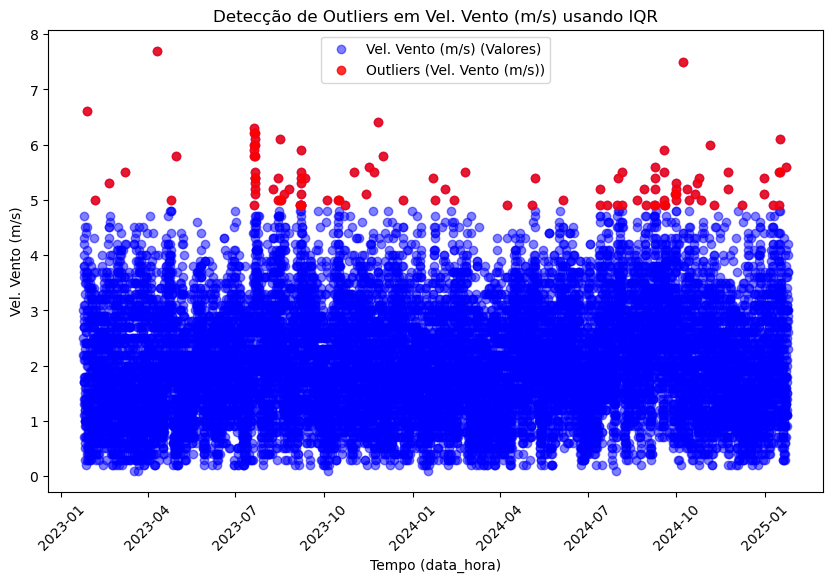


Total de linhas no dataset original: 17568
Total de linhas após remoção de outliers: 17404


In [43]:
import pandas as pd
import matplotlib.pyplot as plt

# Abrindo os dois arquivos CSV
df1 = pd.read_csv('dados2023-2024.csv', sep=";", index_col=False)
df2 = pd.read_csv('dados2024-2025.csv', sep=";", index_col=False)

# Concatenando os DataFrames
df = pd.concat([df1, df2], ignore_index=True)

# Ajustando os nomes das colunas para remover espaços extras
df.columns = df.columns.str.strip()

### Criar e configurar a coluna 'data_hora'
if 'Data' in df.columns and 'Hora (UTC)' in df.columns:
    df['data_hora'] = pd.to_datetime(
        df['Data'] + ' ' + df['Hora (UTC)'].astype(str).str.zfill(4), 
        format='%d/%m/%Y %H%M', 
        errors='coerce'
    )
    print("Coluna 'data_hora' criada com sucesso!")

    # Remover valores nulos em 'data_hora'
    nulos = df['data_hora'].isnull().sum()
    if nulos > 0:
        print(f"Existem {nulos} valores nulos em 'data_hora'. Removendo linhas inválidas...")
        df = df[df['data_hora'].notnull()]

    # Configurar a coluna 'data_hora' como índice
    df.set_index('data_hora', inplace=True)
    print("Índice configurado como 'data_hora'.")
else:
    raise ValueError("As colunas 'Data' e 'Hora (UTC)' não foram encontradas no DataFrame.")

# Verificar se o índice está correto
if not isinstance(df.index, pd.DatetimeIndex):
    raise ValueError("Erro: O índice não está no formato DatetimeIndex.")

# Definir colunas relevantes para análise de outliers
colunas_relevantes = ["Umi. Ins. (%)", "Radiacao (KJ/m²)" ,"Raj. Vento (m/s)", "Vel. Vento (m/s)"]

# Garantir que as colunas existem no DataFrame
colunas_existentes = [col for col in colunas_relevantes if col in df.columns]
if not colunas_existentes:
    raise ValueError("Nenhuma das colunas relevantes foi encontrada no DataFrame!")

# Converter colunas para valores numéricos (substituindo ',' por '.')
for coluna in colunas_existentes:
    df[coluna] = df[coluna].astype(str).str.replace(',', '.').astype(float)

# Verificar se há valores ausentes
print("\nValores ausentes por coluna antes da análise de outliers:")
print(df[colunas_existentes].isnull().sum())

# Dicionário para armazenar os outliers por coluna
outliers_dict = {}

# Detectar e visualizar outliers para cada fator
for coluna in colunas_existentes:
    if df[coluna].isnull().all():  # Pular colunas vazias
        print(f"\nA coluna {coluna} está vazia ou contém apenas valores nulos.")
        continue
    
    # Calcular quartis e intervalo interquartil (IQR)
    Q1 = df[coluna].quantile(0.25)
    Q3 = df[coluna].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filtrar outliers
    outliers = df[(df[coluna] < lower_bound) | (df[coluna] > upper_bound)]
    outliers_dict[coluna] = outliers

    # Exibir a quantidade de outliers
    print(f"\nColuna: {coluna}")
    print(f"Total de outliers detectados: {len(outliers)}")

    # Criar gráfico de dispersão para visualizar os outliers
    plt.figure(figsize=(10, 6))
    plt.scatter(df.index, df[coluna], label=f'{coluna} (Valores)', color='blue', alpha=0.5)
    
    if not outliers.empty:
        plt.scatter(outliers.index, outliers[coluna], label=f'Outliers ({coluna})', color='red', alpha=0.8)
    
    plt.title(f"Detecção de Outliers em {coluna} usando IQR")
    plt.xlabel("Tempo (data_hora)")
    plt.ylabel(coluna)
    plt.xticks(rotation=45)
    plt.legend()
    plt.show()

# Removendo outliers do DataFrame
df_sem_outliers = df.copy()
for coluna in colunas_existentes:
    df_sem_outliers = df_sem_outliers[~df_sem_outliers.index.isin(outliers_dict[coluna].index)]

# Exibir o número de linhas após remoção dos outliers
print(f"\nTotal de linhas no dataset original: {len(df)}")
print(f"Total de linhas após remoção de outliers: {len(df_sem_outliers)}")


#Total de linhas no dataset original: 17568
#Total de linhas após remoção de outliers: 17404
17568 - 17404  = 164
-------------  ------- = 0,093 x 100 = 0,93 de dados descartados = 1% dos dados descartados
   17568        17568

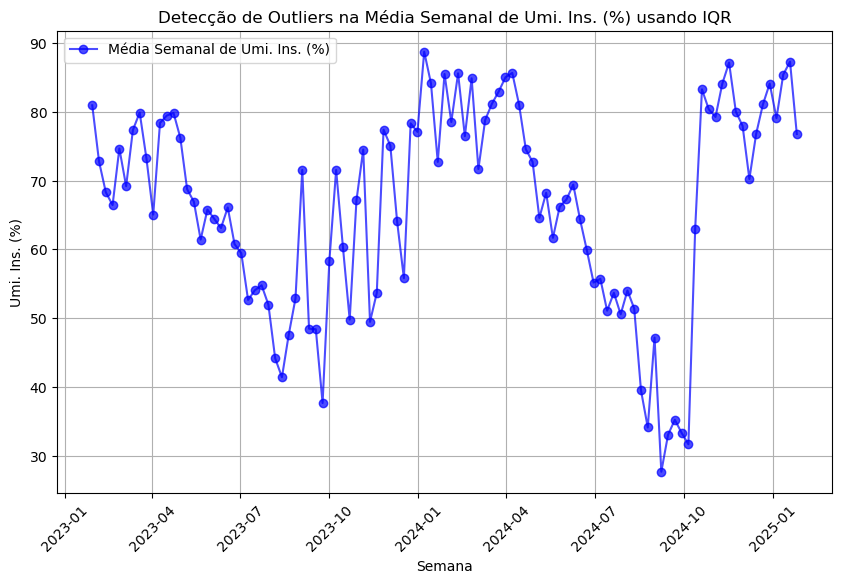

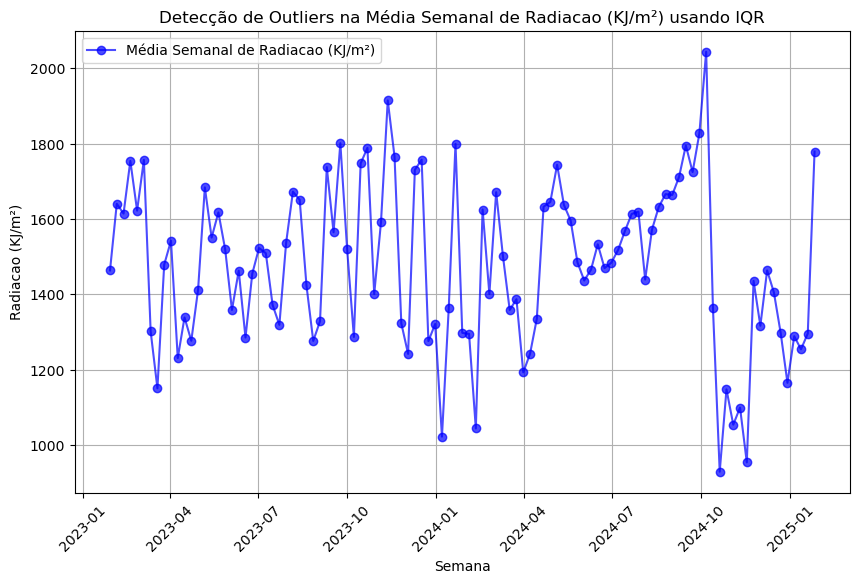

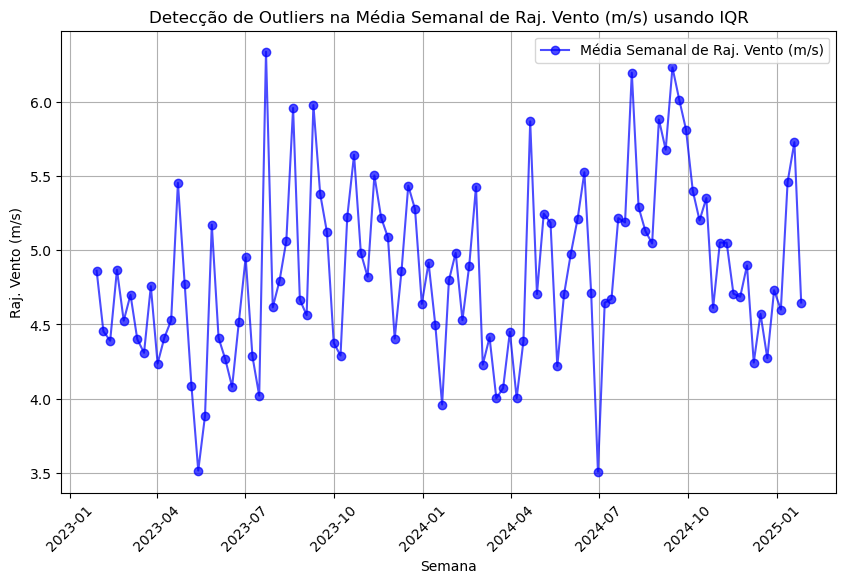

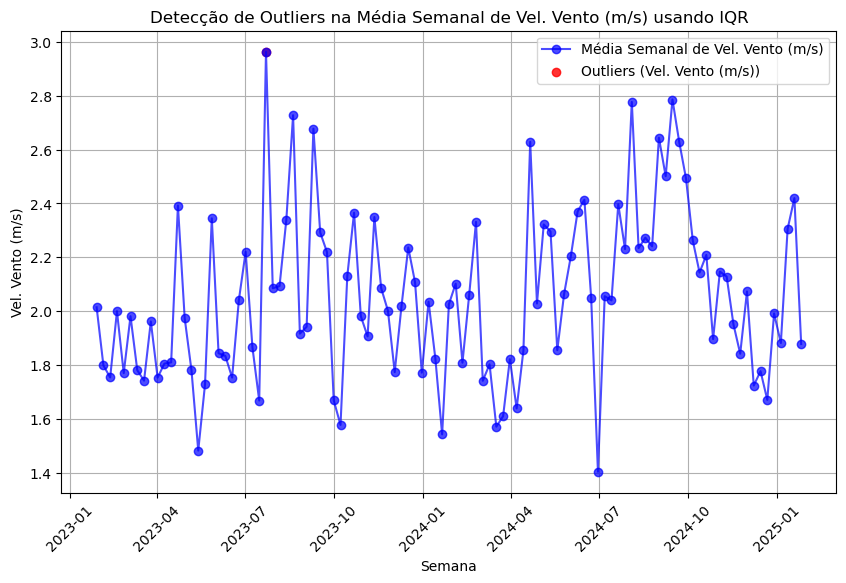

In [44]:
# Calcular a média semanal
df_semanal = df[colunas_existentes].resample('W').mean()

# Dicionário para armazenar os outliers semanais por coluna
outliers_dict_semanal = {}

# Detectar outliers semanais para cada fator
for coluna in colunas_existentes:
    if df_semanal[coluna].isnull().all():  # Pular colunas vazias
        print(f"\nA coluna {coluna} está vazia ou contém apenas valores nulos.")
        continue

    # Calcular quartis e intervalo interquartil (IQR)
    Q1 = df_semanal[coluna].quantile(0.25)
    Q3 = df_semanal[coluna].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filtrar outliers
    outliers_semanal = df_semanal[(df_semanal[coluna] < lower_bound) | (df_semanal[coluna] > upper_bound)]
    outliers_dict_semanal[coluna] = outliers_semanal

    # Criar gráfico de dispersão para visualizar os outliers na média semanal
    plt.figure(figsize=(10, 6))
    plt.plot(df_semanal.index, df_semanal[coluna], marker='o', linestyle='-', label=f'Média Semanal de {coluna}', color='blue', alpha=0.7)

    if not outliers_semanal.empty:
        plt.scatter(outliers_semanal.index, outliers_semanal[coluna], color='red', label=f'Outliers ({coluna})', alpha=0.8)

    plt.title(f"Detecção de Outliers na Média Semanal de {coluna} usando IQR")
    plt.xlabel("Semana")
    plt.ylabel(coluna)
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid()
    plt.show()


In [45]:
#Uso da interpolação

# Carregar os arquivos
df1 = pd.read_csv('dados2023-2024.csv', sep=";", index_col=False)
df2 = pd.read_csv('dados2024-2025.csv', sep=";", index_col=False)

# Concatenar os DataFrames
df = pd.concat([df1, df2], ignore_index=True)

# Ajustar nomes das colunas
df.columns = df.columns.str.strip()

# Preencher valores ausentes por interpolação linear
df.interpolate(method='linear', inplace=True)

# Exibir a quantidade de valores faltantes após o tratamento
print("Valores ausentes após interpolação:")
print(df.isnull().sum())


Valores ausentes após interpolação:
Data                       0
Hora (UTC)                 0
Temp. Ins. (C)            32
Temp. Max. (C)            40
Temp. Min. (C)            40
Umi. Ins. (%)             32
Umi. Max. (%)             40
Umi. Min. (%)             41
Pto Orvalho Ins. (C)      32
Pto Orvalho Max. (C)      40
Pto Orvalho Min. (C)      40
Pressao Ins. (hPa)        30
Pressao Max. (hPa)        38
Pressao Min. (hPa)        38
Vel. Vento (m/s)          36
Dir. Vento (m/s)          39
Raj. Vento (m/s)          38
Radiacao (KJ/m²)        8178
Chuva (mm)                32
dtype: int64


C:\Users\barbara.madera\AppData\Local\Temp\ipykernel_21256\3921923735.py:14: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df.interpolate(method='linear', inplace=True)


In [46]:
import pandas as pd
import numpy as np
from scipy.stats import hmean

# Carregar os arquivos CSV
df1 = pd.read_csv('dados2023-2024.csv', sep=";", index_col=False)
df2 = pd.read_csv('dados2024-2025.csv', sep=";", index_col=False)

# Concatenar os DataFrames
df = pd.concat([df1, df2], ignore_index=True)

# Ajustar nomes das colunas
df.columns = df.columns.str.strip()

# Criar a coluna 'data_hora' a partir de 'Data' e 'Hora (UTC)'
if 'Data' in df.columns and 'Hora (UTC)' in df.columns:
    df['data_hora'] = pd.to_datetime(
        df['Data'] + ' ' + df['Hora (UTC)'].astype(str).str.zfill(4),
        format='%d/%m/%Y %H%M',
        errors='coerce'
    )
    print("Coluna 'data_hora' criada com sucesso!")
else:
    print("As colunas 'Data' e/ou 'Hora (UTC)' não foram encontradas.")

# Função para configurar 'data_hora' como índice
def configurar_data_hora(df):
    """
    Verifica e configura a coluna 'data_hora' como índice do DataFrame.
    Remove valores nulos ou inválidos em 'data_hora'.
    """
    if 'data_hora' in df.columns:
        print("Ajustando a coluna 'data_hora'...")

        # Remover valores nulos de 'data_hora'
        nulos = df['data_hora'].isnull().sum()
        if nulos > 0:
            print(f"Existem {nulos} valores nulos em 'data_hora'. Removendo linhas inválidas...")
            df = df[df['data_hora'].notnull()]

        # Configurar a coluna 'data_hora' como índice
        df.set_index('data_hora', inplace=True)
        print("Índice configurado como 'data_hora'.")

        # Verificar o índice
        if isinstance(df.index, pd.DatetimeIndex):
            print("O índice foi configurado corretamente como DatetimeIndex.")
        else:
            print("Erro: O índice não está no formato DatetimeIndex.")
    else:
        print("A coluna 'data_hora' não foi encontrada no DataFrame.")

    return df

# Configurar 'data_hora' como índice
df = configurar_data_hora(df)

# Verificar se há colunas numéricas e aplicar a média harmônica
colunas_numericas = df.select_dtypes(include=[np.number]).columns

# Criando uma cópia do DataFrame para evitar warnings de atribuição
df_hmean = df.copy()

# Aplicar a média harmônica garantindo valores numéricos e positivos
for coluna in colunas_numericas:
    df_hmean[coluna] = pd.to_numeric(df_hmean[coluna], errors='coerce')  # Converter para numérico
    valores_validos = df_hmean[coluna].dropna().values  # Remover NaN antes do cálculo
    valores_validos = valores_validos[valores_validos > 0]  # Garantir que não há valores negativos ou zero

    if len(valores_validos) > 0:
        media_harmonica = hmean(valores_validos)  # Calcular média harmônica
        df_hmean[coluna] = df_hmean[coluna].fillna(media_harmonica)  # Preencher valores ausentes com média harmônica
    else:
        df_hmean[coluna] = 0  # Se não houver valores válidos, preenche toda a coluna com zero

# Garantir que todos os NaN no DataFrame sejam substituídos por zero
df_hmean.fillna(0, inplace=True)

# Exibir o DataFrame tratado
print("Dataset com Média Harmônica (ou Zero se não houver valores válidos):")
print(df_hmean)

# Opcional: Salvar o DataFrame tratado em um arquivo CSV
df_hmean.to_csv("dataset_tratado.csv", index=False)


Coluna 'data_hora' criada com sucesso!
Ajustando a coluna 'data_hora'...
Índice configurado como 'data_hora'.
O índice foi configurado corretamente como DatetimeIndex.
Dataset com Média Harmônica (ou Zero se não houver valores válidos):
                           Data  Hora (UTC) Temp. Ins. (C) Temp. Max. (C)  \
data_hora                                                                   
2023-01-24 00:00:00  24/01/2023           0           19,6           20,2   
2023-01-24 01:00:00  24/01/2023         100           19,3           19,6   
2023-01-24 02:00:00  24/01/2023         200           19,2           19,3   
2023-01-24 03:00:00  24/01/2023         300           18,8           19,2   
2023-01-24 04:00:00  24/01/2023         400           18,6           18,8   
...                         ...         ...            ...            ...   
2025-01-24 19:00:00  24/01/2025        1900           28,5           28,9   
2025-01-24 20:00:00  24/01/2025        2000           28,3           2

Outliers considerados:
https://arxiv.org/abs/2302.09311
A Robust Time Series Model with Outliers and Missing Entries
Dados faltantes interpolados
Uso optado para tratamento de dados: interpolação para dados faltantes e uso de ) quando o dado é NaN
https://arxiv.org/abs/2302.09311
https://repositorio.ufpe.br/bitstream/123456789/59159/1/TESE%20Filipe%20Coelho%20de%20Lima%20Duarte.pdf?utm_source=chatgpt.com


dados2023-2024.csv carregado com sucesso usando a codificação: utf-8
dados2024-2025.csv carregado com sucesso usando a codificação: utf-8
Coluna 'data_hora' criada com sucesso!


C:\Users\barbara.madera\AppData\Local\Temp\ipykernel_21256\3706322317.py:50: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df_interpolado = df.interpolate(method='time') #Uso de interpolação tempotal aqui


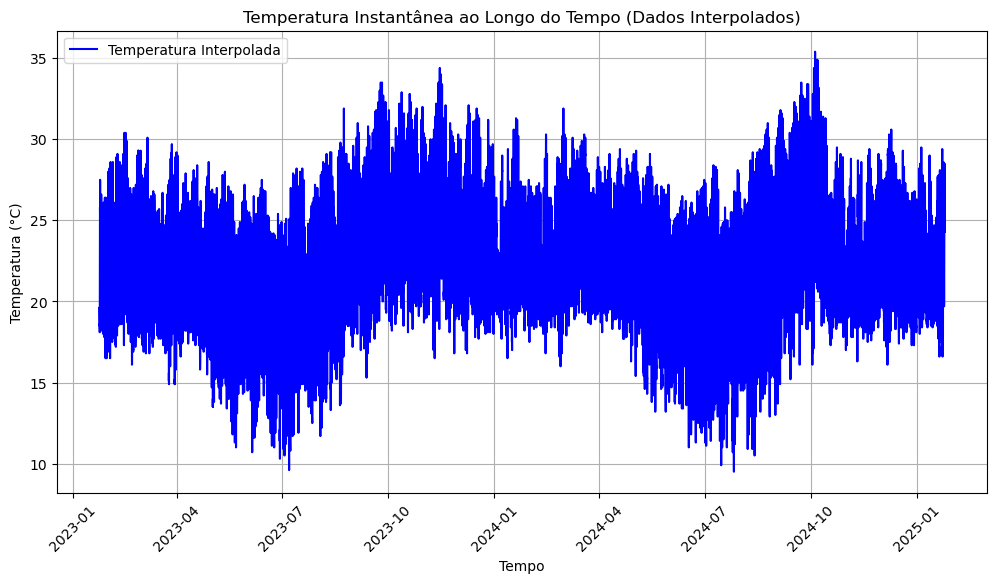

In [47]:
import pandas as pd
import matplotlib.pyplot as plt

# Lista de arquivos a serem carregados
arquivos = ['dados2023-2024.csv', 'dados2024-2025.csv']
codificacoes = ['utf-8', 'latin1', 'iso-8859-1', 'cp1252']

# Lista para armazenar os DataFrames carregados
dfs = []

# Carregar e processar os arquivos CSV
for arquivo in arquivos:
    for encoding in codificacoes:
        try:
            df = pd.read_csv(arquivo, sep=';', encoding=encoding)
            print(f"{arquivo} carregado com sucesso usando a codificação: {encoding}")
            dfs.append(df)
            break  # Sai do loop se a leitura for bem-sucedida
        except UnicodeDecodeError:
            print(f"Falha ao usar a codificação: {encoding} para {arquivo}")

# Concatenar os DataFrames
df = pd.concat(dfs, ignore_index=True)

# Ajustar os nomes das colunas removendo espaços extras
df.columns = df.columns.str.strip()

# Criar a coluna 'data_hora' a partir de 'Data' e 'Hora (UTC)'
if 'Data' in df.columns and 'Hora (UTC)' in df.columns:
    df['data_hora'] = pd.to_datetime(
        df['Data'] + ' ' + df['Hora (UTC)'].astype(str).str.zfill(4),
        format='%d/%m/%Y %H%M',
        errors='coerce'
    )
    print("Coluna 'data_hora' criada com sucesso!")
else:
    raise ValueError("As colunas 'Data' e 'Hora (UTC)' não foram encontradas.")

# Definir 'data_hora' como índice
df.set_index('data_hora', inplace=True)

# Converter colunas numéricas (substituindo ',' por '.' se necessário)
for coluna in df.select_dtypes(include='object').columns:
    try:
        df[coluna] = df[coluna].str.replace(',', '.').astype(float)
    except ValueError:
        pass  # Ignorar colunas que não puderem ser convertidas

# Interpolar dados ausentes para manter continuidade temporal
df_interpolado = df.interpolate(method='time') #Uso de interpolação tempotal aqui

# Selecionar a variável de interesse (Temperatura Instantânea)
coluna_temperatura = "Temp. Ins. (C)"

# Criar gráfico de temperatura ao longo do tempo
plt.figure(figsize=(12, 6))
plt.plot(df_interpolado.index, df_interpolado[coluna_temperatura], label="Temperatura Interpolada", color="blue")

# Configurações do gráfico
plt.xlabel("Tempo")
plt.ylabel("Temperatura (°C)")
plt.title("Temperatura Instantânea ao Longo do Tempo (Dados Interpolados)")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

# Exibir gráfico
plt.show()


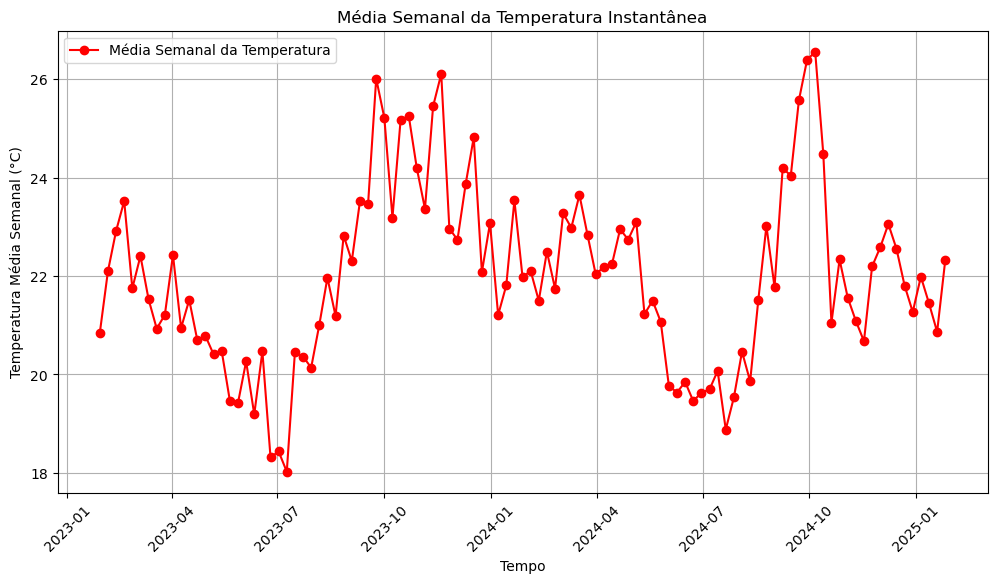

In [48]:
import pandas as pd
import matplotlib.pyplot as plt


# Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# Agregação dos dados para obter a média semanal da temperatura instantânea
df_semanal = df_numerico.resample('W').mean()

# Selecionar a variável de interesse (Temperatura Instantânea)
coluna_temperatura = "Temp. Ins. (C)"

# Criar gráfico da média semanal da temperatura ao longo do tempo
plt.figure(figsize=(12, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], marker='o', linestyle='-', color='red', label="Média Semanal da Temperatura")

# Configurações do gráfico
plt.xlabel("Tempo")
plt.ylabel("Temperatura Média Semanal (°C)")
plt.title("Média Semanal da Temperatura Instantânea")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

# Exibir gráfico
plt.show()


Gráfico de Sazonalidade da Temperatura

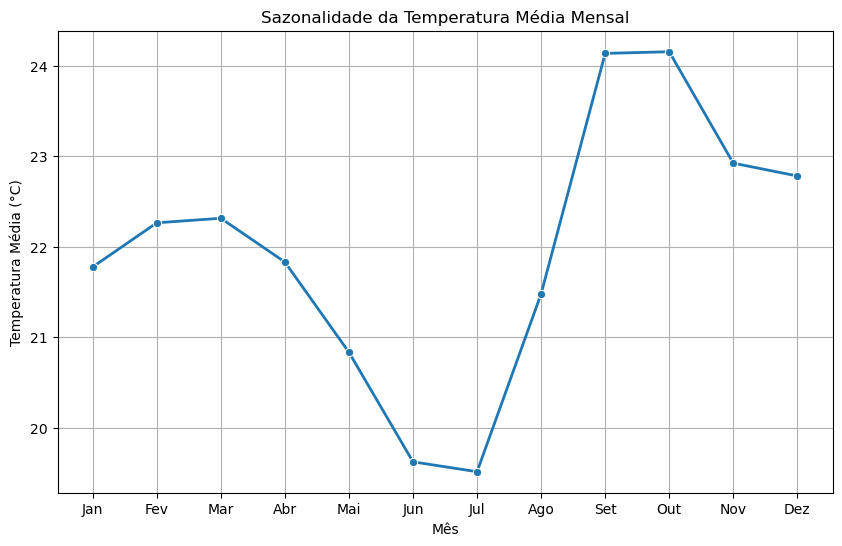

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

# Criar uma cópia do DataFrame e adicionar uma coluna de mês
df_sazonalidade = df_semanal.copy()
df_sazonalidade['Mês'] = df_sazonalidade.index.month

# Calcular a média da temperatura por mês para identificar a sazonalidade
df_mensal = df_sazonalidade.groupby('Mês')[coluna_temperatura].mean()

# Plotar a sazonalidade
plt.figure(figsize=(10, 6))
sns.lineplot(x=df_mensal.index, y=df_mensal.values, marker='o', linewidth=2)

plt.title("Sazonalidade da Temperatura Média Mensal")
plt.xlabel("Mês")
plt.ylabel("Temperatura Média (°C)")
plt.xticks(range(1, 13), ["Jan", "Fev", "Mar", "Abr", "Mai", "Jun", "Jul", "Ago", "Set", "Out", "Nov", "Dez"])
plt.grid()

plt.show()

Colunas disponíveis no DataFrame: Index(['Hora (UTC)', 'Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)',
       'Umi. Ins. (%)', 'Umi. Max. (%)', 'Umi. Min. (%)',
       'Pto Orvalho Ins. (C)', 'Pto Orvalho Max. (C)', 'Pto Orvalho Min. (C)',
       'Pressao Ins. (hPa)', 'Pressao Max. (hPa)', 'Pressao Min. (hPa)',
       'Vel. Vento (m/s)', 'Dir. Vento (m/s)', 'Raj. Vento (m/s)',
       'Radiacao (KJ/m²)', 'Chuva (mm)'],
      dtype='object')
Usando a coluna de temperatura: Temp. Ins. (C)
Erro Absoluto Médio (MAE): 1.44
Erro Quadrático Médio (MSE): 3.09
Raiz do Erro Quadrático Médio (RMSE): 1.76
Erro Percentual Médio Absoluto (MAPE): 6.24%
Erro Percentual Médio Absoluto Simétrico (sMAPE): 6.30%
Coeficiente de Determinação (R² Score): -0.02


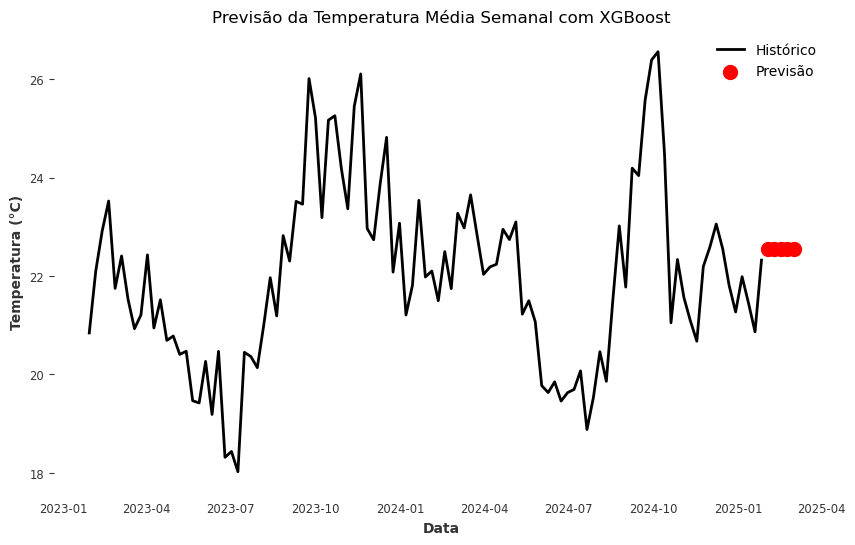

In [50]:
#X semanas à frente
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from darts import TimeSeries
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# Agregação dos dados para obter a média semanal da temperatura instantânea
df_semanal = df_numerico.resample('W').mean()

# Verificar os nomes das colunas para garantir que "Temp. Ins. (C)" está presente
colunas_disponiveis = df_semanal.columns
print("Colunas disponíveis no DataFrame:", colunas_disponiveis)

# Ajustar o nome da coluna de temperatura se necessário
coluna_temperatura = [col for col in colunas_disponiveis if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
else:
    coluna_temperatura = coluna_temperatura[0]  # Pegar a primeira correspondência
    print("Usando a coluna de temperatura:", coluna_temperatura)

# Criar variáveis de entrada e saída
X = []
y = []

for i in range(4, len(df_semanal)):
    X.append(df_semanal[coluna_temperatura].iloc[i-4:i].values)
    y.append(df_semanal[coluna_temperatura].iloc[i])

X = np.array(X)
y = np.array(y)

# Dividir os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Criar e treinar o modelo XGBoost
model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, objective='reg:squarederror')
model.fit(X_train, y_train)

# Fazer previsões
train_pred = model.predict(X_test)

# Comparar previsões com os valores reais
y_true = y_test  # Valores reais do conjunto de treino
y_pred = train_pred  # Previsões feitas pelo modelo


# Fazer previsão para a próxima semana
ultimo_valor = df_semanal[coluna_temperatura].iloc[-4:].values.reshape(1, -1)
previsao_futura = model.predict(ultimo_valor)

# Criar índice de datas futuras
future_dates = [df_semanal.index[-1] + pd.Timedelta(weeks=i+1) for i in range(5)]

# Criar DataFrame com previsões futuras
df_future = pd.DataFrame({coluna_temperatura: previsao_futura}, index=future_dates)

# Calcular métricas de erro
mae = mean_absolute_error(y_true, y_pred)
mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_true, y_pred)

print(f"Erro Absoluto Médio (MAE): {mae:.2f}")
print(f"Erro Quadrático Médio (MSE): {mse:.2f}")
print(f"Raiz do Erro Quadrático Médio (RMSE): {rmse:.2f}")
print(f"Erro Percentual Médio Absoluto (MAPE): {mape:.2%}")
print(f"Erro Percentual Médio Absoluto Simétrico (sMAPE): {smape_value:.2f}%")
print(f"Coeficiente de Determinação (R² Score): {r2:.2f}")

# Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2)
plt.scatter(df_future.index, df_future[coluna_temperatura], color='red', label="Previsão", marker='o', s=100)
plt.title("Previsão da Temperatura Média Semanal com XGBoost")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

Colunas disponíveis no DataFrame: Index(['Hora (UTC)', 'Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)',
       'Umi. Ins. (%)', 'Umi. Max. (%)', 'Umi. Min. (%)',
       'Pto Orvalho Ins. (C)', 'Pto Orvalho Max. (C)', 'Pto Orvalho Min. (C)',
       'Pressao Ins. (hPa)', 'Pressao Max. (hPa)', 'Pressao Min. (hPa)',
       'Vel. Vento (m/s)', 'Dir. Vento (m/s)', 'Raj. Vento (m/s)',
       'Radiacao (KJ/m²)', 'Chuva (mm)'],
      dtype='object')
Usando a coluna de temperatura: Temp. Ins. (C)
Erro Absoluto Médio (MAE): 1.44
Erro Quadrático Médio (MSE): 3.09
Raiz do Erro Quadrático Médio (RMSE): 1.76
Erro Percentual Médio Absoluto (MAPE): 6.24%
Erro Percentual Médio Absoluto Simétrico (sMAPE): 6.30%
Coeficiente de Determinação (R² Score): -0.02


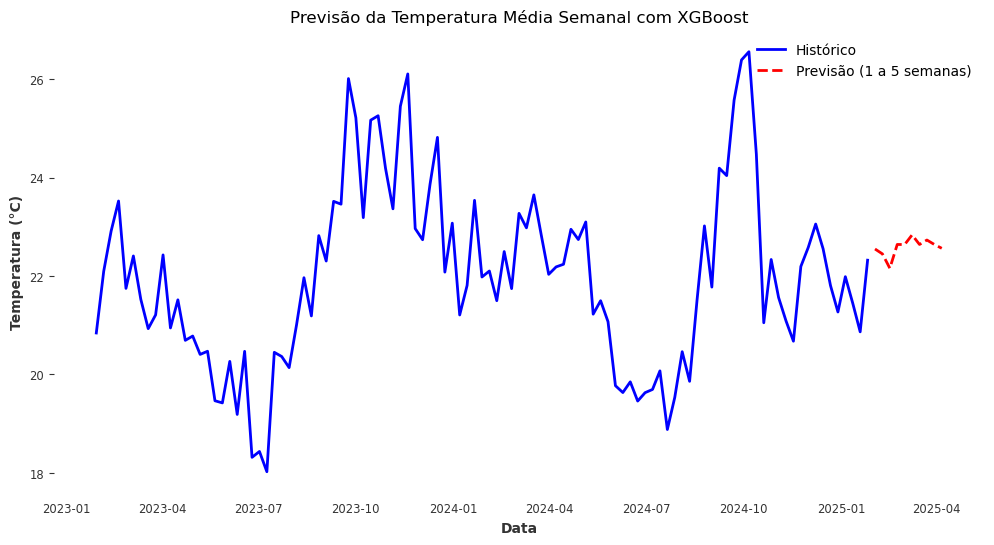

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# Agregação dos dados para obter a média semanal da temperatura instantânea
df_semanal = df_numerico.resample('W').mean()

# Verificar os nomes das colunas para garantir que "Temp. Ins. (C)" está presente
colunas_disponiveis = df_semanal.columns
print("Colunas disponíveis no DataFrame:", colunas_disponiveis)

# Ajustar o nome da coluna de temperatura se necessário
coluna_temperatura = [col for col in colunas_disponiveis if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
else:
    coluna_temperatura = coluna_temperatura[0]  # Pegar a primeira correspondência
    print("Usando a coluna de temperatura:", coluna_temperatura)

# Criar variáveis de entrada e saída
X = []
y = []

for i in range(4, len(df_semanal)):
    X.append(df_semanal[coluna_temperatura].iloc[i-4:i].values)
    y.append(df_semanal[coluna_temperatura].iloc[i])

X = np.array(X)
y = np.array(y)

# Dividir os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Criar e treinar o modelo XGBoost
model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, objective='reg:squarederror')
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
train_pred = model.predict(X_test)

# Comparar previsões com os valores reais
y_true = y_test
y_pred = train_pred

# 🔹 Fazer previsão contínua para as próximas 5 semanas
n_weeks_ahead = 10
last_values = df_semanal[coluna_temperatura].iloc[-4:].values.tolist()  # Últimos 5(n) valores como entrada inicial
future_predictions = []

for i in range(n_weeks_ahead):
    next_prediction = model.predict(np.array(last_values).reshape(1, -1))[0]  # Fazer previsão
    future_predictions.append(next_prediction)
    last_values.pop(0)  # Remover valor mais antigo
    last_values.append(next_prediction)  # Adicionar previsão como novo dado de entrada

# Criar DataFrame com previsões futuras
future_dates = [df_semanal.index[-1] + pd.Timedelta(weeks=i+1) for i in range(n_weeks_ahead)]
df_future = pd.DataFrame({coluna_temperatura: future_predictions}, index=future_dates)

# 🔹 Calcular métricas de erro
mae = mean_absolute_error(y_true, y_pred)
mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_true, y_pred)

print(f"Erro Absoluto Médio (MAE): {mae:.2f}")
print(f"Erro Quadrático Médio (MSE): {mse:.2f}")
print(f"Raiz do Erro Quadrático Médio (RMSE): {rmse:.2f}")
print(f"Erro Percentual Médio Absoluto (MAPE): {mape:.2%}")
print(f"Erro Percentual Médio Absoluto Simétrico (sMAPE): {smape_value:.2f}%")
print(f"Coeficiente de Determinação (R² Score): {r2:.2f}")
# 🔹 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(12, 6))

# Plotando os dados históricos
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='blue')

# Plotando as previsões com linha tracejada vermelha
plt.plot(df_future.index, df_future[coluna_temperatura], linestyle="dashed", color='red', linewidth=2, label="Previsão (1 a 5 semanas)")

plt.title("Previsão da Temperatura Média Semanal com XGBoost")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

Colunas disponíveis no DataFrame: Index(['Hora (UTC)', 'Temp. Ins. (C)', 'Temp. Max. (C)', 'Temp. Min. (C)',
       'Umi. Ins. (%)', 'Umi. Max. (%)', 'Umi. Min. (%)',
       'Pto Orvalho Ins. (C)', 'Pto Orvalho Max. (C)', 'Pto Orvalho Min. (C)',
       'Pressao Ins. (hPa)', 'Pressao Max. (hPa)', 'Pressao Min. (hPa)',
       'Vel. Vento (m/s)', 'Dir. Vento (m/s)', 'Raj. Vento (m/s)',
       'Radiacao (KJ/m²)', 'Chuva (mm)'],
      dtype='object')
Usando a coluna de temperatura: Temp. Ins. (C)
Erro Absoluto Médio (MAE): 1.26
Erro Quadrático Médio (MSE): 2.47
Raiz do Erro Quadrático Médio (RMSE): 1.57
Erro Percentual Médio Absoluto (MAPE): 5.49%
Erro Percentual Médio Absoluto Simétrico (sMAPE): 5.48%
Coeficiente de Determinação (R² Score): 0.19


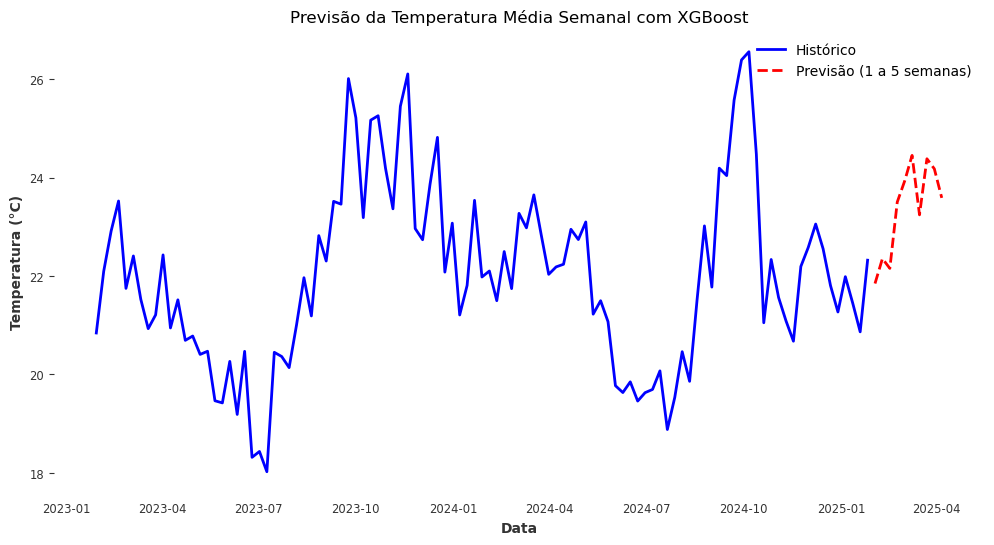

In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# Agregação dos dados para obter a média semanal da temperatura instantânea
df_semanal = df_numerico.resample('W').mean()

# Verificar os nomes das colunas para garantir que "Temp. Ins. (C)" está presente
colunas_disponiveis = df_semanal.columns
print("Colunas disponíveis no DataFrame:", colunas_disponiveis)

# Ajustar o nome da coluna de temperatura se necessário
coluna_temperatura = [col for col in colunas_disponiveis if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
else:
    coluna_temperatura = coluna_temperatura[0]  # Pegar a primeira correspondência
    print("Usando a coluna de temperatura:", coluna_temperatura)

# Criar variáveis de entrada e saída
X = []
y = []

for i in range(5, len(df_semanal)):
    X.append(df_semanal[coluna_temperatura].iloc[i-5:i].values)
    y.append(df_semanal[coluna_temperatura].iloc[i])

X = np.array(X)
y = np.array(y)

# Dividir os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Criar e treinar o modelo XGBoost
model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, objective='reg:squarederror')
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
train_pred = model.predict(X_test)

# Comparar previsões com os valores reais
y_true = y_test
y_pred = train_pred

# 🔹 Fazer previsão contínua para as próximas 5 semanas
n_weeks_ahead = 10
last_values = df_semanal[coluna_temperatura].iloc[-5:].values.tolist()  # Últimos 5(n) valores como entrada inicial
future_predictions = []

for i in range(n_weeks_ahead):
    next_prediction = model.predict(np.array(last_values).reshape(1, -1))[0]  # Fazer previsão
    future_predictions.append(next_prediction)
    last_values.pop(0)  # Remover valor mais antigo
    last_values.append(next_prediction)  # Adicionar previsão como novo dado de entrada

# Criar DataFrame com previsões futuras
future_dates = [df_semanal.index[-1] + pd.Timedelta(weeks=i+1) for i in range(n_weeks_ahead)]
df_future = pd.DataFrame({coluna_temperatura: future_predictions}, index=future_dates)

# 🔹 Calcular métricas de erro
mae = mean_absolute_error(y_true, y_pred)
mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_true, y_pred)

print(f"Erro Absoluto Médio (MAE): {mae:.2f}")
print(f"Erro Quadrático Médio (MSE): {mse:.2f}")
print(f"Raiz do Erro Quadrático Médio (RMSE): {rmse:.2f}")
print(f"Erro Percentual Médio Absoluto (MAPE): {mape:.2%}")
print(f"Erro Percentual Médio Absoluto Simétrico (sMAPE): {smape_value:.2f}%")
print(f"Coeficiente de Determinação (R² Score): {r2:.2f}")
# 🔹 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(12, 6))

# Plotando os dados históricos
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='blue')

# Plotando as previsões com linha tracejada vermelha
plt.plot(df_future.index, df_future[coluna_temperatura], linestyle="dashed", color='red', linewidth=2, label="Previsão (1 a 5 semanas)")

plt.title("Previsão da Temperatura Média Semanal com XGBoost")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

Uso de sazonalidade, estação do ano chuvosa e seca

MAE: 1.26
MSE: 2.52
RMSE: 1.59
MAPE: 5.53%
sMAPE: 5.52%
R² Score: 0.18


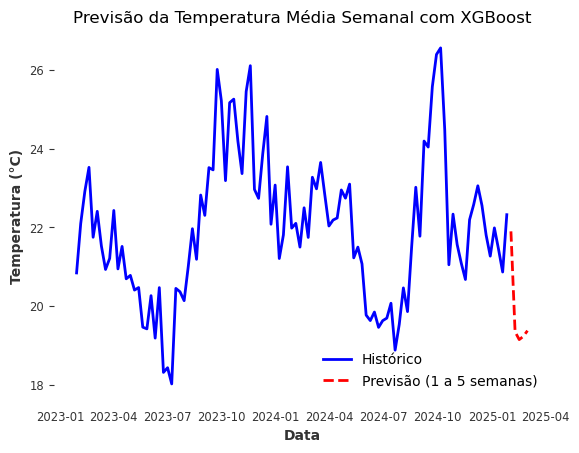

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    if mes in [5, 6, 7, 8, 9]:  # Estação seca
        return 1
    else:  # Estação chuvosa
        return 0

# Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# Agregação dos dados para obter a média semanal da temperatura instantânea
df_semanal = df_numerico.resample('W').mean()

# Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# Criar variáveis de entrada (X) e saída (y)
X, y = [], []
for i in range(5, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-5:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    X.append(entrada)
    y.append(df_semanal[coluna_temperatura].iloc[i])

X = np.array(X)
y = np.array(y)

# Divisão em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Criar e treinar o modelo XGBoost
model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, objective='reg:squarederror')
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Prever para as próximas 5 semanas sequencialmente
previsoes_futuras = []
entrada_atual = df_semanal[coluna_temperatura].iloc[-5:].values.tolist()
entrada_atual.append(df_semanal['estacao'].iloc[-1])  # Adicionando a estação atual

for i in range(5):
    previsao = model.predict(np.array(entrada_atual).reshape(1, -1))[0]
    previsoes_futuras.append(previsao)
    entrada_atual.pop(0)  # Remover o valor mais antigo
    entrada_atual.append(previsao)  # Adicionar a nova previsão
    entrada_atual[-1] = estacao_do_ano(df_semanal.index[-1] + pd.Timedelta(weeks=i+1))  # Atualizar a estação

# Criar índice de datas futuras
future_dates = [df_semanal.index[-1] + pd.Timedelta(weeks=i+1) for i in range(5)]

# Criar DataFrame com previsões futuras
df_future = pd.DataFrame({coluna_temperatura: previsoes_futuras}, index=future_dates)

# Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# Plotar a previsão junto com os dados históricos
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='blue')

# Plotando as previsões com linha tracejada vermelha
plt.plot(df_future.index, df_future[coluna_temperatura], linestyle="dashed", color='red', linewidth=2, label="Previsão (1 a 5 semanas)")

plt.title("Previsão da Temperatura Média Semanal com XGBoost")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()


Uso de hiperparâmetros

Fitting 3 folds for each of 20 candidates, totalling 60 fits
Melhores Hiperparâmetros Encontrados: {'subsample': 0.6, 'n_estimators': 100, 'min_child_weight': 7, 'max_depth': 7, 'learning_rate': 0.05, 'colsample_bytree': 0.8}
MAE: 1.22
MSE: 2.12
RMSE: 1.46
MAPE: 5.32%
sMAPE: 5.34%
R² Score: 0.30


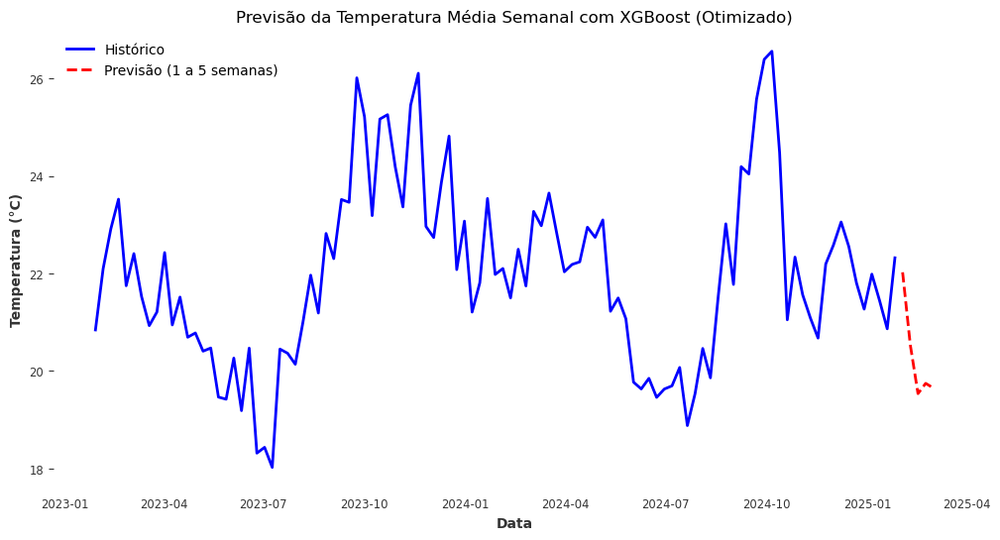

In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# Agregação dos dados para obter a média semanal da temperatura instantânea
df_semanal = df_numerico.resample('W').mean()

# Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# Criar variáveis de entrada (X) e saída (y)
X, y = [], []
for i in range(4, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-4:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    X.append(entrada)
    y.append(df_semanal[coluna_temperatura].iloc[i])

X = np.array(X)
y = np.array(y)

# Divisão em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Definir os hiperparâmetros para otimização
# Definir os hiperparâmetros para otimização com Grid Search
param_grid = {
    'n_estimators': [50, 100, 200, 300],  
    # Número de árvores (boosting rounds).
    # 50 -> Menos complexo, treina mais rápido, mas pode ter underfitting.
    # 100 -> Valor padrão comum, bom equilíbrio entre velocidade e desempenho.
    # 200, 300 -> Mais árvores permitem maior aprendizado, reduz overfitting se bem ajustado.

    'learning_rate': [0.01, 0.05, 0.1, 0.2],  
    # Taxa de aprendizado: controla o impacto de cada árvore no modelo final.
    # 0.01 -> Muito conservador, precisa de mais árvores (n_estimators maior).
    # 0.05 -> Moderado, bom para evitar overfitting com número médio de árvores.
    # 0.1 -> Valor padrão comum no XGBoost, equilíbrio entre velocidade e precisão.
    # 0.2 -> Mais agressivo, pode acelerar o treinamento, mas pode levar a overfitting.

    'max_depth': [3, 5, 7, 10],  
    # Profundidade máxima das árvores. Controla a complexidade do modelo.
    # 3 -> Modelos mais simples, reduz overfitting, bom para pequenos conjuntos de dados.
    # 5 -> Um nível intermediário de complexidade, equilíbrio entre viés e variância.
    # 7 -> Permite capturar padrões mais complexos, mas pode levar a overfitting.
    # 10 -> Modelos muito profundos podem overfitar, mas úteis se houver dados suficientes.

    'min_child_weight': [1, 3, 5, 7],  
    # Peso mínimo para que um nó seja dividido.
    # 1 -> Pode permitir divisão excessiva (mais complexidade).
    # 3 -> Um equilíbrio entre divisão agressiva e controle de complexidade.
    # 5 -> Restritivo, útil para evitar overfitting em conjuntos de dados pequenos.
    # 7 -> Muito restritivo, ideal se houver muito ruído nos dados.

    'subsample': [0.6, 0.8, 1.0],  
    # Fração dos dados usada para treinar cada árvore (evita overfitting).
    # 0.6 -> Apenas 60% dos dados usados, ajuda a evitar overfitting.
    # 0.8 -> 80% dos dados usados, equilíbrio entre generalização e desempenho.
    # 1.0 -> Usa 100% dos dados, pode levar a overfitting se os dados forem pequenos.

    'colsample_bytree': [0.6, 0.8, 1.0]  
    # Fração das features usadas por árvore.
    # 0.6 -> Apenas 60% das features usadas, reduz overfitting e melhora generalização.
    # 0.8 -> 80% das features usadas, equilíbrio entre variabilidade e desempenho.
    # 1.0 -> Usa todas as features, útil se houver poucas features disponíveis.
}

# Criar o modelo base
model = XGBRegressor(objective='reg:squarederror', random_state=42)

# Executar RandomizedSearchCV para encontrar os melhores hiperparâmetros
random_search = RandomizedSearchCV(model, param_distributions=param_grid, n_iter=20, cv=3, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=1, random_state=42)
random_search.fit(X_train, y_train)

# Melhor modelo encontrado
best_model = random_search.best_estimator_
print("Melhores Hiperparâmetros Encontrados:", random_search.best_params_)

# Fazer previsões no conjunto de teste
y_pred = best_model.predict(X_test)

# Prever para as próximas 5 semanas sequencialmente
previsoes_futuras = []
entrada_atual = df_semanal[coluna_temperatura].iloc[-4:].values.tolist()
entrada_atual.append(df_semanal['estacao'].iloc[-1])  # Adicionando a estação atual

for i in range(5):
    previsao = best_model.predict(np.array(entrada_atual).reshape(1, -1))[0]
    previsoes_futuras.append(previsao)
    entrada_atual.pop(0)  # Remover o valor mais antigo
    entrada_atual.append(previsao)  # Adicionar a nova previsão
    entrada_atual[-1] = estacao_do_ano(df_semanal.index[-1] + pd.Timedelta(weeks=i+1))  # Atualizar a estação

# Criar índice de datas futuras
future_dates = [df_semanal.index[-1] + pd.Timedelta(weeks=i+1) for i in range(5)]

# Criar DataFrame com previsões futuras
df_future = pd.DataFrame({coluna_temperatura: previsoes_futuras}, index=future_dates)

# Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 🔹 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(12, 6))

# Plotando os dados históricos
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='blue')

# Plotando as previsões com linha tracejada vermelha
plt.plot(df_future.index, df_future[coluna_temperatura], linestyle="dashed", color='red', linewidth=2, label="Previsão (1 a 5 semanas)")

plt.title("Previsão da Temperatura Média Semanal com XGBoost (Otimizado)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()


Fitting 3 folds for each of 64 candidates, totalling 192 fits
Melhores Hiperparâmetros Encontrados: {'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 1.0}
MAE: 1.39
MSE: 2.90
RMSE: 1.70
MAPE: 6.02%
sMAPE: 6.06%
R² Score: 0.04


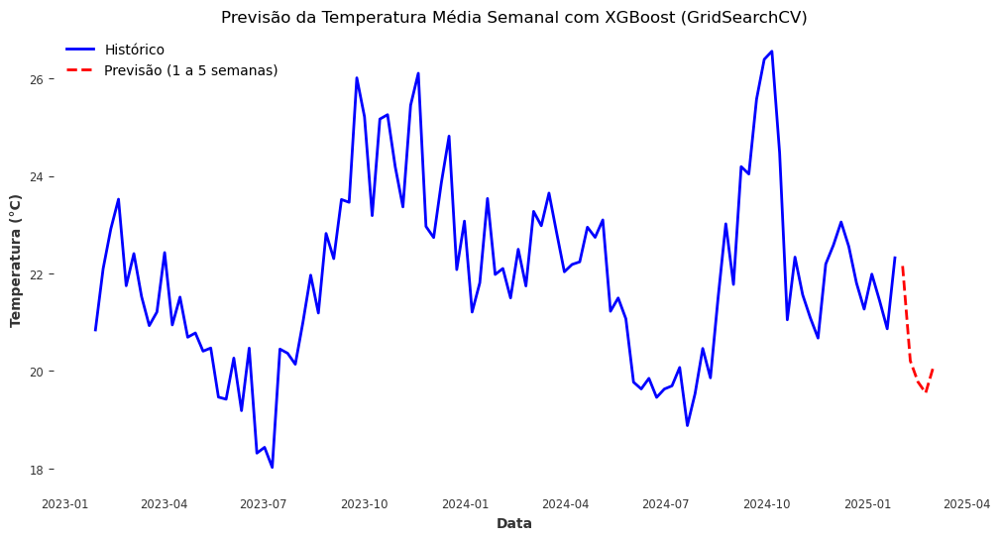

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# Agregação dos dados para obter a média semanal da temperatura instantânea
df_semanal = df_numerico.resample('W').mean()

# Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# Criar variáveis de entrada (X) e saída (y)
X, y = [], []
for i in range(4, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-4:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    X.append(entrada)
    y.append(df_semanal[coluna_temperatura].iloc[i])

X = np.array(X)
y = np.array(y)

# Divisão em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Definir os hiperparâmetros para otimização

param_grid = {
    'n_estimators': [100, 200], 
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 5],
    'min_child_weight': [1, 3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Criar o modelo base
model = XGBRegressor(objective='reg:squarederror', random_state=42)

# Executar GridSearchCV para encontrar os melhores hiperparâmetros
grid_search = GridSearchCV(model, param_grid, cv=3, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Melhor modelo encontrado
best_model = grid_search.best_estimator_
print("Melhores Hiperparâmetros Encontrados:", grid_search.best_params_)

# Fazer previsões no conjunto de teste
y_pred = best_model.predict(X_test)

# Prever para as próximas 4 semanas sequencialmente
previsoes_futuras = []
entrada_atual = df_semanal[coluna_temperatura].iloc[-4:].values.tolist()
entrada_atual.append(df_semanal['estacao'].iloc[-1])  # Adicionando a estação atual

for i in range(5):
    previsao = best_model.predict(np.array(entrada_atual).reshape(1, -1))[0]
    previsoes_futuras.append(previsao)
    entrada_atual.pop(0)  # Remover o valor mais antigo
    entrada_atual.append(previsao)  # Adicionar a nova previsão
    entrada_atual[-1] = estacao_do_ano(df_semanal.index[-1] + pd.Timedelta(weeks=i+1))  # Atualizar a estação

# Criar índice de datas futuras
future_dates = [df_semanal.index[-1] + pd.Timedelta(weeks=i+1) for i in range(5)]

# Criar DataFrame com previsões futuras
df_future = pd.DataFrame({coluna_temperatura: previsoes_futuras}, index=future_dates)

# Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 🔹 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(12, 6))


# Plotando os dados históricos
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='blue')

# Plotando as previsões com linha tracejada vermelha
plt.plot(df_future.index, df_future[coluna_temperatura], linestyle="dashed", color='red', linewidth=2, label="Previsão (1 a 5 semanas)")

plt.title("Previsão da Temperatura Média Semanal com XGBoost (GridSearchCV)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()


Testando: n_estimators=100, learning_rate=0.05, max_depth=3, min_child_weight=1, subsample=0.8, colsample_bytree=0.8
Testando: n_estimators=100, learning_rate=0.05, max_depth=3, min_child_weight=1, subsample=0.8, colsample_bytree=1.0
Testando: n_estimators=100, learning_rate=0.05, max_depth=3, min_child_weight=1, subsample=1.0, colsample_bytree=0.8
Testando: n_estimators=100, learning_rate=0.05, max_depth=3, min_child_weight=1, subsample=1.0, colsample_bytree=1.0
Testando: n_estimators=100, learning_rate=0.05, max_depth=3, min_child_weight=3, subsample=0.8, colsample_bytree=0.8
Testando: n_estimators=100, learning_rate=0.05, max_depth=3, min_child_weight=3, subsample=0.8, colsample_bytree=1.0
Testando: n_estimators=100, learning_rate=0.05, max_depth=3, min_child_weight=3, subsample=1.0, colsample_bytree=0.8
Testando: n_estimators=100, learning_rate=0.05, max_depth=3, min_child_weight=3, subsample=1.0, colsample_bytree=1.0
Testando: n_estimators=100, learning_rate=0.05, max_depth=5, min

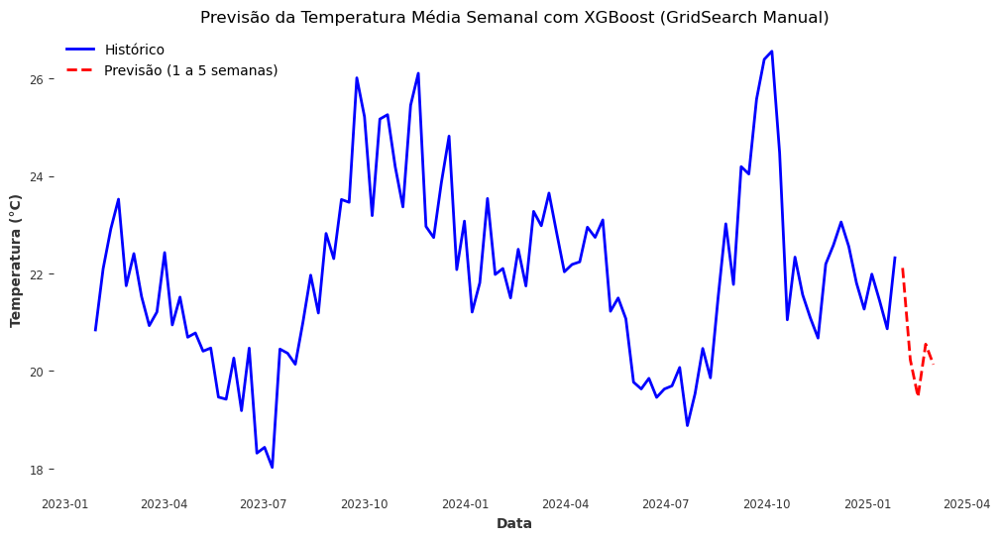

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.model_selection import GridSearchCV

# Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# Agregação dos dados para obter a média semanal da temperatura instantânea
df_semanal = df_numerico.resample('W').mean()

# Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# Criar variáveis de entrada (X) e saída (y)
X, y = [], []
for i in range(4, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-4:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    X.append(entrada)
    y.append(df_semanal[coluna_temperatura].iloc[i])

X = np.array(X)
y = np.array(y)

# Divisão em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Definir os hiperparâmetros para otimização
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 5],
    'min_child_weight': [1, 3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Função de avaliação do modelo
def evaluate_model(n_estimators, learning_rate, max_depth, min_child_weight, subsample, colsample_bytree):
    model = XGBRegressor(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        max_depth=max_depth,
        min_child_weight=min_child_weight,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        objective='reg:squarederror',
        random_state=42
    )
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    return mean_absolute_error(y_test, predictions)

# 🔹 Realizar a busca pelos melhores hiperparâmetros manualmente
best_params = None
best_score = float("inf")

for n_estimators in param_grid['n_estimators']:
    for learning_rate in param_grid['learning_rate']:
        for max_depth in param_grid['max_depth']:
            for min_child_weight in param_grid['min_child_weight']:
                for subsample in param_grid['subsample']:
                    for colsample_bytree in param_grid['colsample_bytree']:
                        print(f"Testando: n_estimators={n_estimators}, learning_rate={learning_rate}, max_depth={max_depth}, min_child_weight={min_child_weight}, subsample={subsample}, colsample_bytree={colsample_bytree}")
                        score = evaluate_model(n_estimators, learning_rate, max_depth, min_child_weight, subsample, colsample_bytree)
                        if score < best_score:
                            best_score = score
                            best_params = {
                                'n_estimators': n_estimators,
                                'learning_rate': learning_rate,
                                'max_depth': max_depth,
                                'min_child_weight': min_child_weight,
                                'subsample': subsample,
                                'colsample_bytree': colsample_bytree
                            }

print("\nMelhores hiperparâmetros encontrados:", best_params)

# Criar o melhor modelo encontrado
best_model = XGBRegressor(**best_params, objective='reg:squarederror', random_state=42)
best_model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = best_model.predict(X_test)

# Prever para as próximas 5 semanas sequencialmente
previsoes_futuras = []
entrada_atual = df_semanal[coluna_temperatura].iloc[-4:].values.tolist()
entrada_atual.append(df_semanal['estacao'].iloc[-1])  # Adicionando a estação atual

for i in range(5):
    previsao = best_model.predict(np.array(entrada_atual).reshape(1, -1))[0]
    previsoes_futuras.append(previsao)
    entrada_atual.pop(0)  # Remover o valor mais antigo
    entrada_atual.append(previsao)  # Adicionar a nova previsão
    entrada_atual[-1] = estacao_do_ano(df_semanal.index[-1] + pd.Timedelta(weeks=i+1))  # Atualizar a estação

# Criar índice de datas futuras
future_dates = [df_semanal.index[-1] + pd.Timedelta(weeks=i+1) for i in range(5)]

# Criar DataFrame com previsões futuras
df_future = pd.DataFrame({coluna_temperatura: previsoes_futuras}, index=future_dates)

# Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 🔹 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(12, 6))

# Plotando os dados históricos
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='blue')

# Plotando as previsões com linha tracejada vermelha
plt.plot(df_future.index, df_future[coluna_temperatura], linestyle="dashed", color='red', linewidth=2, label="Previsão (1 a 5 semanas)")

plt.title("Previsão da Temperatura Média Semanal com XGBoost (GridSearch Manual)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()


Usando radiação como parâmetro que inerfere na temperatura. Radiação é variável exógena à temperatura.


Radiação futura: radiação futura usando uma média móvel das últimas 4 semanas

MAE: 1.43
MSE: 3.02
RMSE: 1.74
MAPE: 6.19%
sMAPE: 6.24%
R² Score: 0.00


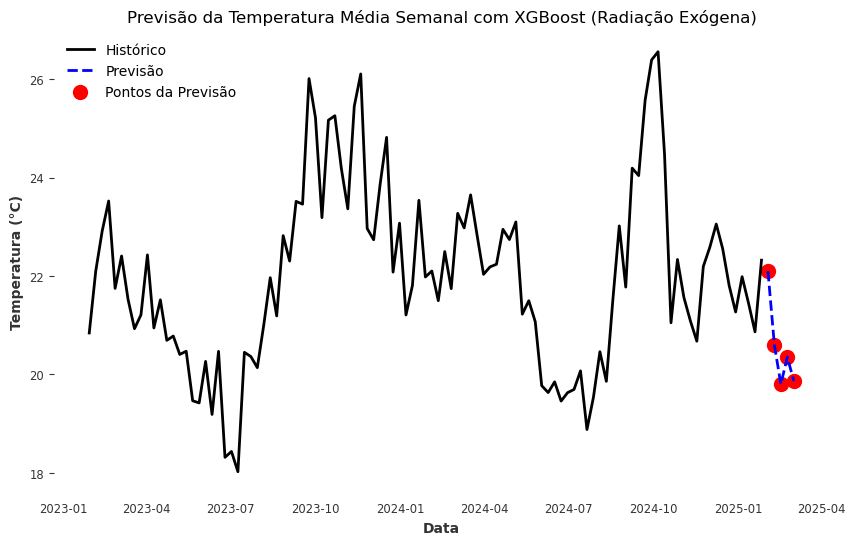

In [57]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# Criar variáveis de entrada (X) e saída (y)
X, y = [], []
for i in range(4, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-4:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-1])  # Radiação da semana passada (EXÓGENA)
    X.append(entrada)
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura (ENDÓGENA)

X = np.array(X)
y = np.array(y)

# Divisão em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Criar e treinar o modelo XGBoost
model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, objective='reg:squarederror')
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# **Criar previsões futuras da radiação (média móvel das últimas 4 semanas)**
previsoes_radiacao = []
for i in range(5):
    previsao_radiacao = df_semanal[coluna_radiacao].iloc[-4:].mean()  # Estimando a radiação futura pela média móvel
    previsoes_radiacao.append(previsao_radiacao)

# Prever para as próximas 5 semanas sequencialmente
previsoes_futuras = []
entrada_atual = df_semanal[coluna_temperatura].iloc[-4:].values.tolist()
entrada_atual.append(df_semanal['estacao'].iloc[-1])  # Adicionando a estação atual
entrada_atual.append(df_semanal[coluna_radiacao].iloc[-1])  # Última radiação disponível

for i in range(5):
    previsao = model.predict(np.array(entrada_atual).reshape(1, -1))[0]
    previsoes_futuras.append(previsao)
    entrada_atual.pop(0)  # Remover o valor mais antigo da temperatura
    entrada_atual.append(previsao)  # Adicionar a nova previsão
    entrada_atual[-2] = estacao_do_ano(df_semanal.index[-1] + pd.Timedelta(weeks=i+1))  # Atualizar a estação
    entrada_atual[-1] = previsoes_radiacao[i]  # Utilizar a estimativa da radiação futura

# Criar índice de datas futuras
future_dates = [df_semanal.index[-1] + pd.Timedelta(weeks=i+1) for i in range(5)]

# Criar DataFrame com previsões futuras
df_future = pd.DataFrame({coluna_temperatura: previsoes_futuras}, index=future_dates)

# Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_future.index, df_future[coluna_temperatura], linestyle='dashed', color='blue', linewidth=2, label="Previsão")  # Linha tracejada azul
plt.scatter(df_future.index, df_future[coluna_temperatura], color='red', label="Pontos da Previsão", marker='o', s=100)
plt.title("Previsão da Temperatura Média Semanal com XGBoost (Radiação Exógena)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()


Radiação  fixa: Usa a última radiação disponível como entrada para previsões futuras. Considera-se como melhor variável exógena a radiação fixa dado este artigo.
"percebe-se que o valor da  correlação fica mais forte quanto maior o número de horas usados para calcular a média da  radiação solar de horas anteriores" - Página 58
https://labeee.ufsc.br/sites/default/files/publicacoes/teses/TESE_Ana_L%C3%83%C2%ADgia_Papst_de_Abreu.pdf?utm_source=chatgpt.com
MÉTODO ESTIMATIVO 
DA TEMPERATURA INTERNA DE EDIFICAÇÕES 
RESIDENCIAIS EM USO 


Radiação Fixa

MAE: 0.90
MSE: 1.03
RMSE: 1.02
MAPE: 3.88%
sMAPE: 3.94%
R² Score: 0.66


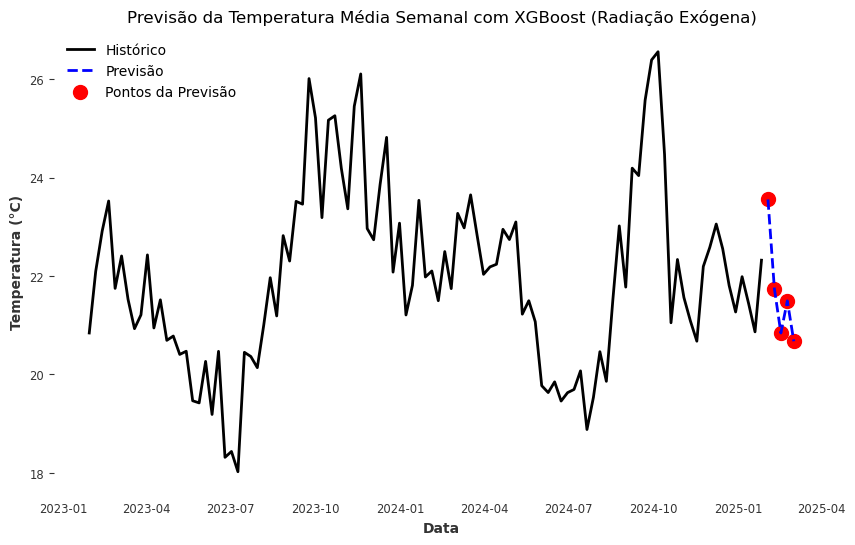

In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# Criar variáveis de entrada (X) e saída (y)
X, y = [], []
for i in range(4, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-4:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i])  # Adicionando a radiação
    X.append(entrada)
    y.append(df_semanal[coluna_temperatura].iloc[i])

X = np.array(X)
y = np.array(y)

# Divisão em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Criar e treinar o modelo XGBoost
model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, objective='reg:squarederror')
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Prever para as próximas 5 semanas sequencialmente
previsoes_futuras = []
entrada_atual = df_semanal[coluna_temperatura].iloc[-4:].values.tolist()
entrada_atual.append(df_semanal['estacao'].iloc[-1])  # Adicionando a estação atual
entrada_atual.append(df_semanal[coluna_radiacao].iloc[-1])  # Adicionando a radiação atual

for i in range(5):
    previsao = model.predict(np.array(entrada_atual).reshape(1, -1))[0]
    previsoes_futuras.append(previsao)
    entrada_atual.pop(0)  # Remover o valor mais antigo
    entrada_atual.append(previsao)  # Adicionar a nova previsão
    entrada_atual[-2] = estacao_do_ano(df_semanal.index[-1] + pd.Timedelta(weeks=i+1))  # Atualizar a estação
    entrada_atual[-1] = df_semanal[coluna_radiacao].iloc[-1]  # Mantendo a última radiação como proxy

# Criar índice de datas futuras
future_dates = [df_semanal.index[-1] + pd.Timedelta(weeks=i+1) for i in range(5)]

# Criar DataFrame com previsões futuras
df_future = pd.DataFrame({coluna_temperatura: previsoes_futuras}, index=future_dates)

# Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_future.index, df_future[coluna_temperatura], linestyle='dashed', color='blue', linewidth=2, label="Previsão")  # Linha tracejada azul
plt.scatter(df_future.index, df_future[coluna_temperatura], color='red', label="Pontos da Previsão", marker='o', s=100)
plt.title("Previsão da Temperatura Média Semanal com XGBoost (Radiação Exógena)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

Realizar divisão de dados com Treinamento, Teste, Validação.

Uso de proporção 70%/15%/15%

RADIAÇÃO MÓVEL

GridSearch, Média Móvel da Radiação.

Versão do XGBoost: 2.1.4
Fitting 3 folds for each of 384 candidates, totalling 1152 fits
🎯 Melhores hiperparâmetros: {'colsample_bytree': 0.8, 'gamma': 0.1, 'lambda': 1, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.8}
⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.
[0]	validation_0-rmse:2.42940
[1]	validation_0-rmse:2.31815
[2]	validation_0-rmse:2.20757
[3]	validation_0-rmse:2.08799
[4]	validation_0-rmse:2.01659
[5]	validation_0-rmse:1.97637
[6]	validation_0-rmse:1.94301
[7]	validation_0-rmse:1.86107
[8]	validation_0-rmse:1.84515
[9]	validation_0-rmse:1.78705
[10]	validation_0-rmse:1.76684
[11]	validation_0-rmse:1.73880
[12]	validation_0-rmse:1.70483
[13]	validation_0-rmse:1.69309
[14]	validation_0-rmse:1.67380
[15]	validation_0-rmse:1.66309
[16]	validation_0-rmse:1.64082
[17]	validation_0-rmse:1.62719
[18]	validation_0-rmse:1.62453
[19]	validation_0-rmse:1.61926
[20]	validation_0-rmse:1.60261
[21]	validation_0

C:\Users\barbara.madera\AppData\Local\anaconda3\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[172]	validation_0-rmse:1.49982
[173]	validation_0-rmse:1.50043
[174]	validation_0-rmse:1.50048
[175]	validation_0-rmse:1.50018
[176]	validation_0-rmse:1.50118
[177]	validation_0-rmse:1.50068
[178]	validation_0-rmse:1.50126
[179]	validation_0-rmse:1.50153
[180]	validation_0-rmse:1.50303
[181]	validation_0-rmse:1.50367
[182]	validation_0-rmse:1.50423
[183]	validation_0-rmse:1.50529
[184]	validation_0-rmse:1.50471
[185]	validation_0-rmse:1.50402
[186]	validation_0-rmse:1.50413
[187]	validation_0-rmse:1.50480
[188]	validation_0-rmse:1.50358
[189]	validation_0-rmse:1.50253
[190]	validation_0-rmse:1.50210
[191]	validation_0-rmse:1.50120
[192]	validation_0-rmse:1.49987
[193]	validation_0-rmse:1.49610
[194]	validation_0-rmse:1.49604
[195]	validation_0-rmse:1.49604
[196]	validation_0-rmse:1.49647
[197]	validation_0-rmse:1.49716
[198]	validation_0-rmse:1.49657
[199]	validation_0-rmse:1.49650
📊 **Métricas do Modelo**
MAE: 1.12
MSE: 1.94
RMSE: 1.39
MAPE: 5.14%
sMAPE: 5.08%
R² Score: -1.22


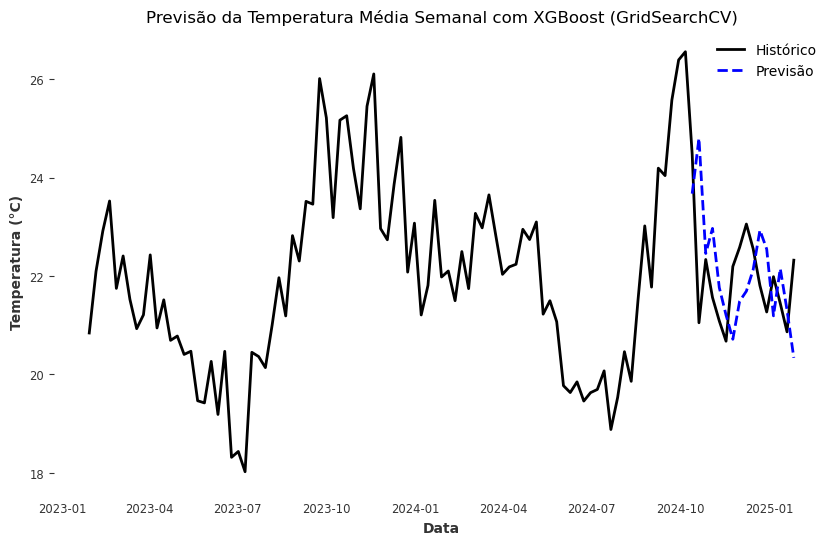

Exemplo 1:
X: [  20.84305556   22.09642857   22.91309524   23.52321429    0.
 1000.29047619]
y (temperatura prevista): 21.748809523809523

Exemplo 2:
X: [ 22.09642857  22.91309524  23.52321429  21.74880952   0.
 907.55659722]
y (temperatura prevista): 22.40714285714286

Exemplo 3:
X: [  22.91309524   23.52321429   21.74880952   22.40714286    0.
 1003.20625   ]
y (temperatura prevista): 21.527380952380952

Exemplo 4:
X: [ 23.52321429  21.74880952  22.40714286  21.52738095   0.
 727.94360119]
y (temperatura prevista): 20.93095238095238

Exemplo 5:
X: [ 21.74880952  22.40714286  21.52738095  20.93095238   0.
 631.49895833]
y (temperatura prevista): 21.211309523809526

Exemplo 97:
X: [ 22.58095238  23.05505952  22.55297619  21.80535714   0.
 762.27927489]
y (temperatura prevista): 21.26964285714286

Exemplo 98:
X: [ 23.05505952  22.55297619  21.80535714  21.26964286   0.
 691.04304654]
y (temperatura prevista): 21.986309523809524

Exemplo 99:
X: [ 22.55297619  21.80535714  21.26964286  21

In [59]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# 📌 Verificar versão do XGBoost
import xgboost
print(f"Versão do XGBoost: {xgboost.__version__}")

# 📌 Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# 📌 Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# 📌 Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# 📌 Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# 📌 Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# 📌 Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# 📌 Criar variáveis de entrada (X) e saída (y) usando Rolling Window com RADIAÇÃO FIXA
window_size = 4  # Janela deslizante de 4 semanas
X, y = [], []
for i in range(window_size, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-window_size:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-1])  # Pegando a radiação da semana passada (FIXA)
    X.append(entrada)
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura (Endógena)

X = np.array(X)
y = np.array(y)

# 📌 Divisão dos dados em Treino (70%), Validação (15%) e Teste (15%)
train_size = int(0.7 * len(X))
val_size = int(0.15 * len(X))

X_train, y_train = X[:train_size], y[:train_size]
X_val, y_val = X[train_size:train_size+val_size], y[train_size:train_size+val_size]
X_test, y_test = X[train_size+val_size:], y[train_size+val_size:]

# 📌 Definição do espaço de busca de hiperparâmetros para GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5],
    'min_child_weight': [1, 3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1],
    'lambda': [1, 2]
}

# 📌 Criar modelo base para otimização
xgb_base = XGBRegressor(objective='reg:squarederror', random_state=42)

# 📌 Aplicar GridSearchCV para encontrar os melhores hiperparâmetros
grid_search = GridSearchCV(
    estimator=xgb_base,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1,
    n_jobs=-1
)

# 📌 Executar a busca de hiperparâmetros
grid_search.fit(X_train, y_train)

# 📌 Exibir os melhores hiperparâmetros encontrados
best_params = grid_search.best_params_
print(f"🎯 Melhores hiperparâmetros: {best_params}")

# 📌 Criar o modelo otimizado com os melhores hiperparâmetros
model = XGBRegressor(**best_params)

# 📌 Treinar o modelo
try:
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric="rmse",
        early_stopping_rounds=10,
        verbose=True
    )
except TypeError:
    print("⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.")
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=True
    )

# 📌 Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# 📌 Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 📌 Função para calcular sMAPE
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

# 📌 Exibir métricas
print(f"📊 **Métricas do Modelo**")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 📌 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_semanal.index[-len(y_test):], y_pred, linestyle='dashed', color='blue', linewidth=2, label="Previsão")  # Linha tracejada azul
plt.title("Previsão da Temperatura Média Semanal com XGBoost (GridSearchCV)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

#Etapa de verificação do Rolling Window e Divisão de Dados(Treino, Teste, Validação)

# Verificar a estrutura das primeiras 5 amostras
for i in range(5):
    print(f"Exemplo {i+1}:")
    print(f"X: {X[i]}")
    print(f"y (temperatura prevista): {y[i]}\n")

# Últimos 5 exemplos para garantir alinhamento correto
for i in range(len(X) - 5, len(X)):
    print(f"Exemplo {i+1}:")
    print(f"X: {X[i]}")
    print(f"y (temperatura prevista): {y[i]}\n")


print(f"Tamanho total de X: {len(X)}")
print(f"Tamanho do conjunto de treino: {len(X_train)}")
print(f"Tamanho do conjunto de validação: {len(X_val)}")
print(f"Tamanho do conjunto de teste: {len(X_test)}")

# Verificar se há datas repetidas entre treino e teste
overlap_train_val = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size:train_size+val_size])
overlap_train_test = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size+val_size:])
overlap_val_test = set(df_semanal.index[train_size:train_size+val_size]) & set(df_semanal.index[train_size+val_size:])

print(f"🔍 Número de datas repetidas entre Treino e Validação: {len(overlap_train_val)}")
print(f"🔍 Número de datas repetidas entre Treino e Teste: {len(overlap_train_test)}")
print(f"🔍 Número de datas repetidas entre Validação e Teste: {len(overlap_val_test)}")


Uso de GrindSearchCV, validação e Radiação Fixa

Versão do XGBoost: 2.1.4
Fitting 3 folds for each of 20 candidates, totalling 60 fits
🎯 Melhores hiperparâmetros: {'subsample': 1.0, 'n_estimators': 50, 'min_child_weight': 5, 'max_depth': 7, 'learning_rate': 0.05, 'lambda': 1, 'gamma': 0, 'colsample_bytree': 0.8}
⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.
[0]	validation_0-rmse:2.50559
[1]	validation_0-rmse:2.42561
[2]	validation_0-rmse:2.35168
[3]	validation_0-rmse:2.29558
[4]	validation_0-rmse:2.25320
[5]	validation_0-rmse:2.19120
[6]	validation_0-rmse:2.16848
[7]	validation_0-rmse:2.11004
[8]	validation_0-rmse:2.09102
[9]	validation_0-rmse:2.03777
[10]	validation_0-rmse:2.02073
[11]	validation_0-rmse:1.98476
[12]	validation_0-rmse:1.95737
[13]	validation_0-rmse:1.94452
[14]	validation_0-rmse:1.90223
[15]	validation_0-rmse:1.89148
[16]	validation_0-rmse:1.85998
[17]	validation_0-rmse:1.85095
[18]	validation_0-rmse:1.81660
[19]	validation_0-rmse:1.78324
[20]	validation_0-rmse:1.75013
[21]	validation_0-rmse

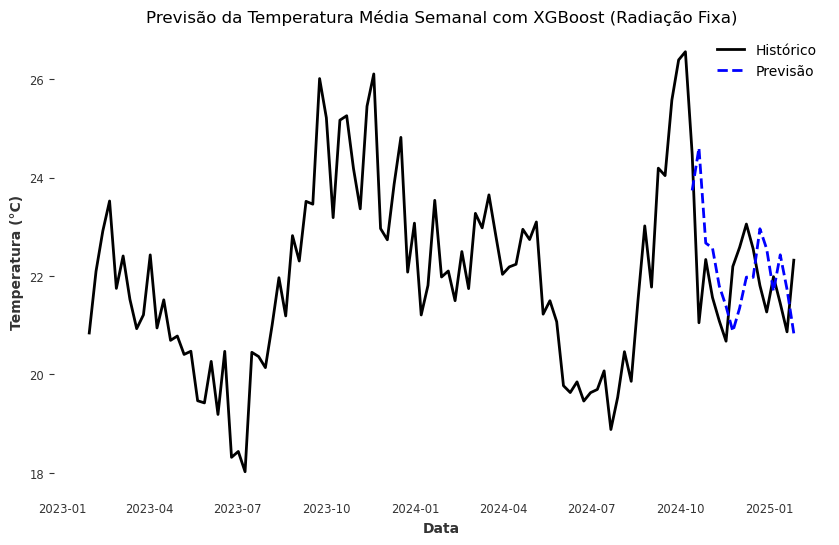

Tamanho do conjunto de treino: 70
Tamanho do conjunto de validação: 15
Tamanho do conjunto de teste: 16
Número de datas repetidas entre treino e teste: 0
Número de iterações do treinamento: 50


In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# 📌 Verificar versão do XGBoost
import xgboost
print(f"Versão do XGBoost: {xgboost.__version__}")

# 📌 Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# 📌 Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# 📌 Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# 📌 Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# 📌 Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# 📌 Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# 📌 Criar variáveis de entrada (X) e saída (y) usando Rolling Window com RADIAÇÃO FIXA
window_size = 4  # Janela deslizante de 4 semanas
X, y = [], []
for i in range(window_size, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-window_size:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-1])  # Pegando a radiação da semana passada (FIXA)
    X.append(entrada)
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura (Endógena)

X = np.array(X)
y = np.array(y)

# 📌 Divisão dos dados em Treino (70%), Validação (15%) e Teste (15%)
train_size = int(0.7 * len(X))
val_size = int(0.15 * len(X))

X_train, y_train = X[:train_size], y[:train_size]
X_val, y_val = X[train_size:train_size+val_size], y[train_size:train_size+val_size]
X_test, y_test = X[train_size+val_size:], y[train_size+val_size:]

# 📌 Definição do espaço de busca de hiperparâmetros para RandomizedSearchCV
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3],
    'lambda': [1, 1.5, 2]
}

# 📌 Criar modelo base para otimização
xgb_base = XGBRegressor(objective='reg:squarederror', random_state=42)

# 📌 Aplicar RandomizedSearchCV para encontrar os melhores hiperparâmetros
random_search = RandomizedSearchCV(
    estimator=xgb_base,
    param_distributions=param_grid,
    n_iter=20,  # Número de combinações a serem testadas
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

# 📌 Executar a busca de hiperparâmetros
random_search.fit(X_train, y_train)

# 📌 Exibir os melhores hiperparâmetros encontrados
best_params = random_search.best_params_
print(f"🎯 Melhores hiperparâmetros: {best_params}")

# 📌 Criar o modelo otimizado com os melhores hiperparâmetros
model = XGBRegressor(**best_params)

# 📌 Treinar o modelo
try:
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric="rmse",
        early_stopping_rounds=10,
        verbose=True
    )
except TypeError:
    print("⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.")
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=True
    )

# 📌 Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# 📌 Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 📌 Função para calcular sMAPE
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

# 📌 Exibir métricas
print(f"📊 **Métricas do Modelo**")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 📌 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_semanal.index[-len(y_test):], y_pred, linestyle='dashed', color='blue', linewidth=2, label="Previsão")  # Linha tracejada azul
plt.title("Previsão da Temperatura Média Semanal com XGBoost (Radiação Fixa)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

print(f"Tamanho do conjunto de treino: {len(X_train)}")
print(f"Tamanho do conjunto de validação: {len(X_val)}")
print(f"Tamanho do conjunto de teste: {len(X_test)}")

overlap_train_test = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size+val_size:])
print(f"Número de datas repetidas entre treino e teste: {len(overlap_train_test)}")

print(f"Número de iterações do treinamento: {model.get_booster().num_boosted_rounds()}")




Uso de treinamento, teste e validação e GridSearchcv, Radiação Fixa

Versão do XGBoost: 2.1.4
Fitting 3 folds for each of 384 candidates, totalling 1152 fits
🎯 Melhores hiperparâmetros: {'colsample_bytree': 1.0, 'gamma': 0, 'lambda': 1, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 1.0}
⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.
[0]	validation_0-rmse:2.60494
[1]	validation_0-rmse:2.63030
[2]	validation_0-rmse:2.66267
[3]	validation_0-rmse:2.69981
[4]	validation_0-rmse:2.73998
[5]	validation_0-rmse:2.78178
[6]	validation_0-rmse:2.82415
[7]	validation_0-rmse:2.86017
[8]	validation_0-rmse:2.90167
[9]	validation_0-rmse:2.94200
[10]	validation_0-rmse:2.98085
[11]	validation_0-rmse:3.01801
[12]	validation_0-rmse:3.05335
[13]	validation_0-rmse:3.08681
[14]	validation_0-rmse:3.11398
[15]	validation_0-rmse:3.14392
[16]	validation_0-rmse:3.16776
[17]	validation_0-rmse:3.19432
[18]	validation_0-rmse:3.21751
[19]	validation_0-rmse:3.24075
[20]	validation_0-rmse:3.25885
[21]	validation_0-r

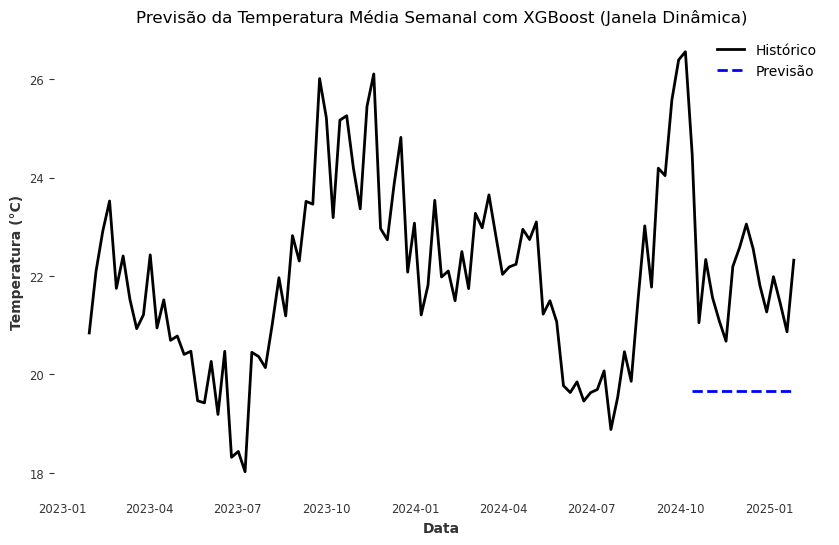

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# 📌 Verificar versão do XGBoost
import xgboost
print(f"Versão do XGBoost: {xgboost.__version__}")

# 📌 Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# 📌 Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# 📌 Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# 📌 Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# 📌 Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# 📌 Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# 📌 Criar variáveis de entrada (X) e saída (y) usando Janela Dinâmica
X, y = [], []
for i in range(4, len(df_semanal)):  # Começa com 4 semanas e cresce ao longo do tempo
    entrada = df_semanal[coluna_temperatura].iloc[:i].values.tolist()  # Usa todas as semanas até a atual
    entrada.append(df_semanal['estacao'].iloc[i])  # Adiciona a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-1])  # Pegando a radiação da semana passada (FIXA)
    X.append(entrada)
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura (Endógena)

X = np.array([np.pad(x, (0, max(len(max(X, key=len)) - len(x), 0)), 'constant') for x in X])  # Ajusta tamanhos diferentes
y = np.array(y)

# 📌 Divisão dos dados em Treino (70%), Validação (15%) e Teste (15%)
train_size = int(0.7 * len(X))
val_size = int(0.15 * len(X))

X_train, y_train = X[:train_size], y[:train_size]
X_val, y_val = X[train_size:train_size+val_size], y[train_size:train_size+val_size]
X_test, y_test = X[train_size+val_size:], y[train_size+val_size:]

# 📌 Definição do espaço de busca de hiperparâmetros para GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5],
    'min_child_weight': [1, 3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1],
    'lambda': [1, 2]
}

# 📌 Criar modelo base para otimização
xgb_base = XGBRegressor(objective='reg:squarederror', random_state=42)

# 📌 Aplicar GridSearchCV para encontrar os melhores hiperparâmetros
grid_search = GridSearchCV(
    estimator=xgb_base,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1,
    n_jobs=-1
)

# 📌 Executar a busca de hiperparâmetros
grid_search.fit(X_train, y_train)

# 📌 Exibir os melhores hiperparâmetros encontrados
best_params = grid_search.best_params_
print(f"🎯 Melhores hiperparâmetros: {best_params}")

# 📌 Criar o modelo otimizado com os melhores hiperparâmetros
model = XGBRegressor(**best_params)

# 📌 Treinar o modelo
try:
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric="rmse",
        early_stopping_rounds=10,
        verbose=True
    )
except TypeError:
    print("⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.")
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=True
    )

# 📌 Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# 📌 Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 📌 Função para calcular sMAPE
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

# 📌 Exibir métricas
print(f"📊 **Métricas do Modelo**")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 📌 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_semanal.index[-len(y_test):], y_pred, linestyle='dashed', color='blue', linewidth=2, label="Previsão")  # Linha tracejada azul
plt.title("Previsão da Temperatura Média Semanal com XGBoost (Janela Dinâmica)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()


Média Móvel da radiação, Rolling Window, Sem uso de otimização de hiperparêmtros

Versão do XGBoost: 2.1.4
⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.
[0]	validation_0-rmse:2.43837
[1]	validation_0-rmse:2.30621
[2]	validation_0-rmse:2.20218
[3]	validation_0-rmse:2.11632
[4]	validation_0-rmse:2.04201
[5]	validation_0-rmse:1.95423
[6]	validation_0-rmse:1.87346
[7]	validation_0-rmse:1.82805
[8]	validation_0-rmse:1.76171
[9]	validation_0-rmse:1.73845
[10]	validation_0-rmse:1.70016
[11]	validation_0-rmse:1.69583
[12]	validation_0-rmse:1.68501
[13]	validation_0-rmse:1.66124
[14]	validation_0-rmse:1.62888
[15]	validation_0-rmse:1.61008
[16]	validation_0-rmse:1.59427
[17]	validation_0-rmse:1.58384
[18]	validation_0-rmse:1.58685
[19]	validation_0-rmse:1.58328
[20]	validation_0-rmse:1.58009
[21]	validation_0-rmse:1.58962
[22]	validation_0-rmse:1.59501
[23]	validation_0-rmse:1.58790
[24]	validation_0-rmse:1.59596
[25]	validation_0-rmse:1.60369
[26]	validation_0-rmse:1.60105
[27]	validation_0-rmse:1.59639
[28]	validation_0-rmse:1.60101
[29]	validatio

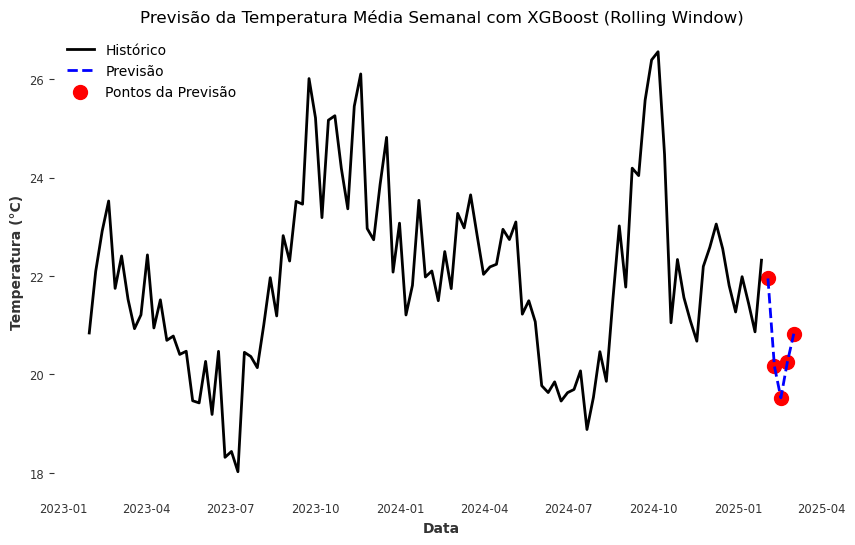

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# 📌 Verificar versão do XGBoost
import xgboost
print(f"Versão do XGBoost: {xgboost.__version__}")

# 📌 Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# 📌 Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# 📌 Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# 📌 Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# 📌 Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# 📌 Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# 📌 Criar variáveis de entrada (X) e saída (y) usando Rolling Window
window_size = 4  # Janela deslizante de 4 semanas
X, y = [], []
for i in range(window_size, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-window_size:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-window_size:i].mean())  # Média móvel da radiação
    X.append(entrada)
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura (Endógena)

X = np.array(X)
y = np.array(y)

# 📌 Definição de Rolling Window para Treino, Validação e Teste
train_size = int(0.7 * len(X))
val_size = int(0.15 * len(X))

X_train, y_train = X[:train_size], y[:train_size]
X_val, y_val = X[train_size:train_size+val_size], y[train_size:train_size+val_size]
X_test, y_test = X[train_size+val_size:], y[train_size+val_size:]

# 📌 Criar o modelo XGBoost
model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, objective='reg:squarederror')

# 📌 Treinar o modelo XGBoost
try:
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric="rmse",
        early_stopping_rounds=10,
        verbose=True
    )
except TypeError:
    print("⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.")
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=True
    )

# 📌 Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# 📌 Previsão das próximas 5 semanas usando Rolling Window
previsoes_futuras = []
entrada_atual = df_semanal[coluna_temperatura].iloc[-window_size:].values.tolist()
entrada_atual.append(df_semanal['estacao'].iloc[-1])  # Adicionando a estação atual
entrada_atual.append(df_semanal[coluna_radiacao].iloc[-window_size:].mean())  # Média móvel da radiação

for i in range(5):
    previsao = model.predict(np.array(entrada_atual).reshape(1, -1))[0]
    previsoes_futuras.append(previsao)
    entrada_atual.pop(0)  # Remover o valor mais antigo da temperatura
    entrada_atual.append(previsao)  # Adicionar a nova previsão
    entrada_atual[-2] = estacao_do_ano(df_semanal.index[-1] + pd.Timedelta(weeks=i+1))  # Atualizar a estação
    entrada_atual[-1] = df_semanal[coluna_radiacao].iloc[-window_size:].mean()  # Média móvel da radiação

# 📌 Criar índice de datas futuras
future_dates = [df_semanal.index[-1] + pd.Timedelta(weeks=i+1) for i in range(5)]

# 📌 Criar DataFrame com previsões futuras
df_future = pd.DataFrame({coluna_temperatura: previsoes_futuras}, index=future_dates)

# 📌 Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 📌 Função para calcular sMAPE (Erro Percentual Absoluto Médio Simétrico)
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

# 📌 Exibir métricas
print(f"📊 **Métricas do Modelo**")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 📌 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_future.index, df_future[coluna_temperatura], linestyle='dashed', color='blue', linewidth=2, label="Previsão")  # Linha tracejada azul
plt.scatter(df_future.index, df_future[coluna_temperatura], color='red', label="Pontos da Previsão", marker='o', s=100)
plt.title("Previsão da Temperatura Média Semanal com XGBoost (Rolling Window)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()


GridSearch, Média Móvel da Radiação, Rolling Window 4 semanas

Versão do XGBoost: 2.1.4
Fitting 3 folds for each of 256 candidates, totalling 768 fits
🎯 Melhores hiperparâmetros: {'colsample_bytree': 1.0, 'gamma': 0.1, 'lambda': 1, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 1.0}
⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.
[0]	validation_0-rmse:2.50174
[1]	validation_0-rmse:2.42094
[2]	validation_0-rmse:2.34216
[3]	validation_0-rmse:2.26771
[4]	validation_0-rmse:2.19951
[5]	validation_0-rmse:2.15306
[6]	validation_0-rmse:2.10793
[7]	validation_0-rmse:2.05666
[8]	validation_0-rmse:2.01273
[9]	validation_0-rmse:1.98008
[10]	validation_0-rmse:1.93613
[11]	validation_0-rmse:1.89894
[12]	validation_0-rmse:1.87173
[13]	validation_0-rmse:1.83258
[14]	validation_0-rmse:1.80739
[15]	validation_0-rmse:1.78448
[16]	validation_0-rmse:1.75080
[17]	validation_0-rmse:1.72803
[18]	validation_0-rmse:1.69744
[19]	validation_0-rmse:1.67865
[20]	validation_0-rmse:1.66193
[21]	validation_0

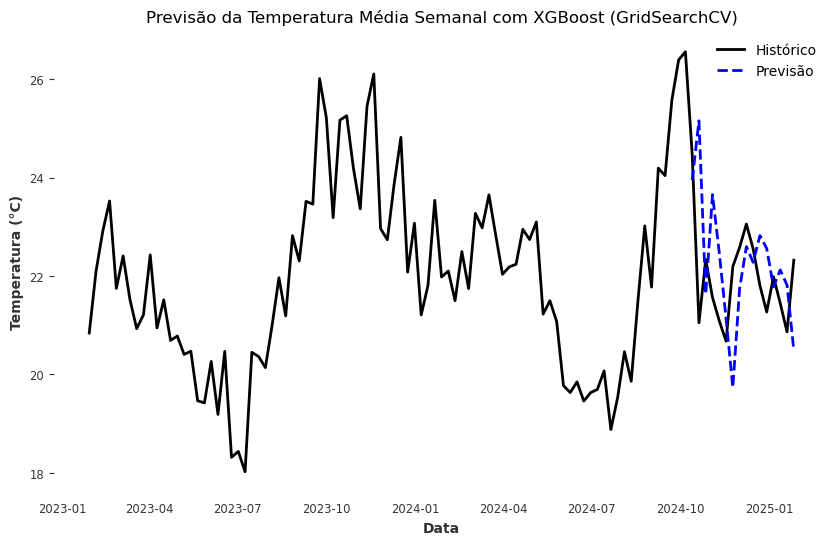

Exemplo 97:
X: [ 22.58095238  23.05505952  22.55297619  21.80535714   0.
 807.95718344]
y (temperatura prevista): 21.26964285714286

Exemplo 98:
X: [ 23.05505952  22.55297619  21.80535714  21.26964286   0.
 785.94425731]
y (temperatura prevista): 21.986309523809524

Exemplo 99:
X: [ 22.55297619  21.80535714  21.26964286  21.98630952   0.
 755.39458874]
y (temperatura prevista): 21.445833333333333

Exemplo 100:
X: [ 21.80535714  21.26964286  21.98630952  21.44583333   0.
 737.95378788]
y (temperatura prevista): 20.866071428571427

Exemplo 101:
X: [ 21.26964286  21.98630952  21.44583333  20.86607143   0.
 740.90928594]
y (temperatura prevista): 22.321250000000003

Tamanho total de X: 101
Tamanho do conjunto de treino: 70
Tamanho do conjunto de validação: 15
Tamanho do conjunto de teste: 16
🔍 Número de datas repetidas entre Treino e Validação: 0
🔍 Número de datas repetidas entre Treino e Teste: 0
🔍 Número de datas repetidas entre Validação e Teste: 0
📊 MAE Treino: 0.26
📊 MAE Validação: 1.

In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.model_selection import GridSearchCV

# 📌 Verificar versão do XGBoost
import xgboost
print(f"Versão do XGBoost: {xgboost.__version__}")

# 📌 Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# 📌 Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# 📌 Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# 📌 Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# 📌 Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# 📌 Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# 📌 Criar variáveis de entrada (X) e saída (y) usando Rolling Window
window_size = 4  # Janela deslizante de 4 semanas
X, y = [], []
for i in range(window_size, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-window_size:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-window_size:i].mean())  # Média móvel da radiação
    X.append(entrada) #substitui o pop - cria array a cada iteração sem modificar X diretamente
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura (Endógena)

X = np.array(X)
y = np.array(y)

# 📌 Divisão dos dados em Treino (70%), Validação (15%) e Teste (15%)
train_size = int(0.7 * len(X))
val_size = int(0.15 * len(X))

X_train, y_train = X[:train_size], y[:train_size]
X_val, y_val = X[train_size:train_size+val_size], y[train_size:train_size+val_size]
X_test, y_test = X[train_size+val_size:], y[train_size+val_size:]

# 📌 Definição do espaço de busca de hiperparâmetros para GridSearchCV
param_grid = {
    'n_estimators': [50, 100],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 5],
    'min_child_weight': [1, 3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1],
    'lambda': [1, 2]
}

# 📌 Criar modelo base para otimização
xgb_base = XGBRegressor(objective='reg:squarederror', random_state=42)

# 📌 Aplicar GridSearchCV para encontrar os melhores hiperparâmetros
grid_search = GridSearchCV(
    estimator=xgb_base,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1,
    n_jobs=-1
)

# 📌 Executar a busca de hiperparâmetros
grid_search.fit(X_train, y_train)

# 📌 Exibir os melhores hiperparâmetros encontrados
best_params = grid_search.best_params_
print(f"🎯 Melhores hiperparâmetros: {best_params}")

# 📌 Criar o modelo otimizado com os melhores hiperparâmetros
model = XGBRegressor(**best_params)

# 📌 Treinar o modelo
try:
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric="rmse",
        early_stopping_rounds=10,
        verbose=True
    )
except TypeError:
    print("⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.")
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=True
    )

# 📌 Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# 📌 Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 📌 Função para calcular sMAPE
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

# 📌 Exibir métricas
print(f"📊 **Métricas do Modelo**")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 📌 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_semanal.index[-len(y_test):], y_pred, linestyle='dashed', color='blue', linewidth=2, label="Previsão")  # Linha tracejada azul
plt.title("Previsão da Temperatura Média Semanal com XGBoost (GridSearchCV)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()


# Últimos 5 exemplos para garantir alinhamento correto
for i in range(len(X) - 5, len(X)):
    print(f"Exemplo {i+1}:")
    print(f"X: {X[i]}")
    print(f"y (temperatura prevista): {y[i]}\n")


print(f"Tamanho total de X: {len(X)}")
print(f"Tamanho do conjunto de treino: {len(X_train)}")
print(f"Tamanho do conjunto de validação: {len(X_val)}")
print(f"Tamanho do conjunto de teste: {len(X_test)}")

# Verificar se há datas repetidas entre treino e teste
overlap_train_val = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size:train_size+val_size])
overlap_train_test = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size+val_size:])
overlap_val_test = set(df_semanal.index[train_size:train_size+val_size]) & set(df_semanal.index[train_size+val_size:])

print(f"🔍 Número de datas repetidas entre Treino e Validação: {len(overlap_train_val)}")
print(f"🔍 Número de datas repetidas entre Treino e Teste: {len(overlap_train_test)}")
print(f"🔍 Número de datas repetidas entre Validação e Teste: {len(overlap_val_test)}")

y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)
y_test_pred = model.predict(X_test)


mae_train = mean_absolute_error(y_train, y_train_pred)
mae_val = mean_absolute_error(y_val, y_val_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)


print(f"📊 MAE Treino: {mae_train:.2f}")
print(f"📊 MAE Validação: {mae_val:.2f}")
print(f"📊 MAE Teste: {mae_test:.2f}")



RadomziedSearchCV, Média Móvel da Radiação, Rolling Window de 4 semanas

Versão do XGBoost: 2.1.4
Fitting 3 folds for each of 20 candidates, totalling 60 fits
 Melhores hiperparâmetros: {'subsample': 1.0, 'n_estimators': 50, 'min_child_weight': 5, 'max_depth': 7, 'learning_rate': 0.05, 'lambda': 1.5, 'gamma': 0.2, 'colsample_bytree': 0.6}
 `early_stopping_rounds` não suportado. Treinando sem early stopping.
[0]	validation_0-rmse:2.50852
[1]	validation_0-rmse:2.43201
[2]	validation_0-rmse:2.36093
[3]	validation_0-rmse:2.30671
[4]	validation_0-rmse:2.25819
[5]	validation_0-rmse:2.19621
[6]	validation_0-rmse:2.17417
[7]	validation_0-rmse:2.13835
[8]	validation_0-rmse:2.13775
[9]	validation_0-rmse:2.10497
[10]	validation_0-rmse:2.10011
[11]	validation_0-rmse:2.06127
[12]	validation_0-rmse:2.03871
[13]	validation_0-rmse:2.03599
[14]	validation_0-rmse:1.99495
[15]	validation_0-rmse:1.98364
[16]	validation_0-rmse:1.97837
[17]	validation_0-rmse:1.96475
[18]	validation_0-rmse:1.92815
[19]	validation_0-rmse:1.90465
[20]	validation_0-rmse:1.87165
[21]	validation_0-rms

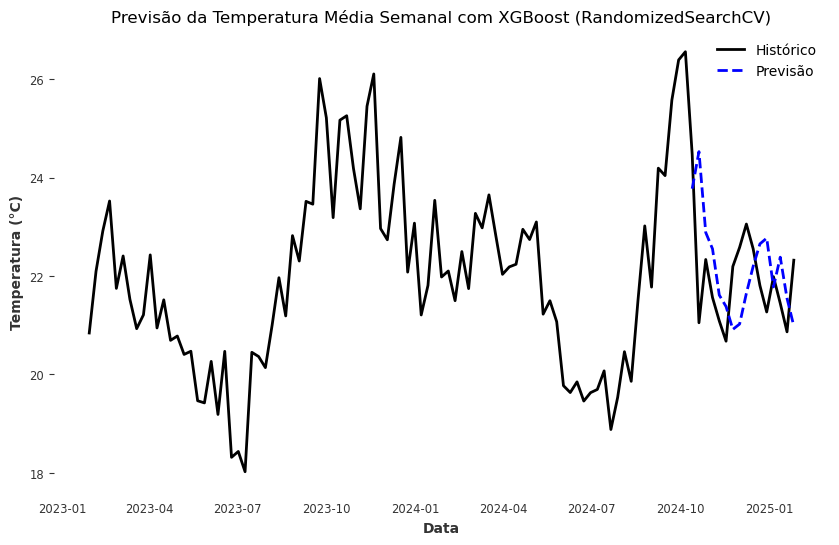

Exemplo 97:
X: [ 22.58095238  23.05505952  22.55297619  21.80535714   0.
 807.95718344]
y (temperatura prevista): 21.26964285714286

Exemplo 98:
X: [ 23.05505952  22.55297619  21.80535714  21.26964286   0.
 785.94425731]
y (temperatura prevista): 21.986309523809524

Exemplo 99:
X: [ 22.55297619  21.80535714  21.26964286  21.98630952   0.
 755.39458874]
y (temperatura prevista): 21.445833333333333

Exemplo 100:
X: [ 21.80535714  21.26964286  21.98630952  21.44583333   0.
 737.95378788]
y (temperatura prevista): 20.866071428571427

Exemplo 101:
X: [ 21.26964286  21.98630952  21.44583333  20.86607143   0.
 740.90928594]
y (temperatura prevista): 22.321250000000003

Tamanho total de X: 101
Tamanho do conjunto de treino: 70
Tamanho do conjunto de validação: 15
Tamanho do conjunto de teste: 16
🔍 Número de datas repetidas entre Treino e Validação: 0
🔍 Número de datas repetidas entre Treino e Teste: 0
🔍 Número de datas repetidas entre Validação e Teste: 0
📊 MAE Treino: 0.45
📊 MAE Validação: 1.

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.model_selection import RandomizedSearchCV

# 📌 Verificar versão do XGBoost
import xgboost
print(f"Versão do XGBoost: {xgboost.__version__}")

# 📌 Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# 📌 Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# 📌 Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# 📌 Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# 📌 Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# 📌 Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# 📌 Criar variáveis de entrada (X) e saída (y) usando Rolling Window
window_size = 4  # Janela deslizante de 4 semanas
X, y = [], []
for i in range(window_size, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-window_size:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-window_size:i].mean())  # Média móvel da radiação
    X.append(entrada) #substitui o pop - cria array a cada iteração sem modificar X diretamente
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura (Endógena)

X = np.array(X)
y = np.array(y)

# 📌 Divisão dos dados em Treino (70%), Validação (15%) e Teste (15%)
train_size = int(0.7 * len(X))
val_size = int(0.15 * len(X))

X_train, y_train = X[:train_size], y[:train_size]
X_val, y_val = X[train_size:train_size+val_size], y[train_size:train_size+val_size]
X_test, y_test = X[train_size+val_size:], y[train_size+val_size:]

# 📌 Definição do espaço de busca de hiperparâmetros para RandomizedSearchCV
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3],
    'lambda': [1, 1.5, 2]
}

# 📌 Criar modelo base para otimização
xgb_base = XGBRegressor(objective='reg:squarederror', random_state=42)

# 📌 Aplicar RandomizedSearchCV para encontrar os melhores hiperparâmetros
random_search = RandomizedSearchCV(
    estimator=xgb_base,
    param_distributions=param_grid,
    n_iter=20,  # Número de combinações a serem testadas
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

# 📌 Executar a busca de hiperparâmetros
random_search.fit(X_train, y_train)

# 📌 Exibir os melhores hiperparâmetros encontrados
best_params = random_search.best_params_
print(f" Melhores hiperparâmetros: {best_params}")

# 📌 Criar o modelo otimizado com os melhores hiperparâmetros
model = XGBRegressor(**best_params)

# 📌 Treinar o modelo
try:
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric="rmse",
        early_stopping_rounds=10,
        verbose=True
    )
except TypeError:
    print(" `early_stopping_rounds` não suportado. Treinando sem early stopping.")
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=True
    )

# 📌 Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# 📌 Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 📌 Função para calcular sMAPE
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

# 📌 Exibir métricas
print(f"📊 **Métricas do Modelo**")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 📌 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_semanal.index[-len(y_test):], y_pred, linestyle='dashed', color='blue', linewidth=2, label="Previsão")  # Linha tracejada azul
plt.title("Previsão da Temperatura Média Semanal com XGBoost (RandomizedSearchCV)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

# Últimos 5 exemplos para garantir alinhamento correto
for i in range(len(X) - 5, len(X)):
    print(f"Exemplo {i+1}:")
    print(f"X: {X[i]}")
    print(f"y (temperatura prevista): {y[i]}\n")


print(f"Tamanho total de X: {len(X)}")
print(f"Tamanho do conjunto de treino: {len(X_train)}")
print(f"Tamanho do conjunto de validação: {len(X_val)}")
print(f"Tamanho do conjunto de teste: {len(X_test)}")

# Verificar se há datas repetidas entre treino e teste
overlap_train_val = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size:train_size+val_size])
overlap_train_test = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size+val_size:])
overlap_val_test = set(df_semanal.index[train_size:train_size+val_size]) & set(df_semanal.index[train_size+val_size:])

print(f"🔍 Número de datas repetidas entre Treino e Validação: {len(overlap_train_val)}")
print(f"🔍 Número de datas repetidas entre Treino e Teste: {len(overlap_train_test)}")
print(f"🔍 Número de datas repetidas entre Validação e Teste: {len(overlap_val_test)}")

y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)
y_test_pred = model.predict(X_test)


mae_train = mean_absolute_error(y_train, y_train_pred)
mae_val = mean_absolute_error(y_val, y_val_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)


print(f"📊 MAE Treino: {mae_train:.2f}")
print(f"📊 MAE Validação: {mae_val:.2f}")
print(f"📊 MAE Teste: {mae_test:.2f}")


Radiação Fixa, GridSearchCV e Rolling Window Dinâmico - Deu errado

Versão do XGBoost: 2.1.4
Fitting 3 folds for each of 384 candidates, totalling 1152 fits
🎯 Melhores hiperparâmetros: {'colsample_bytree': 1.0, 'gamma': 0, 'lambda': 1, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 1.0}
⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.
[0]	validation_0-rmse:2.60494
[1]	validation_0-rmse:2.63030
[2]	validation_0-rmse:2.66267
[3]	validation_0-rmse:2.69981
[4]	validation_0-rmse:2.73998
[5]	validation_0-rmse:2.78178
[6]	validation_0-rmse:2.82415
[7]	validation_0-rmse:2.86017
[8]	validation_0-rmse:2.90167
[9]	validation_0-rmse:2.94200
[10]	validation_0-rmse:2.98085
[11]	validation_0-rmse:3.01801
[12]	validation_0-rmse:3.05335
[13]	validation_0-rmse:3.08681
[14]	validation_0-rmse:3.11398
[15]	validation_0-rmse:3.14392
[16]	validation_0-rmse:3.16776
[17]	validation_0-rmse:3.19432
[18]	validation_0-rmse:3.21751
[19]	validation_0-rmse:3.24075
[20]	validation_0-rmse:3.25885
[21]	validation_0-r

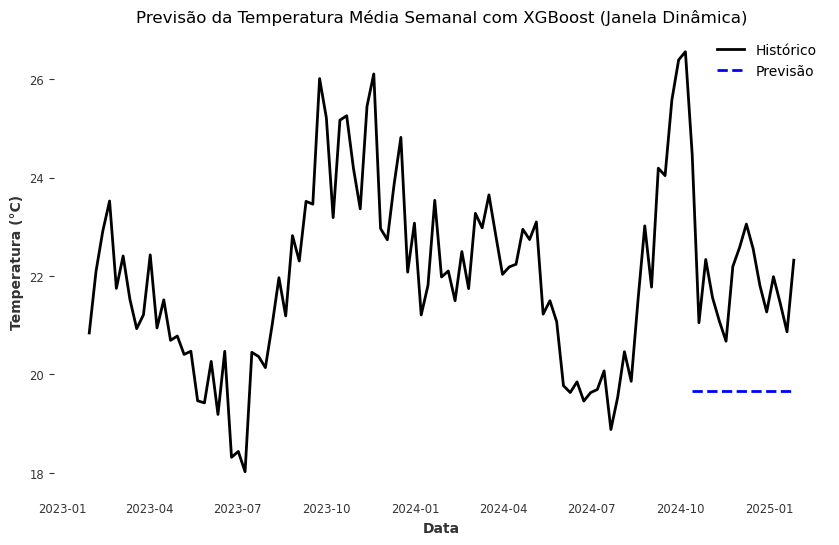

Exemplo 97:
X: [ 20.84305556  22.09642857  22.91309524  23.52321429  21.74880952
  22.40714286  21.52738095  20.93095238  21.21130952  22.42857143
  20.9452381   21.51607143  20.69345238  20.78095238  20.4077381
  20.47202381  19.46666667  19.42321429  20.26607143  19.18869048
  20.4702381   18.31785714  18.43690476  18.02559524  20.45059524
  20.36488095  20.13928571  21.00714286  21.96547619  21.18928571
  22.8202381   22.30416667  23.51607143  23.45892857  26.00952381
  25.2125      23.18571429  25.16488095  25.2547619   24.18571429
  23.36428571  25.44761905  26.10357143  22.96369048  22.73630952
  23.8625      24.81547619  22.07916667  23.07321429  21.20892857
  21.80952381  23.53690476  21.9797619   22.10178571  21.49880952
  22.49642857  21.74404762  23.27202381  22.97797619  23.64761905
  22.83005952  22.03392857  22.18511905  22.23869048  22.94880952
  22.74047619  23.09761905  21.22559524  21.49821429  21.07202381
  19.77261905  19.63363095  19.85059524  19.46071429  19.63125

In [65]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# 📌 Verificar versão do XGBoost
import xgboost
print(f"Versão do XGBoost: {xgboost.__version__}")

# 📌 Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# 📌 Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# 📌 Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# 📌 Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# 📌 Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# 📌 Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# 📌 Criar variáveis de entrada (X) e saída (y) usando Janela Dinâmica
X, y = [], []
for i in range(4, len(df_semanal)):  # Começa com 4 semanas e cresce ao longo do tempo
    entrada = df_semanal[coluna_temperatura].iloc[:i].values.tolist()  # Usa todas as semanas até a atual
    entrada.append(df_semanal['estacao'].iloc[i])  # Adiciona a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-1])  # Pegando a radiação da semana passada (FIXA)
    X.append(entrada) #substitui o pop - cria array a cada iteração sem modificar X diretamente
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura (Endógena)

X = np.array([np.pad(x, (0, max(len(max(X, key=len)) - len(x), 0)), 'constant') for x in X])  # Ajusta tamanhos diferentes
y = np.array(y)

# 📌 Divisão dos dados em Treino (70%), Validação (15%) e Teste (15%)
train_size = int(0.7 * len(X))
val_size = int(0.15 * len(X))

X_train, y_train = X[:train_size], y[:train_size]
X_val, y_val = X[train_size:train_size+val_size], y[train_size:train_size+val_size]
X_test, y_test = X[train_size+val_size:], y[train_size+val_size:]

# 📌 Definição do espaço de busca de hiperparâmetros para GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5],
    'min_child_weight': [1, 3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1],
    'lambda': [1, 2]
}

# 📌 Criar modelo base para otimização
xgb_base = XGBRegressor(objective='reg:squarederror', random_state=42)

# 📌 Aplicar GridSearchCV para encontrar os melhores hiperparâmetros
grid_search = GridSearchCV(
    estimator=xgb_base,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1,
    n_jobs=-1
)

# 📌 Executar a busca de hiperparâmetros
grid_search.fit(X_train, y_train)

# 📌 Exibir os melhores hiperparâmetros encontrados
best_params = grid_search.best_params_
print(f"🎯 Melhores hiperparâmetros: {best_params}")

# 📌 Criar o modelo otimizado com os melhores hiperparâmetros
model = XGBRegressor(**best_params)

# 📌 Treinar o modelo
try:
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric="rmse",
        early_stopping_rounds=10,
        verbose=True
    )
except TypeError:
    print("⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.")
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=True
    )

# 📌 Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# 📌 Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 📌 Função para calcular sMAPE
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

# 📌 Exibir métricas
print(f"📊 **Métricas do Modelo**")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 📌 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_semanal.index[-len(y_test):], y_pred, linestyle='dashed', color='blue', linewidth=2, label="Previsão")  # Linha tracejada azul
plt.title("Previsão da Temperatura Média Semanal com XGBoost (Janela Dinâmica)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

# Últimos 5 exemplos para garantir alinhamento correto
for i in range(len(X) - 5, len(X)):
    print(f"Exemplo {i+1}:")
    print(f"X: {X[i]}")
    print(f"y (temperatura prevista): {y[i]}\n")


print(f"Tamanho total de X: {len(X)}")
print(f"Tamanho do conjunto de treino: {len(X_train)}")
print(f"Tamanho do conjunto de validação: {len(X_val)}")
print(f"Tamanho do conjunto de teste: {len(X_test)}")

# Verificar se há datas repetidas entre treino e teste
overlap_train_val = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size:train_size+val_size])
overlap_train_test = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size+val_size:])
overlap_val_test = set(df_semanal.index[train_size:train_size+val_size]) & set(df_semanal.index[train_size+val_size:])

print(f"🔍 Número de datas repetidas entre Treino e Validação: {len(overlap_train_val)}")
print(f"🔍 Número de datas repetidas entre Treino e Teste: {len(overlap_train_test)}")
print(f"🔍 Número de datas repetidas entre Validação e Teste: {len(overlap_val_test)}")

y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)
y_test_pred = model.predict(X_test)


mae_train = mean_absolute_error(y_train, y_train_pred)
mae_val = mean_absolute_error(y_val, y_val_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)


print(f"📊 MAE Treino: {mae_train:.2f}")
print(f"📊 MAE Validação: {mae_val:.2f}")
print(f"📊 MAE Teste: {mae_test:.2f}")


Uso de treinamento, teste e validação e GridSearchcv, Radiação Fixa

Versão do XGBoost: 2.1.4
Fitting 3 folds for each of 384 candidates, totalling 1152 fits
🎯 Melhores hiperparâmetros: {'colsample_bytree': 0.8, 'gamma': 0.1, 'lambda': 1, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.8}
⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.
[0]	validation_0-rmse:2.42940
[1]	validation_0-rmse:2.31815
[2]	validation_0-rmse:2.20757
[3]	validation_0-rmse:2.08799
[4]	validation_0-rmse:2.01659
[5]	validation_0-rmse:1.97637
[6]	validation_0-rmse:1.94301
[7]	validation_0-rmse:1.86107
[8]	validation_0-rmse:1.84515
[9]	validation_0-rmse:1.78705
[10]	validation_0-rmse:1.76684
[11]	validation_0-rmse:1.73880
[12]	validation_0-rmse:1.70483
[13]	validation_0-rmse:1.69309
[14]	validation_0-rmse:1.67380
[15]	validation_0-rmse:1.66309
[16]	validation_0-rmse:1.64082
[17]	validation_0-rmse:1.62719
[18]	validation_0-rmse:1.62453
[19]	validation_0-rmse:1.61926
[20]	validation_0-rmse:1.60261
[21]	validation_0

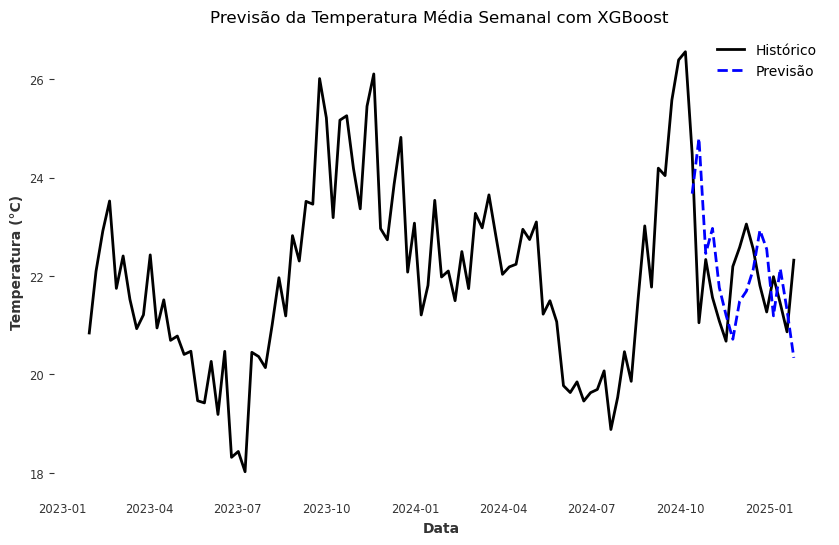

Exemplo 97:
X: [ 22.58095238  23.05505952  22.55297619  21.80535714   0.
 762.27927489]
y (temperatura prevista): 21.26964285714286

Exemplo 98:
X: [ 23.05505952  22.55297619  21.80535714  21.26964286   0.
 691.04304654]
y (temperatura prevista): 21.986309523809524

Exemplo 99:
X: [ 22.55297619  21.80535714  21.26964286  21.98630952   0.
 756.0023539 ]
y (temperatura prevista): 21.445833333333333

Exemplo 100:
X: [ 21.80535714  21.26964286  21.98630952  21.44583333   0.
 742.49047619]
y (temperatura prevista): 20.866071428571427

Exemplo 101:
X: [ 21.26964286  21.98630952  21.44583333  20.86607143   0.
 774.10126714]
y (temperatura prevista): 22.321250000000003

Tamanho total de X: 101
Tamanho do conjunto de treino: 70
Tamanho do conjunto de validação: 15
Tamanho do conjunto de teste: 16
🔍 Número de datas repetidas entre Treino e Validação: 0
🔍 Número de datas repetidas entre Treino e Teste: 0
🔍 Número de datas repetidas entre Validação e Teste: 0
📊 MAE Treino: 0.15
📊 MAE Validação: 1.

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# 📌 Verificar versão do XGBoost
import xgboost
print(f"Versão do XGBoost: {xgboost.__version__}")

# 📌 Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# 📌 Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# 📌 Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# 📌 Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# 📌 Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# 📌 Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

window_size = 4  # Define o tamanho da janela
X, y = [], []

for i in range(window_size, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-window_size:i].values.tolist()  # Apenas 4 semanas anteriores
    entrada.append(df_semanal['estacao'].iloc[i])  # Adiciona a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-1])  # Pegando a radiação da semana passada
    X.append(entrada) #substitui o pop - cria array a cada iteração sem modificar X diretamente
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura

X = np.array(X)
y = np.array(y)


# 📌 Divisão dos dados em Treino (70%), Validação (15%) e Teste (15%)
train_size = int(0.7 * len(X))
val_size = int(0.15 * len(X))

X_train, y_train = X[:train_size], y[:train_size]
X_val, y_val = X[train_size:train_size+val_size], y[train_size:train_size+val_size]
X_test, y_test = X[train_size+val_size:], y[train_size+val_size:]

# 📌 Definição do espaço de busca de hiperparâmetros para GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5],
    'min_child_weight': [1, 3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1],
    'lambda': [1, 2]
}

# 📌 Criar modelo base para otimização
xgb_base = XGBRegressor(objective='reg:squarederror', random_state=42)

# 📌 Aplicar GridSearchCV para encontrar os melhores hiperparâmetros
grid_search = GridSearchCV(
    estimator=xgb_base,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1,
    n_jobs=-1
)

# 📌 Executar a busca de hiperparâmetros
grid_search.fit(X_train, y_train)

# 📌 Exibir os melhores hiperparâmetros encontrados
best_params = grid_search.best_params_
print(f"🎯 Melhores hiperparâmetros: {best_params}")

# 📌 Criar o modelo otimizado com os melhores hiperparâmetros
model = XGBRegressor(**best_params)

# 📌 Treinar o modelo
try:
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric="rmse",
        early_stopping_rounds=10,
        verbose=True
    )
except TypeError:
    print("⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.")
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=True
    )

# 📌 Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# 📌 Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 📌 Função para calcular sMAPE
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

# 📌 Exibir métricas
print(f"📊 **Métricas do Modelo**")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 📌 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_semanal.index[-len(y_test):], y_pred, linestyle='dashed', color='blue', linewidth=2, label="Previsão")  # Linha tracejada azul
plt.title("Previsão da Temperatura Média Semanal com XGBoost ")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

# Últimos 5 exemplos para garantir alinhamento correto
for i in range(len(X) - 5, len(X)):
    print(f"Exemplo {i+1}:")
    print(f"X: {X[i]}")
    print(f"y (temperatura prevista): {y[i]}\n")


print(f"Tamanho total de X: {len(X)}")
print(f"Tamanho do conjunto de treino: {len(X_train)}")
print(f"Tamanho do conjunto de validação: {len(X_val)}")
print(f"Tamanho do conjunto de teste: {len(X_test)}")

# Verificar se há datas repetidas entre treino e teste
overlap_train_val = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size:train_size+val_size])
overlap_train_test = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size+val_size:])
overlap_val_test = set(df_semanal.index[train_size:train_size+val_size]) & set(df_semanal.index[train_size+val_size:])

print(f"🔍 Número de datas repetidas entre Treino e Validação: {len(overlap_train_val)}")
print(f"🔍 Número de datas repetidas entre Treino e Teste: {len(overlap_train_test)}")
print(f"🔍 Número de datas repetidas entre Validação e Teste: {len(overlap_val_test)}")

y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)
y_test_pred = model.predict(X_test)


mae_train = mean_absolute_error(y_train, y_train_pred)
mae_val = mean_absolute_error(y_val, y_val_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)


print(f"📊 MAE Treino: {mae_train:.2f}")
print(f"📊 MAE Validação: {mae_val:.2f}")
print(f"📊 MAE Teste: {mae_test:.2f}")



Validação dentro da etapa de treino - forma correta GridSearchCV

Versão do XGBoost: 2.1.4
Fitting 5 folds for each of 384 candidates, totalling 1920 fits
🎯 Melhores hiperparâmetros: {'colsample_bytree': 0.8, 'gamma': 0.1, 'lambda': 1, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.8}
📊 **Métricas do Modelo**
MAE: 1.11
MSE: 2.10
RMSE: 1.45
MAPE: 5.11%
sMAPE: 5.03%
R² Score: -1.42


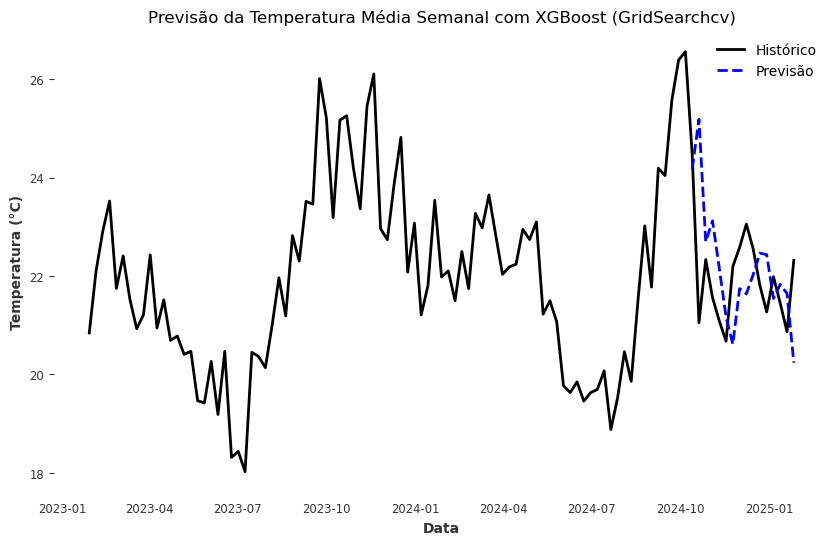

📊 MAE Treino: 0.14
📊 MAE Teste: 1.11


In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# 📌 Verificar versão do XGBoost
import xgboost
print(f"Versão do XGBoost: {xgboost.__version__}")

# 📌 Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# 📌 Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# 📌 Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# 📌 Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# 📌 Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# 📌 Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# 📌 Criar variáveis de entrada (X) e saída (y) usando Rolling Window com RADIAÇÃO FIXA
window_size = 4  # Janela deslizante de 4 semanas
X, y = [], []
for i in range(window_size, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-window_size:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-1])  # Pegando a radiação da semana passada (FIXA)
    X.append(entrada)
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura

X = np.array(X)
y = np.array(y)

# 📌 Divisão dos dados em Treino (85%) e Teste (15%)
train_size = int(0.85 * len(X))  # 85% para treino (inclui validação interna)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]  # 15% final para teste

# 📌 Definição do espaço de busca de hiperparâmetros para GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5],
    'min_child_weight': [1, 3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1],
    'lambda': [1, 2]
}

# 📌 Criar modelo base para otimização
xgb_base = XGBRegressor(objective='reg:squarederror', random_state=42)

# 📌 Usar TimeSeriesSplit para validação dentro do treino
tscv = TimeSeriesSplit(n_splits=5)

# 📌 Aplicar GridSearchCV para encontrar os melhores hiperparâmetros
grid_search = GridSearchCV(
    estimator=xgb_base,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=tscv,  # Validação cruzada dentro do treino
    verbose=1,
    n_jobs=-1
)

# 📌 Executar a busca de hiperparâmetros
grid_search.fit(X_train, y_train)

# 📌 Exibir os melhores hiperparâmetros encontrados
best_params = grid_search.best_params_
print(f"🎯 Melhores hiperparâmetros: {best_params}")

# 📌 Criar o modelo otimizado com os melhores hiperparâmetros
model = XGBRegressor(**best_params)

# 📌 Treinar o modelo diretamente em X_train (validação foi feita internamente)
model.fit(X_train, y_train)

# 📌 Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# 📌 Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 📌 Função para calcular sMAPE
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

# 📌 Exibir métricas
print(f"📊 **Métricas do Modelo**")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 📌 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_semanal.index[-len(y_test):], y_pred, linestyle='dashed', color='blue', linewidth=2, label="Previsão")
plt.title("Previsão da Temperatura Média Semanal com XGBoost (GridSearchcv)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

# 📌 Comparação dos erros nos diferentes conjuntos
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

mae_train = mean_absolute_error(y_train, y_train_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)

print(f"📊 MAE Treino: {mae_train:.2f}")
print(f"📊 MAE Teste: {mae_test:.2f}")


Uso de RandomSearchCV, validação 15% e Rolling Window Fixa de 4 semanas, Radiação Fixa

Versão do XGBoost: 2.1.4
Fitting 3 folds for each of 20 candidates, totalling 60 fits
🎯 Melhores hiperparâmetros: {'subsample': 1.0, 'n_estimators': 50, 'min_child_weight': 5, 'max_depth': 7, 'learning_rate': 0.05, 'lambda': 1, 'gamma': 0, 'colsample_bytree': 0.8}
⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.
[0]	validation_0-rmse:2.50559
[1]	validation_0-rmse:2.42561
[2]	validation_0-rmse:2.35168
[3]	validation_0-rmse:2.29558
[4]	validation_0-rmse:2.25320
[5]	validation_0-rmse:2.19120
[6]	validation_0-rmse:2.16848
[7]	validation_0-rmse:2.11004
[8]	validation_0-rmse:2.09102
[9]	validation_0-rmse:2.03777
[10]	validation_0-rmse:2.02073
[11]	validation_0-rmse:1.98476
[12]	validation_0-rmse:1.95737
[13]	validation_0-rmse:1.94452
[14]	validation_0-rmse:1.90223
[15]	validation_0-rmse:1.89148
[16]	validation_0-rmse:1.85998
[17]	validation_0-rmse:1.85095
[18]	validation_0-rmse:1.81660
[19]	validation_0-rmse:1.78324
[20]	validation_0-rmse:1.75013
[21]	validation_0-rmse

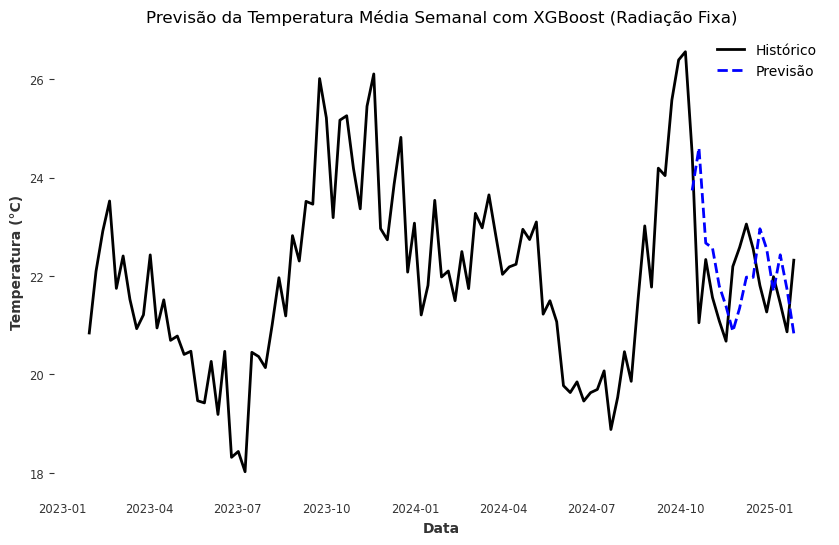

Exemplo 97:
X: [ 22.58095238  23.05505952  22.55297619  21.80535714   0.
 762.27927489]
y (temperatura prevista): 21.26964285714286

Exemplo 98:
X: [ 23.05505952  22.55297619  21.80535714  21.26964286   0.
 691.04304654]
y (temperatura prevista): 21.986309523809524

Exemplo 99:
X: [ 22.55297619  21.80535714  21.26964286  21.98630952   0.
 756.0023539 ]
y (temperatura prevista): 21.445833333333333

Exemplo 100:
X: [ 21.80535714  21.26964286  21.98630952  21.44583333   0.
 742.49047619]
y (temperatura prevista): 20.866071428571427

Exemplo 101:
X: [ 21.26964286  21.98630952  21.44583333  20.86607143   0.
 774.10126714]
y (temperatura prevista): 22.321250000000003

Tamanho total de X: 101
Tamanho do conjunto de treino: 70
Tamanho do conjunto de validação: 15
Tamanho do conjunto de teste: 16
🔍 Número de datas repetidas entre Treino e Validação: 0
🔍 Número de datas repetidas entre Treino e Teste: 0
🔍 Número de datas repetidas entre Validação e Teste: 0
📊 MAE Treino: 0.43
📊 MAE Validação: 1.

In [68]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# 📌 Verificar versão do XGBoost
import xgboost
print(f"Versão do XGBoost: {xgboost.__version__}")

# 📌 Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# 📌 Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# 📌 Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# 📌 Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# 📌 Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# 📌 Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# 📌 Criar variáveis de entrada (X) e saída (y) usando Rolling Window com RADIAÇÃO FIXA
window_size = 4  # Janela deslizante de 4 semanas
X, y = [], []
for i in range(window_size, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-window_size:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-1])  # Pegando a radiação da semana passada (FIXA)
    X.append(entrada) #substitui o pop - cria array a cada iteração sem modificar X diretamente
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura (Endógena)

X = np.array(X)
y = np.array(y)

# 📌 Divisão dos dados em Treino (70%), Validação (15%) e Teste (15%)
train_size = int(0.7 * len(X))
val_size = int(0.15 * len(X))

X_train, y_train = X[:train_size], y[:train_size]
X_val, y_val = X[train_size:train_size+val_size], y[train_size:train_size+val_size]
X_test, y_test = X[train_size+val_size:], y[train_size+val_size:]

# 📌 Definição do espaço de busca de hiperparâmetros para RandomizedSearchCV
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3],
    'lambda': [1, 1.5, 2]
}

# 📌 Criar modelo base para otimização
xgb_base = XGBRegressor(objective='reg:squarederror', random_state=42)

# 📌 Aplicar RandomizedSearchCV para encontrar os melhores hiperparâmetros
random_search = RandomizedSearchCV(
    estimator=xgb_base,
    param_distributions=param_grid,
    n_iter=20,  # Número de combinações a serem testadas
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

# 📌 Executar a busca de hiperparâmetros
random_search.fit(X_train, y_train)

# 📌 Exibir os melhores hiperparâmetros encontrados
best_params = random_search.best_params_
print(f"🎯 Melhores hiperparâmetros: {best_params}")

# 📌 Criar o modelo otimizado com os melhores hiperparâmetros
model = XGBRegressor(**best_params)

# 📌 Treinar o modelo
try:
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric="rmse",
        early_stopping_rounds=10,
        verbose=True
    )
except TypeError:
    print("⚠️ `early_stopping_rounds` não suportado. Treinando sem early stopping.")
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=True
    )

# 📌 Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# 📌 Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 📌 Função para calcular sMAPE
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

# 📌 Exibir métricas
print(f"📊 **Métricas do Modelo**")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 📌 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_semanal.index[-len(y_test):], y_pred, linestyle='dashed', color='blue', linewidth=2, label="Previsão")  # Linha tracejada azul
plt.title("Previsão da Temperatura Média Semanal com XGBoost (Radiação Fixa)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

# Últimos 5 exemplos para garantir alinhamento correto
for i in range(len(X) - 5, len(X)):
    print(f"Exemplo {i+1}:")
    print(f"X: {X[i]}")
    print(f"y (temperatura prevista): {y[i]}\n")


print(f"Tamanho total de X: {len(X)}")
print(f"Tamanho do conjunto de treino: {len(X_train)}")
print(f"Tamanho do conjunto de validação: {len(X_val)}")
print(f"Tamanho do conjunto de teste: {len(X_test)}")

# Verificar se há datas repetidas entre treino e teste
overlap_train_val = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size:train_size+val_size])
overlap_train_test = set(df_semanal.index[:train_size]) & set(df_semanal.index[train_size+val_size:])
overlap_val_test = set(df_semanal.index[train_size:train_size+val_size]) & set(df_semanal.index[train_size+val_size:])

print(f"🔍 Número de datas repetidas entre Treino e Validação: {len(overlap_train_val)}")
print(f"🔍 Número de datas repetidas entre Treino e Teste: {len(overlap_train_test)}")
print(f"🔍 Número de datas repetidas entre Validação e Teste: {len(overlap_val_test)}")

y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)
y_test_pred = model.predict(X_test)


mae_train = mean_absolute_error(y_train, y_train_pred)
mae_val = mean_absolute_error(y_val, y_val_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)


print(f"📊 MAE Treino: {mae_train:.2f}")
print(f"📊 MAE Validação: {mae_val:.2f}")
print(f"📊 MAE Teste: {mae_test:.2f}")



Validação dentro da etapa de treino - forma correta

Versão do XGBoost: 2.1.4
Fitting 5 folds for each of 20 candidates, totalling 100 fits
🎯 Melhores hiperparâmetros: {'subsample': 0.8, 'n_estimators': 300, 'min_child_weight': 5, 'max_depth': 3, 'learning_rate': 0.2, 'lambda': 1.5, 'gamma': 0.1, 'colsample_bytree': 0.8}
📊 **Métricas do Modelo**
MAE: 1.04
MSE: 1.97
RMSE: 1.40
MAPE: 4.80%
sMAPE: 4.75%
R² Score: -1.26


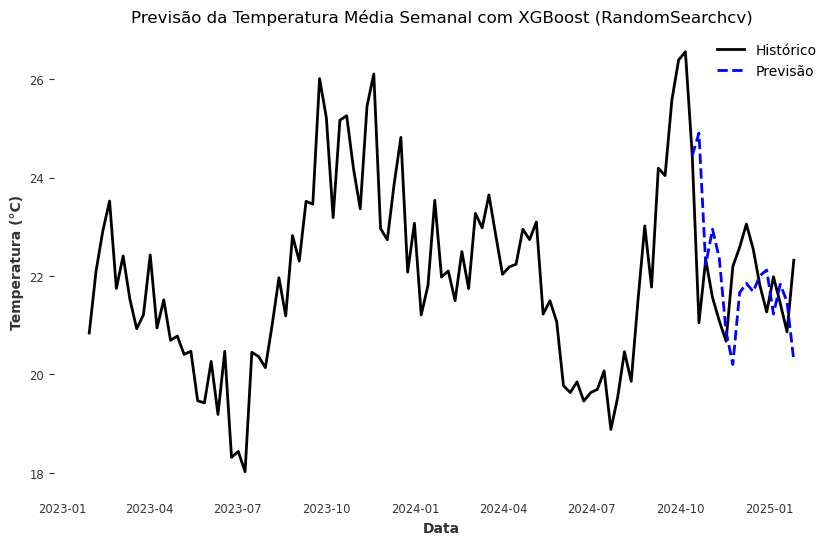

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

# 📌 Verificar versão do XGBoost
import xgboost
print(f"Versão do XGBoost: {xgboost.__version__}")

# 📌 Função para determinar a estação do ano em Brasília (1 = Seca, 0 = Chuvosa)
def estacao_do_ano(data):
    mes = data.month
    return 1 if mes in [5, 6, 7, 8, 9] else 0

# 📌 Selecionar apenas colunas numéricas para a média semanal
df_numerico = df_interpolado.select_dtypes(include=['number'])

# 📌 Agregar a temperatura e a radiação em médias semanais
df_semanal = df_numerico.resample('W').mean()

# 📌 Criar a variável de estação do ano
df_semanal['estacao'] = df_semanal.index.map(estacao_do_ano)

# 📌 Identificar a coluna de temperatura
coluna_temperatura = [col for col in df_semanal.columns if "temp" in col.lower()]
if not coluna_temperatura:
    raise KeyError("Nenhuma coluna de temperatura encontrada! Verifique os nomes das colunas.")
coluna_temperatura = coluna_temperatura[0]

# 📌 Identificar a coluna de radiação
coluna_radiacao = [col for col in df_semanal.columns if "radiacao" in col.lower() or "solar" in col.lower()]
if not coluna_radiacao:
    raise KeyError("Nenhuma coluna de radiação encontrada! Verifique os nomes das colunas.")
coluna_radiacao = coluna_radiacao[0]

# 📌 Criar variáveis de entrada (X) e saída (y) usando Rolling Window com RADIAÇÃO FIXA
window_size = 4  # Janela deslizante de 4 semanas
X, y = [], []
for i in range(window_size, len(df_semanal)):
    entrada = df_semanal[coluna_temperatura].iloc[i-window_size:i].values.tolist()
    entrada.append(df_semanal['estacao'].iloc[i])  # Adicionando a sazonalidade
    entrada.append(df_semanal[coluna_radiacao].iloc[i-1])  # Pegando a radiação da semana passada (FIXA)
    X.append(entrada)  # Criação dinâmica sem modificar `X`
    y.append(df_semanal[coluna_temperatura].iloc[i])  # Prevendo temperatura

X = np.array(X)
y = np.array(y)

# 📌 Divisão dos dados em Treino (85%) e Teste (15%)
train_size = int(0.85 * len(X))  # 85% para treino (inclui validação interna)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]  # 15% final para teste

# 📌 Definição do espaço de busca de hiperparâmetros para RandomizedSearchCV
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3],
    'lambda': [1, 1.5, 2]
}

# 📌 Criar modelo base para otimização
xgb_base = XGBRegressor(objective='reg:squarederror', random_state=42)

# 📌 Usar TimeSeriesSplit para validação dentro do treino
tscv = TimeSeriesSplit(n_splits=5)

# 📌 Aplicar RandomizedSearchCV para encontrar os melhores hiperparâmetros
random_search = RandomizedSearchCV(
    estimator=xgb_base,
    param_distributions=param_grid,
    n_iter=20,  # Número de combinações a serem testadas
    scoring='neg_mean_squared_error',
    cv=tscv,  # Usa validação cruzada no treino
    verbose=1,
    n_jobs=-1,
    random_state=42
)

# 📌 Executar a busca de hiperparâmetros
random_search.fit(X_train, y_train)

# 📌 Exibir os melhores hiperparâmetros encontrados
best_params = random_search.best_params_
print(f"🎯 Melhores hiperparâmetros: {best_params}")

# 📌 Criar o modelo otimizado com os melhores hiperparâmetros
model = XGBRegressor(**best_params)

# 📌 Treinar o modelo diretamente em X_train (validação foi feita internamente)
model.fit(X_train, y_train)

# 📌 Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# 📌 Calcular métricas de erro
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 📌 Função para calcular sMAPE
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

smape_value = smape(y_test, y_pred)

# 📌 Exibir métricas
print(f"📊 **Métricas do Modelo**")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")
print(f"sMAPE: {smape_value:.2f}%")
print(f"R² Score: {r2:.2f}")

# 📌 Plotar a previsão junto com os dados históricos
plt.figure(figsize=(10, 6))
plt.plot(df_semanal.index, df_semanal[coluna_temperatura], label="Histórico", linewidth=2, color='black')
plt.plot(df_semanal.index[-len(y_test):], y_pred, linestyle='dashed', color='blue', linewidth=2, label="Previsão")  
plt.title("Previsão da Temperatura Média Semanal com XGBoost (RandomSearchcv)")
plt.xlabel("Data")
plt.ylabel("Temperatura (°C)")
plt.legend()
plt.grid()
plt.show()

